<a href="https://colab.research.google.com/github/thaisflopes/projeto_de_pesquisa_judicializacao_transporte_aereo/blob/main/Meta_A04_Bases_de_dados.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Projeto de Pesquisa "Diagnóstico sobre a Judicialização do Transporte Aéreo no Brasil: Uma aplicação de Aprendizado de Máquina"

Revisão de 09/11/2024

# Meta A04 - Bases de Dados

Este relatório visa consolidar as bases de dados após o retorno das aéreas e da empresa responsável pela raspagem da jurimetria, com a revisão dos dados fornecidos

# Inicialização do notebook

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set(color_codes=True)

### Habilitando a opção de Tabelas Dinâmicas no Google Colab

Veja mais detalhes em https://colab.research.google.com/notebooks/data_table.ipynb

In [ ]:
# from google.colab import data_table
# data_table.enable_dataframe_formatter()

### Lendo os Dados no Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/Judicializacao

/content/drive/My Drive/Colab Notebooks/Judicializacao


# Definição de Funções de Transformação das Variáveis

* empresa_re: nome da empresa ré no processo
* cnpj_re: CNPJ da empresa ré no processo
* data_distribuicao: data de distribuição do processo
* UF: unidade da federação onde o processo foi distribuído
* jurisdicao: classificação do tribunal onde tramita o processo
* obj_principal:
** subobj_principal:
** obj_problemas_operacionais:
** obj_bagagem':
** obj_contrato:
** obj_outros:
* causa_alegada
** causa_nao_informado:
** causa_forca_maior:
** causa_fortuitos:
** causa_terceiros:
** causa_cliente:
** causa_aerea:
** causa_outros:
* valor_pedido_inicial:
* n_autores:
* data_voo:
* operacao:
* situacao_processual:
* instancia:
* resultado_decisao_sentenca:
* data_sentenca:
* valor_dano_moral:
* valor_dano_material:
* valor_total_condenacao:
* data_acordao:
* valor_pago:

## Ajuste da coluna empresa_re

In [ ]:
def ajuste_empresa_re(df):
  df['empresa_re'] = df['empresa_re'].replace(pd.NA,'')
  empresa_re_aereas_dic = {
    'Azul': 'Azul',
    'Azul Conecta Ltda': 'Azul',
    'AZUL LINHAS AEREAS': 'Azul',
    'Azul Linhas Aereas': 'Azul',
    'Azul Linhas Aéreas': 'Azul',
    'AZUL SA': 'Azul',
    'AZUL VIAGENS': 'Azul',
    'TUDO AZUL': 'Azul',
    'Copa': 'Copa',
    'COMPANIA PANAMENA DE AVIACION': 'Copa',
    'Copa - Compañia Panameña De Aviacion S.a': 'Copa',
    'COPA Airlines': 'Copa',
    'Copa Linhas Aereas': 'Copa',
    'Gol': 'Gol',
    'GLAI': 'Gol',
    'GOL': 'Gol',
    'GOL ': 'Gol',
    'GOL  ': 'Gol',
    'GOL E SMILES': 'Gol',
    'GOL LINHAS AÉREAS': 'Gol',
    'GOL Linhas Aéreas': 'Gol',
    'Gol Linhas Aéreas': 'Gol',
    'GOL LINHAS AÉREAS INTELIGENTES S.A': 'Gol',
    'GOL LINHAS AEREAS INTELIGENTES S.A': 'Gol',
    'GOL LINHAS AÉREAS INTELIGENTES S.A. ': 'Gol',
    'GOL LINHAS AEREAS INTELIGENTES S.A.': 'Gol',
    'GOL LINHAS AÉREAS S.A': 'Gol',
    'GOL LINHAS AEREAS S.A': 'Gol',
    'GOL LINHAS AÉREAS S.A.': 'Gol',
    'GOL LINHAS AEREAS S.A.': 'Gol',
    'GOL - LINHAS AEREAS S.A.': 'Gol',
    'GOL - LINHAS AEREAS INTELIGENTES S.A.': 'Gol',
    'GOL TRANSPORTES': 'Gol',
    'GOL TRANSPORTES ': 'Gol',
    'GOL TRANSPORTES AÉREOS S/A': 'Gol',
    'LAN': 'Latam',
    'Latam': 'Latam',
    'LATAM AIRLINES BRASIL': 'Latam',
    'LATAM AIRLINES GROUP': 'Latam',
    'LATAM Airlines': 'Latam',
    'SMILES': 'Gol',
    'SMILES  ': 'Gol',
    'SMILES FIDELIDADE S.A.': 'Gol',
    'SMILES S.A.': 'Gol',
    'TAM LINHAS': 'Latam',
    'TAM LINHAS AÉREAS': 'Latam',
    'TAM Linhas Aéreas': 'Latam',
    'TAM VIAGENS': 'Latam',
    'Tap': 'Tap',
    'TAP Airlines': 'Tap',
    'TAP-Transportes Aéreos Portugueses S/A': 'Tap',
    'Transportes Aéreos Portugueses S/A': 'Tap',
    'TRANSPORTES AEREOS PORTUGUESES SA': 'Tap',
    'United': 'United',
    'United Airlines': 'United',
    'United Airlines Inc.': 'United',
    'VRG': 'Gol',
    'VRG E SMILES': 'Gol',
    'VRG LINHAS AÉREAS S.A. posterior a 09/04/2007': 'Gol',
    'VRG TRANSPORTES AÉREOS S/A -': 'Gol',
    '': 'Não informado',
    'Não informado': 'Não informado'
  }
  df['empresa_re'] = df.empresa_re.map(empresa_re_aereas_dic)
  return df

## Ajuste da coluna cnpj_re

In [ ]:
def ajuste_cnpj_re(df):
  df['cnpj_re'] = df['cnpj_re'].replace(pd.NA,'')
  df['cnpj_re'] = df['cnpj_re'].replace('', 'Não informado')
  df['cnpj_re'] = df.cnpj_re.astype(str)
  return df

## Ajuste da coluna data_distribuicao

In [ ]:
def ajuste_data_distribuicao(df):
  df['data_distribuicao'] = df['data_distribuicao'].fillna('')
  df['data_distribuicao'] = df.data_distribuicao.astype(str)
  df['data_distribuicao'] = df['data_distribuicao'].str.slice(0,10)
# df['data_distribuicao'] = pd.to_datetime(df['data_distribuicao'],
#                                errors='coerce',format='%Y-%m-%d')
  return df

## Ajuste da coluna UF

In [ ]:
def ajuste_uf(df):
  df['UF'] = df['UF'].fillna('')
  df['UF'] = df['UF'].replace('', 'Não informado')
  UF_aereas_dic = {
    'AC': 'AC',
    'Acre': 'AC',
    'AL': 'AL',
    'Alagoas': 'AL',
    'Maceió': 'AL',
    'AP': 'AP',
    'Amapá': 'AP',
    'AM': 'AM',
    'Amazonas': 'AM',
    'Manaus': 'AM',
    'BA': 'BA',
    'Bahia': 'BA',
    'CE': 'CE',
    'Ceará': 'CE',
    'DF': 'DF',
    'Distrito Federal': 'DF',
    'Brasília': 'DF',
    'ES': 'ES',
    'Espírito Santo': 'ES',
    'Espirito Santo': 'ES',
    'GO': 'GO',
    'Goiás': 'GO',
    'MA': 'MA',
    'Maranhão': 'MA',
    'MS': 'MS',
    'Mato Grosso do Sul': 'MS',
    'MT': 'MT',
    'Mato Grosso': 'MT',
    'MG': 'MG',
    'Minas Gerais': 'MG',
    'Panama': 'Não informado',
    'PA': 'PA',
    'Pará': 'PA',
    'PB': 'PB',
    'Paraíba': 'PB',
    'PR': 'PR',
    'Paraná': 'PR',
    'Parana': 'PR',
    'PE': 'PE',
    'Pernambuco': 'PE',
    'PI': 'PI',
    'Piauí': 'PI',
    'RJ': 'RJ',
    'Rio de Janeiro': 'RJ',
    'RN': 'RN',
    'Rio Grande do Norte': 'RN',
    'RS': 'RS',
    'Rio Grande do Sul': 'RS',
    'RO': 'RO',
    'Rondônia': 'RO',
    'RR': 'RR',
    'Roraima': 'RR',
    'SC': 'SC',
    'Santa Catarina': 'SC',
    'SP': 'SP',
    'São Paulo': 'SP',
    'SE': 'SE',
    'Sergipe': 'SE',
    'TO': 'TO',
    'Tocantins': 'TO',
    'Não informado': 'Não informado'
  }
  df['UF'] = df.UF.map(UF_aereas_dic)
  return df

## Ajuste da coluna jurisdicao

In [ ]:
def ajuste_jurisdicao(df):
  df['jurisdicao'] = df['jurisdicao'].fillna('')

  # Determinação das diferenças entre a coluna 'jurisdicao' de df e jurisdicao_classificacao
  jurisdicao_clas = pd.read_csv('./data_classification/jurisdicao_classificacao.csv')
  jurisdicao_unique = pd.unique(jurisdicao_clas[['valor_original']].values.ravel()).astype(str)
  jurisdicao_unique = list(sorted(jurisdicao_unique))
  data_jurisdicao_unique = pd.unique(df[['jurisdicao']].values.ravel())
  data_jurisdicao_unique = list(sorted(data_jurisdicao_unique))
  novos_jurisdicao = list(set(data_jurisdicao_unique) - set(jurisdicao_unique))

  if len(novos_jurisdicao) > 0:

    # Atualização de jurisdicao_classificacao
    jurisdicao_lista = []
    for i in range(len(novos_jurisdicao)):
      jurisdicao_lista.append(novos_jurisdicao[i])

    nova_jurisdicao_lista = []
    for i in jurisdicao_lista:
      if "especial" in i.lower():
        nova_jurisdicao_lista.append('Juizado Especial Cível')
      elif "vara" in i.lower():
        nova_jurisdicao_lista.append('Vara Cível')
      elif "cível" in i.lower() or "cíveis" in i.lower():
        nova_jurisdicao_lista.append('Vara Cível')
      elif "comum" in i.lower():
        nova_jurisdicao_lista.append('Vara Cível')
      elif i == '':
        nova_jurisdicao_lista.append('Não informado')
      else:
        nova_jurisdicao_lista.append('Outros')

    nova_jurisdicao_clas = pd. DataFrame({
      'valor_original': jurisdicao_lista,
      'novo_valor': nova_jurisdicao_lista
    })

    jurisdicao_clas = pd.concat([jurisdicao_clas,
                            nova_jurisdicao_clas],
                            axis=0,ignore_index=True)

    jurisdicao_clas.to_csv('./data_classification/jurisdicao_classificacao.csv',index=False)

  # Redução de jurisdicao_clas para criar dicionário somente com coluna 'jurisdicao'
  juris_clas = jurisdicao_clas[jurisdicao_clas.valor_original.
           isin(df.jurisdicao)].groupby(['valor_original',
           'novo_valor']).size().reset_index().rename(columns={0:'count'})
  juris_clas = juris_clas.drop(['count'], axis=1)
  juris_clas.set_index('valor_original',inplace=True)
  juris_clas_dict = juris_clas.to_dict()
  df['jurisdicao'] = df.jurisdicao.map(juris_clas_dict['novo_valor'])
  return df


## Classificação do Objeto + Subobjeto e da Causa

In [ ]:
def classificacao_obj_subobj_causa(df):

  df.obj_principal = df.obj_principal.fillna('')
  df.subobj_principal = df.subobj_principal.fillna('')
  df.causa_alegada = df.causa_alegada.fillna('')

  # Fusão dos campos Objeto e Subobjeto
  df['obj_subobj_principal'] = df['obj_principal'] + ' ' + df['subobj_principal']
  df['causa_obj_subobj'] = df['causa_alegada'] + ' ' + df['obj_subobj_principal']

  # Palavras-chave do Objeto
  obj_keyword_problemas_operacionais = [
    'acidente','aeroporto','aeronave','alteração','assento','assiatance',
    'assistência','atendimento','atr.','atraso','avião','cadeira de rodas',
    'cambio','canc.','cancel','catering','check in','conex','demora','denied',
    'delay','desembarque','dowgrade','downgrade','embarque','espaço','falha',
    'flight','fretamento','incidente','malha','manutenção','menor desacompanhado',
    'overbooking','dano a passageiro','poltrona','pontualidade',
    'problemas operacionais','refeição','remarcação','segurança','service',
    'serviço','schedule','sobreventa','solicitação especial','tripulação','voo'
  ]
  obj_keyword_bagagem = ['anima','bagagem','baggage','carg','equipaje','extravio']
  obj_keyword_contrato = [
    'bilhete','boleto','cadastro','call center','clube',
    'cobrança','contrato','corona','covid','diverg','document','economy','fee',
    'fidelidade','fraud','flyer','milhas','multa','multiplus','show','pass',
    'plusgrade','políticas','pontuação','prescrição','producto','programa',
    'promoç','propaganda','reembolso','regra','reimbursement','requisitos de viaje',
    'reserva','seguro','site','tarifa','taxa','upgrade','prorrogação de voucher','viag'
  ]

  # Palavras-chave da Causa
  causa_keyword_aerea = [
    'abastecimento','aeronave','ajuda técnica','bagagem','cancelamento indevido',
    'carga','cargo','cco','clube tudoazul','cobrança equivocada','conexão',
    'culpa tam','divergência de informaç','empresa','entrega','falha','impedimento',
    'malha','manutenção','oferta não cumprida','operacional','overbooking',
    'overload','pontuação não creditada','planejamento','reembolso','regra',
    'reserva','segurança','serviço','transporte terrestre','tripula','voo'
  ]
  causa_keyword_cliente = [
    'ausência de responsabilidade','autor','bagagem de mão',
    'bagagem entregue dentro do prazo legal','comprovação','cliente',
    'compra não reconhecida','direito de arrependimento','documentação',
    'exclusiva','inconformidade','não verificada ocorr','no show','pax',
    'pontos expirados','prescrição'
  ]
  causa_keyword_terceiros = [
    'aeroport','agência','externo','fraude','ilícito','imigração','terceiro','tráfego'
  ]
  causa_keyword_fortuitos = ['fortuito']
  causa_keyword_forcamaior = [
    'condições climáticas','corona','covid','força maior','force majeure',
    'tempo ','meteorologia','weather'
  ]
  # não informado inclui as palavras abaixo ou células vazias em causa_alegada
  causa_keyword_naoinformado = [
    'não aplicável','não informado','informação inexistente','pi não apurado','subsídios negativos'
  ]

  # Inclusão das novas colunas de Objeto
  df['obj_problemas_operacionais'] = df.obj_subobj_principal. \
    apply(lambda x: any([i in x.lower() for i in obj_keyword_problemas_operacionais]))
  df['obj_bagagem'] = df.obj_subobj_principal. \
    apply(lambda x: any([i in x.lower() for i in obj_keyword_bagagem]))
  df['obj_contrato'] = df.obj_subobj_principal. \
    apply(lambda x: any([i in x.lower() for i in obj_keyword_contrato]))
  df['obj_outros'] = ~(df.obj_problemas_operacionais +
                      df.obj_bagagem +
                      df.obj_contrato)

    # outras opções de código para mapear as colunas
    #df.obj_subobj_principal.str.lower().str.contains('|'.join(obj_keyword_problemas_operacionais), case=False)
    #df.obj_subobj_principal.apply(lambda x: any([i in x.lower() for i in obj_keyword_problemas_operacionais]))
    #[any([i in x.lower() for i in obj_keyword_problemas_operacionais]) for x in data_aereas.obj_subobj_principal]

  # Inclusão das novas colunas de Causa
  df['causa_nao_informado'] = df.causa_alegada. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_naoinformado or
                         x.isspace()]))
  df['causa_forca_maior'] = df.causa_obj_subobj. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_forcamaior])) & \
    ~df.causa_nao_informado
  df['causa_fortuitos'] = df.causa_obj_subobj. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_fortuitos])) & \
    ~df.causa_nao_informado & ~df.causa_forca_maior
  df['causa_terceiros'] = df.causa_obj_subobj. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_terceiros])) & \
    ~df.causa_nao_informado & ~df.causa_forca_maior & ~df.causa_fortuitos
  df['causa_cliente'] = df.causa_obj_subobj. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_cliente])) & \
    ~df.causa_nao_informado & ~df.causa_forca_maior & \
    ~df.causa_fortuitos & ~df.causa_terceiros
  df['causa_aerea'] = df.causa_obj_subobj. \
    apply(lambda x: any([i in x.lower() for i in causa_keyword_aerea])) & \
    ~df.causa_nao_informado & ~df.causa_forca_maior & \
    ~df.causa_fortuitos & ~df.causa_terceiros & \
    ~df.causa_cliente
  df['causa_outros'] = ~df.causa_nao_informado & \
    ~df.causa_forca_maior & ~df.causa_fortuitos & \
    ~df.causa_terceiros & ~df.causa_cliente & \
    ~df.causa_aerea
  df = df.drop(columns=['obj_subobj_principal','causa_obj_subobj'])
  return df

## Ajuste da coluna valor_pedido_inicial

In [ ]:
def ajuste_valor_pedido_inicial(df):
  df['valor_pedido_inicial'] = df['valor_pedido_inicial'].replace(['Unspecified',
                                                      '#N/D','ISABELA'], '0')

  df['valor_pedido_inicial'] = df['valor_pedido_inicial'].astype(str)

  df['valor_pedido_inicial'] = df['valor_pedido_inicial'].str.strip()

  df['valor_pedido_inicial'] = df['valor_pedido_inicial'].str.replace(r'R\$?\s*[-]?', '', regex=True)

  # df['valor_pedido_inicial'] = df['valor_pedido_inicial'].replace('', '0')

  if df['valor_pedido_inicial'].str.contains(',', regex=False).any():
    df['valor_pedido_inicial'] = df['valor_pedido_inicial'].str.replace('.', '')
    df['valor_pedido_inicial'] = df['valor_pedido_inicial'].str.replace(',', '.')

  df['valor_pedido_inicial'] = pd.to_numeric(df['valor_pedido_inicial'], errors='coerce').fillna(0)

  df['valor_pedido_inicial'] = df['valor_pedido_inicial'].astype(float)

  return df

## Ajuste da coluna n_autores

In [ ]:
def ajuste_n_autores(df):
  df['n_autores'] = df['n_autores'].fillna('0')
  df['n_autores'] = df['n_autores'].replace('', '0')
  df['n_autores'] = df['n_autores'].replace('#N/D', '0')

  for index, value in df['n_autores'].items():
    if isinstance(value,str) and not value.isdigit() and value != '0':
      df.at[index, 'n_autores'] = value.count('/') + 1

  df['n_autores'] = df['n_autores'].astype(int)

  return df

## Ajuste da coluna data_voo

In [ ]:
def ajuste_data_voo(df):
  df['data_voo'] = df['data_voo'].fillna('')
  df['data_voo'] = df.data_voo.astype(str)
  df['data_voo'] = df['data_voo'].str.slice(0,10)
  # df['data_voo'] = pd.to_datetime(df['data_voo'],
  #                               errors='coerce',format='%Y-%m-%d')
  return df

## Ajuste da coluna operacao

In [ ]:
def ajuste_operacao(df):
  df['operacao'] = df['operacao'].replace(pd.NA, '-') #fillna('')

  # Determinação das diferenças entre a coluna 'operacao' de df e operacao_classificacao
  operacao_classificacao = pd.read_csv('./data_classification/operacao_classificacao.csv') #,delimiter=';')
  ops_clas_unique = pd.unique(operacao_classificacao[['operacao_original']].astype(str).values.ravel())
  ops_clas_unique = list(sorted(ops_clas_unique))
  data_aer_unique = pd.unique(df[['operacao']].astype(str).values.ravel())
  data_aer_unique = list(sorted(data_aer_unique))
  novos_ops_clas = list(set(data_aer_unique) - set(ops_clas_unique))

  if len(novos_ops_clas) > 0:

    # Atualização de operacao_classificacao
    operacao_original_lista = []
    for i in range(len(novos_ops_clas)):
      operacao_original_lista.append(novos_ops_clas[i])
    operacao_reclassificado_lista = ['Doméstico']*len(novos_ops_clas)
    operacao_classificacao_novos = pd. DataFrame({
      'operacao_original': operacao_original_lista,
      'operacao_reclassificado': operacao_reclassificado_lista
    })
    operacao_classificacao = pd.concat([operacao_classificacao,
                          operacao_classificacao_novos],
                          axis=0,ignore_index=True)

    operacao_classificacao.to_csv('./data_classification/operacao_classificacao.csv',index=False)

  # Redução de operacao_classificacao em dicionário somente com elementos de df
  ops_clas = operacao_classificacao[operacao_classificacao.operacao_original.
           isin(df.operacao)].groupby(['operacao_original',
           'operacao_reclassificado']).size().reset_index().rename(columns={0:'count'})
  ops_clas = ops_clas.drop(['count'], axis=1)
  ops_clas.set_index('operacao_original',inplace=True)
  ops_clas_dict = ops_clas.to_dict()
  df['operacao'] = df.operacao.map(ops_clas_dict['operacao_reclassificado']).astype(str)

  # Ajuste final de classificações anteriores não detectadas
  df['operacao'] = df['operacao'].str.replace('OPERAÇÃO','Doméstico')
  df['operacao'] = df['operacao'].replace('-', 'Não informado')
  return df

## Ajuste das colunas situacao_processual e resultado_decisao_sentenca

In [ ]:
def ajuste_situacao_processual(df):
  df['situacao_processual'] = df['situacao_processual'].fillna('')
  df['resultado_decisao_sentenca'] = df['resultado_decisao_sentenca'].fillna('')
  df['situacao_processual_sentenca'] = df['situacao_processual'] + df['resultado_decisao_sentenca']

  # Diferenças entre a 'situacao_processual_sentenca'e situacao_sentenca

  # Definição do DataFrame situacao_sentenca
  situacao_sentenca = pd.read_csv('./data_classification/situacao_processual_sentenca.csv', delimiter=';')
  situacao_sentenca['situacao_processual'] = situacao_sentenca['situacao_processual'].fillna('')
  situacao_sentenca['situacao_processual'] = situacao_sentenca['situacao_processual'].replace('***', '')
  situacao_sentenca['resultado_decisao'] = situacao_sentenca['resultado_decisao'].fillna('')
  situacao_sentenca['situacao_processual_sentenca'] = situacao_sentenca['situacao_processual'] + \
                   situacao_sentenca['resultado_decisao']
  situacao_sentenca = situacao_sentenca.drop(columns=['situacao_processual', 'resultado_decisao'])
  situacao_sentenca = situacao_sentenca.iloc[:, ::-1]

  # Atualização de situacao_sentenca com diferença de 'situacao_processual_sentenca'
  situacao_sentenca_unique = pd.unique(situacao_sentenca[['situacao_processual_sentenca']].
                                 values.ravel())
  situacao_sentenca_unique = list(sorted(situacao_sentenca_unique))
  data_sentenca_unique = pd.unique(df[['situacao_processual_sentenca']].values.ravel())
  data_sentenca_unique = list(sorted(data_sentenca_unique))
  novos_sentenca = list(set(data_sentenca_unique) - set(situacao_sentenca_unique))

  situacao_processual_sentenca_lista = []
  for i in range(len(novos_sentenca)):
    situacao_processual_sentenca_lista.append(novos_sentenca[i])

  nova_situacao_processual_lista = []
  for i in situacao_processual_sentenca_lista:
    if "EXTINÇÃO" in i:
      nova_situacao_processual_lista.append('Extinção sem julgamento do mérito')
    elif "ACORDO" in i:
      nova_situacao_processual_lista.append('Acordo')
    elif "DESFAVORÁVEL" in i:
      nova_situacao_processual_lista.append('Condenação')
    elif "PARTE" in i:
      nova_situacao_processual_lista.append('Condenação')
    elif "DECISÃOPROCEDENTE" in i:
      nova_situacao_processual_lista.append('Condenação')
    elif "DECISÃOPROVIDO" in i:
      nova_situacao_processual_lista.append('Condenação')
    elif "CUMPRIMENTO DE SENTENÇA" in i:
      nova_situacao_processual_lista.append('Outros')
    elif "MIGRADO" in i:
      nova_situacao_processual_lista.append('Outros')
    elif "AGUARDANDO DECISÃO" in i:
      nova_situacao_processual_lista.append('Outros')
    elif "AINDA SEM DECISAO" in i:
      nova_situacao_processual_lista.append('Outros')
    elif "DECISÃO" in i:
      nova_situacao_processual_lista.append('Decisão favorável à aérea (improcedência)')
    else:
      nova_situacao_processual_lista.append('Não informado')

  nova_situacao_processual_sentenca = pd. DataFrame({
    'situacao_processual_sentenca': situacao_processual_sentenca_lista,
    'novo_situacao_processual+resultado_decisao': nova_situacao_processual_lista
  })

  situacao_sentenca = pd.concat([situacao_sentenca,
                        nova_situacao_processual_sentenca],
                        axis=0,ignore_index=True)
  situacao_sentenca.to_csv('./data_classification/nova_situacao_processual_sentenca.csv',index=False)

  # Redução de nova_situacao_processual_sentenca para criar dicionário somente com 'situacao_processual_sentenca'
  ops_clas = situacao_sentenca[situacao_sentenca.situacao_processual_sentenca.
           isin(df.situacao_processual_sentenca)].groupby(['situacao_processual_sentenca',
           'novo_situacao_processual+resultado_decisao']).size().reset_index().rename(columns={0:'count'})
  ops_clas = ops_clas.drop(['count'], axis=1)
  ops_clas.set_index('situacao_processual_sentenca',inplace=True)
  ops_clas_dict = ops_clas.to_dict()
  df['situacao_processual_sentenca'] = df.situacao_processual_sentenca. \
    map(ops_clas_dict['novo_situacao_processual+resultado_decisao'])

  #df = df.drop(columns=['situacao_processual','resultado_decisao_sentenca'])
  return df

## Ajuste da coluna instancia

In [ ]:
def ajuste_instancia(df):
  df['instancia'] = df['instancia'].fillna('') #replace(pd.NA, '')
  instancia_dic = {
    '1ª Instância': '1ª Instância',
    '1ª INSTÂNCIA': '1ª Instância',
    '1ª instância': '1ª Instância',
    '1ª INSTÂNCIA JUDICIAL': '1ª Instância',
    '1º Grau': '1ª Instância',
    'Juizado Especial': '1ª Instância',
    '2ª Instância': '2ª Instância',
    '2ª INSTÂNCIA': '2ª Instância',
    '2ª instância': '2ª Instância',
    '2ª INSTÂNCIA JUDICIAL': '2ª Instância',
    'Instância Superior': '2ª Instância',
    '2º Grau': '2ª Instância',
    'Turma Recursal': '2ª Instância',
    '3ª Instância': '3ª Instância',
    'STF': '3ª Instância',
    'STJ': '3ª Instância',
    'N': 'Não informado',
    'N/I': 'Não informado',
    '#N/D': 'Não informado',
    'Não informado': 'Não informado',
    '-': 'Não informado',
    '': 'Não informado'
  }
  df['instancia'] = df.instancia.map(instancia_dic)
  df['instancia'] = df['instancia'].replace(pd.NA, 'Não informado')
  return df

## Ajuste da coluna data_sentenca

In [ ]:
def ajuste_data_sentenca(df):
  df['data_sentenca'] = df['data_sentenca'].fillna('')
  df['data_sentenca'] = df.data_sentenca.astype(str)
  df['data_sentenca'] = df['data_sentenca'].str.slice(0,10)
  # df['data_sentenca'] = pd.to_datetime(df['data_sentenca'],
  #                               errors='coerce',format='%Y-%m-%d')
  return df

## Ajuste da coluna data_acordao

In [ ]:
def ajuste_data_acordao(df):
  df['data_acordao'] = df['data_acordao'].fillna('')
  df['data_acordao'] = df.data_acordao.astype(str)
  df['data_acordao'] = df['data_acordao'].str.slice(0,10)
  # df['data_acordao'] = pd.to_datetime(df['data_acordao'],
  #                      errors='coerce',format='%Y-%m-%d')
  return df

## Ajuste da coluna valor_dano_moral

In [ ]:
def ajuste_valor_dano_moral(df):
  df['valor_dano_moral'] = df['valor_dano_moral'].replace(['Unspecified',
                                          'MIGRADO SEM DECISAO','#N/D'], '0')

  df['valor_dano_moral'] = df['valor_dano_moral'].astype(str)

  df['valor_dano_moral'] = df['valor_dano_moral'].str.strip()

  df['valor_dano_moral'] = df['valor_dano_moral'].str.replace(r'R\$?\s*[-]?', '', regex=True)

  # df['valor_dano_moral'] = df['valor_dano_moral'].replace('', '0')

  if df['valor_dano_moral'].str.contains(',', regex=False).any():
    df['valor_dano_moral'] = df['valor_dano_moral'].str.replace('.', '')
    df['valor_dano_moral'] = df['valor_dano_moral'].str.replace(',', '.')

  df['valor_dano_moral'] = pd.to_numeric(df['valor_dano_moral'], errors='coerce').fillna(0)

  df['valor_dano_moral'] = df['valor_dano_moral'].astype(float)

  return df

## Ajuste da coluna valor_dano_material

In [ ]:
def ajuste_valor_dano_material(df):
  df['valor_dano_material'] = df['valor_dano_material'].replace(['Unspecified',
                                          'MIGRADO SEM DECISAO','#N/D'], '0')

  df['valor_dano_material'] = df['valor_dano_material'].astype(str)

  df['valor_dano_material'] = df['valor_dano_material'].str.strip()

  df['valor_dano_material'] = df['valor_dano_material'].replace(r'R\$?\s*[-]?', '', regex=True)

  # df['valor_dano_material'] = df['valor_dano_material'].replace('', '0')

  if df['valor_dano_material'].str.contains(',', regex=False).any():
    df['valor_dano_material'] = df['valor_dano_material'].str.replace('.', '')
    df['valor_dano_material'] = df['valor_dano_material'].str.replace(',', '.')

  if df['valor_dano_material'].str.contains('+', regex=False).any():
    df['valor_dano_material'] = df['valor_dano_material'].str.split('+')
    df['valor_dano_material'] = df['valor_dano_material'].apply(lambda x: sum(float(x[i]) for i in range(len(x))))

  df['valor_dano_material'] = pd.to_numeric(df['valor_dano_material'], errors='coerce').fillna(0)

  df['valor_dano_material'] = df['valor_dano_material'].astype(float)

  return df

## Ajuste da coluna valor_total_condenacao

In [ ]:
def ajuste_valor_total_condenacao(df):
  df['valor_total_condenacao'] = df['valor_total_condenacao'].replace(['Unspecified',
                                          'MIGRADO SEM DECISAO','#N/D'], '0')

  df['valor_total_condenacao'] = df['valor_total_condenacao'].astype(str)

  df['valor_total_condenacao'] = df['valor_total_condenacao'].str.strip()

  df['valor_total_condenacao'] = df['valor_total_condenacao'].str.replace(r'R\$?\s*[-]?', '', regex=True)

  # df['valor_total_condenacao'] = df['valor_total_condenacao'].replace('', '0')

  if df['valor_total_condenacao'].str.contains(',', regex=False).any():
    df['valor_total_condenacao'] = df['valor_total_condenacao'].str.replace('.', '')
    df['valor_total_condenacao'] = df['valor_total_condenacao'].str.replace(',', '.')

  df['valor_total_condenacao'] = pd.to_numeric(df['valor_total_condenacao'], errors='coerce').fillna(0)

  df['valor_total_condenacao'] = df['valor_total_condenacao'].astype(float)

  return df

## Ajuste da coluna valor_pago

In [ ]:
def ajuste_valor_pago(df):
  df['valor_pago'] = df['valor_pago'].replace('#N/D', '0')

  df['valor_pago'] = df['valor_pago'].astype(str)

  df['valor_pago'] = df['valor_pago'].str.strip()

  df['valor_pago'] = df['valor_pago'].str.replace(r'R\$?\s*[-]?', '', regex=True)

  # df['valor_pago'] = df['valor_pago'].replace('', '0')

  if df['valor_pago'].str.contains(',', regex=False).any():
    df['valor_pago'] = df['valor_pago'].str.replace('.', '')
    df['valor_pago'] = df['valor_pago'].str.replace(',', '.')

  if df['valor_pago'].str.contains('+', regex=False).any():
    df['valor_pago'] = df['valor_pago'].str.split('+')
    df['valor_pago'] = df['valor_pago'].apply(lambda x: sum(float(x[i]) for i in range(len(x))))

  df['valor_pago'] = pd.to_numeric(df['valor_pago'], errors='coerce').fillna(0)

  df['valor_pago'] = df['valor_pago'].astype(float)

  return df

## Transforma todo o DataFrame

In [ ]:
def transforma_df(df):
  df = ajuste_empresa_re(df)
  df = ajuste_cnpj_re(df)
  df = ajuste_data_distribuicao(df)
  df = ajuste_uf(df)
  df = ajuste_jurisdicao(df)
  df = classificacao_obj_subobj_causa(df)
  df = ajuste_valor_pedido_inicial(df)
  df = ajuste_n_autores(df)
  df = ajuste_data_voo(df)
  df = ajuste_operacao(df)
  df = ajuste_situacao_processual(df)
  df = ajuste_instancia(df)
  df = ajuste_data_sentenca(df)
  df = ajuste_valor_dano_moral(df)
  df = ajuste_valor_dano_material(df)
  df = ajuste_valor_total_condenacao(df)
  df = ajuste_data_acordao(df)
  df = ajuste_valor_pago(df)
  return df

# Informação das Aéreas

## Inclusão dos dados revisados das aéreas

### Leitura dos dados anteriores (data_aereas)

In [ ]:
data_both = pd.read_csv('./Evento_Anac/data_both_revisado.csv',low_memory=False)

In [ ]:
data_both.shape

(377794, 36)

In [ ]:
data_only_aereas = pd.read_csv('./Evento_Anac/data_only_aereas_revisado.csv',low_memory=False)

In [ ]:
data_only_aereas.shape

(9445, 36)

In [ ]:
data_aereas = pd.concat([data_both,data_only_aereas],axis=0)

In [ ]:
data_aereas.shape

(387239, 36)

In [ ]:
data_aereas.columns

Index(['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'obj_problemas_operacionais', 'obj_bagagem',
       'obj_contrato', 'obj_outros', 'causa_nao_informado',
       'causa_forca_maior', 'causa_fortuitos', 'causa_terceiros',
       'causa_cliente', 'causa_aerea', 'causa_outros',
       'situacao_processual_sentenca', 'num_proc_ano',
       'numero_processo_regex'],
      dtype='object')

### Azul

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_azul_original = pd.read_csv('./Coleta_dados_inicial/AZUL/23.09.25_Estudo AMB_Relatório AZUL.csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_azul_original = dados_azul_original.drop(columns=['Comarca'])

In [ ]:
dados_azul_original.columns = [
  'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
  'valor_pago'
]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_azul_original['num_proc_ano'] = dados_azul_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_azul_original = dados_azul_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_azul_original = dados_azul_original.reset_index(drop=True)

In [ ]:
dados_azul_original.num_proc_ano = pd.to_numeric(dados_azul_original.num_proc_ano).astype(int)

In [ ]:
dados_azul_original = dados_azul_original[dados_azul_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_azul_original.numero_processo = dados_azul_original.numero_processo.replace(pd.NA,'0')
dados_azul_original['numero_processo_regex'] = dados_azul_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_azul_original.shape

In [ ]:
dados_azul_original.columns

##### Transforma o dataframe dados_azul_original

In [ ]:
dados_azul_original = transforma_df(dados_azul_original)

In [ ]:
print(dados_azul_original.empresa_re.unique())
print(dados_azul_original.cnpj_re.unique())
print(dados_azul_original.UF.unique())
print(dados_azul_original.jurisdicao.unique())
print(dados_azul_original.operacao.unique())
print(dados_azul_original.situacao_processual_sentenca.unique())
print(dados_azul_original.instancia.unique())
print(dados_azul_original.num_proc_ano.unique())

##### Salva o arquivo dados_azul_original.csv

In [ ]:
dados_azul_original.info()

In [ ]:
# dados_azul_original.to_csv('./Coleta_dados_inicial/AZUL/dados_azul_original.csv',index=False)

#### Novos Dados 2022

##### Leitura dos Dados

In [ ]:
dados_azul_novos = pd.read_csv('./Novos_dados/Azul/Dados faltantes Azul.csv',
                         delimiter=';',low_memory=False)

In [ ]:
dados_azul_novos = dados_azul_novos.drop(columns=['situacao_processual_sentenca'])

In [ ]:
dados_azul_novos['causa_alegada'] = ['']*dados_azul_novos.shape[0]

In [ ]:
dados_azul_novos.columns

In [ ]:
dados_azul_novos = dados_azul_novos.rename(columns=
    {' valor_pedido_inicial ': 'valor_pedido_inicial',
     ' valor_total_condenacao ': 'valor_total_condenacao',
     ' valor_pago ': 'valor_pago'}
)

In [ ]:
dados_azul_novos = dados_azul_novos[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
    'jurisdicao', 'obj_principal', 'subobj_principal',
    'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
    'causa_alegada', 'situacao_processual', 'instancia',
    'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
    'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
    'valor_pago', 'num_proc_ano', 'numero_processo_regex'
    ]]

In [ ]:
dados_azul_novos.num_proc_ano.unique()

In [ ]:
dados_azul_novos.shape

##### Transforma o dataframe dados_azul_novos

In [ ]:
dados_azul_novos = transforma_df(dados_azul_novos)

In [ ]:
print(dados_azul_novos.empresa_re.unique())
print(dados_azul_novos.cnpj_re.unique())
print(dados_azul_novos.UF.unique())
print(dados_azul_novos.jurisdicao.unique())
print(dados_azul_novos.operacao.unique())
print(dados_azul_novos.situacao_processual_sentenca.unique())
print(dados_azul_novos.instancia.unique())
print(dados_azul_novos.num_proc_ano.unique())

##### Salva o arquivo dados_azul_original.csv

In [ ]:
dados_azul_novos.info()

In [ ]:
# dados_azul_novos.to_csv('./Novos_dados/Azul/dados_azul_novos.csv',index=False)

#### Novos Dados 2023

##### Leitura dos Dados

In [ ]:
dados_azul_novos_2023 = pd.read_csv('./Novos_dados/Azul/Base AZUL - 19 - 24.csv',
                         delimiter=';',low_memory=False)

In [ ]:
dados_azul_novos_2023 = dados_azul_novos_2023.drop(
    columns = [
        'ID Processo', 'Área do Direito', 'Status', 'Número do Processo.1',
        'Comarca', 'Vara/Local', 'Unnamed: 11',
       'Data de Citação', 'Categoria', 'Tipo de Ação', 'Rito', 'Fase',
       'Auto de Infração', 'Número do Auto de Infração', 'Forma de Participação Cliente', 'Parte Contrária',
       'Parte Contrária CPF/CNPJ', 'Posição Parte Contrária',
       'Advogado da Parte Contrária ',
       'Advogado da Parte Contrária CPF/CNPJ/OAB', 'Participante 1',
       'Condição Participante 1', 'Participante 2', 'Condição Participante 2',
       'Total de Adversos', 'Culpado', 'Correspondente', 'Valor Estimado', 'Risco', 'Número Tudo Azul', 'Responsável',
       'Black List?', 'Motivo 01', 'Agravante 01', 'Fato Gerador 01',
       'Motivo 02', 'Agravante 02', 'Fato Gerador 02',
       'Data da Ocorrência 2', 'Aeroporto de Partida',
       'Aeroporto de Chegada', 'Base Infratora', 'Número de Voo 1',
       'Número de Voo 2', 'Número de Voo 3', 'PNR 1', 'PNR 2', 'PNR 3',
       'Centro de Custos - Nome', 'Centro de Custos - Código',
       'Classificação do Ofício', 'Seguro?', 'Data último Andamento',
       'Unnamed: 62', 'Ocorrência', 'Último Andamento', 'Resumo',
       'Data Audiencia Inicial', 'Data Prazo Inicial', 'Data Registrado',
       'Usuário', 'Observações do Encerramento', 'Resultado (Encerramento)',
       'Data de encerramento',
       'Data de reativação', 'Motivo da Reativação', 'Tipo de Prazo',
       'Tipo da Audiencia Inicial', 'Data da Alteração do Escritório',
       'Escritório Anterior', 'Estimativa do Processo', 'Risco.1',
       'Escritório Anterior.1', 'Data da Alteração do Escritório.1',
       'Processo - Campo Escritório Acordo'
    ]
)

In [ ]:
dados_azul_novos_2023.columns

In [ ]:
dados_azul_novos_2023.columns = [
    'numero_processo', 'UF', 'jurisdicao',
    'instancia', 'data_distribuicao', 'empresa_re',
    'valor_pedido_inicial', 'data_voo','operacao', 'data_sentenca',
    'valor_total_condenacao', 'valor_pago'
]

In [ ]:
dados_azul_novos_2023['num_proc_ano'] = dados_azul_novos_2023['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_azul_novos_2023 = dados_azul_novos_2023.dropna(subset = ['num_proc_ano'], axis=0)
dados_azul_novos_2023 = dados_azul_novos_2023.reset_index(drop=True)

In [ ]:
dados_azul_novos_2023.num_proc_ano = pd.to_numeric(dados_azul_novos_2023.num_proc_ano).astype(int)

In [ ]:
dados_azul_novos_2023.num_proc_ano.unique()

In [ ]:
dados_azul_novos_2023 = dados_azul_novos_2023[dados_azul_novos_2023['num_proc_ano'].
                          isin([2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_azul_novos_2023.numero_processo = dados_azul_novos_2023.numero_processo.replace(pd.NA,'0')
dados_azul_novos_2023['numero_processo_regex'] = dados_azul_novos_2023.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)

In [ ]:
dados_azul_novos_2023.shape

In [ ]:
dados_azul_novos_2023.isnull().sum()

##### Transforma o dataframe dados_azul_novos_2023

In [ ]:
dados_azul_novos_2023['cnpj_re'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['obj_principal'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['subobj_principal'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['n_autores'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['causa_alegada'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['situacao_processual'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['resultado_decisao_sentenca'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['valor_dano_moral'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['valor_dano_material'] = ['']*dados_azul_novos_2023.shape[0]
dados_azul_novos_2023['data_acordao'] = ['']*dados_azul_novos_2023.shape[0]

In [ ]:
dados_azul_novos_2023 = dados_azul_novos_2023[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
    'jurisdicao', 'obj_principal', 'subobj_principal',
    'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
    'causa_alegada', 'situacao_processual', 'instancia',
    'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
    'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
    'valor_pago', 'num_proc_ano', 'numero_processo_regex'
    ]]

In [ ]:
dados_azul_novos_2023 = transforma_df(dados_azul_novos_2023)

In [ ]:
print(dados_azul_novos_2023.empresa_re.unique())
print(dados_azul_novos_2023.UF.unique())
print(dados_azul_novos_2023.jurisdicao.unique())
print(dados_azul_novos_2023.operacao.unique())
print(dados_azul_novos_2023.instancia.unique())
print(dados_azul_novos_2023.num_proc_ano.unique())

##### Salva o arquivo dados_azul_novos_2023.csv

In [ ]:
dados_azul_novos_2023.info()

In [ ]:
# dados_azul_novos_2023.to_csv('./Novos_dados/Azul/dados_azul_novos_2023.csv',index=False)

#### Consolida base dados_azul

In [ ]:
dados_azul_original = pd.read_csv('./Coleta_dados_inicial/AZUL/dados_azul_original.csv')

In [ ]:
dados_azul_novos = pd.read_csv('./Novos_dados/Azul/dados_azul_novos.csv')

In [ ]:
dados_azul_novos_2023 = pd.read_csv('./Novos_dados/Azul/dados_azul_novos_2023.csv')

In [ ]:
dados_azul = pd.concat([dados_azul_original,dados_azul_novos,dados_azul_novos_2023],axis=0)

In [ ]:
dados_azul.shape

In [ ]:
dados_azul.isnull().sum()

In [ ]:
dados_azul.info()

In [ ]:
dados_azul = dados_azul.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_azul = dados_azul.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_azul = dados_azul[dados_azul.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_azul = dados_azul.reset_index(drop=True)

In [ ]:
dados_azul.shape

In [ ]:
# dados_azul.to_csv('./Novos_dados/Azul_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela Azul já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'Azul']

In [ ]:
data2.shape

In [ ]:
dados_azul = pd.read_csv('./Novos_dados/Azul_retorno_dados_consolidado.csv',
                         low_memory=False)

In [ ]:
data3 = dados_azul.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### Gol

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_gol_original = pd.read_csv('./Coleta_dados_inicial/GOL/Estudo AMB-UnB -GOL.csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_gol_original.columns

In [ ]:
dados_gol_original = dados_gol_original.drop(columns=['Cia. Aérea','Unnamed: 1','Comarca'])

In [ ]:
dados_gol_original.columns = [
  'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
  'valor_pago'
]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_gol_original['num_proc_ano'] = dados_gol_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_gol_original = dados_gol_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_gol_original = dados_gol_original.reset_index(drop=True)

In [ ]:
dados_gol_original.num_proc_ano = pd.to_numeric(dados_gol_original.num_proc_ano).astype(int)

In [ ]:
dados_gol_original = dados_gol_original[dados_gol_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_gol_original.numero_processo = dados_gol_original.numero_processo.replace(pd.NA,'0')
dados_gol_original['numero_processo_regex'] = dados_gol_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_gol_original.shape

In [ ]:
dados_gol_original.columns

##### Transforma o dataframe dados_gol_original

In [ ]:
dados_gol_original = transforma_df(dados_gol_original)

In [ ]:
print(dados_gol_original.empresa_re.unique())
print(dados_gol_original.cnpj_re.unique())
print(dados_gol_original.UF.unique())
print(dados_gol_original.jurisdicao.unique())
print(dados_gol_original.operacao.unique())
print(dados_gol_original.situacao_processual_sentenca.unique())
print(dados_gol_original.instancia.unique())
print(dados_gol_original.num_proc_ano.unique())

##### Salva o arquivo dados_gol_original.csv

In [ ]:
dados_gol_original.info()

In [ ]:
# dados_gol_original.to_csv('./Coleta_dados_inicial/GOL/dados_gol_original.csv',index=False)

#### Novos dados da Gol

##### Leitura dos Dados

In [ ]:
# Leitura e ajuste de colunas dos dados
dados_gol1 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n1_16082024.csv',
                         delimiter=';',low_memory=False)
dados_gol1 = dados_gol1.drop(columns=['Unnamed: 4','Vara/Juizado','Comarca',
                                      'Motivo de não envio anterior'])
dados_gol1.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'data_distribuicao',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]

In [ ]:
dados_gol1['valor_pago'] = ['']*dados_gol1.shape[0]

In [ ]:
dados_gol1 = dados_gol1 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol1.shape

In [ ]:
# Leitura e ajuste de colunas dos dados
dados_gol2 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n2_16082024.csv',
                         delimiter=';',low_memory=False)
dados_gol2.drop(columns=['PASTA','Comarca','Motivo do não envio anterior'],inplace=True)
dados_gol2.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]

In [ ]:
dados_gol2 = dados_gol2 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol2.shape

In [ ]:
# Leitura e ajuste de colunas dos dados
dados_gol3 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n3_MG_21082024.csv',
                         delimiter=';',low_memory=False)
dados_gol3.drop(columns=['CÓDIGO INTERNO','COMARCA','OBSERVAÇÃO'],inplace=True)
dados_gol3.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]

In [ ]:
dados_gol3['valor_pago'] = [''] * dados_gol3.shape[0]

In [ ]:
dados_gol3 = dados_gol3 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol3.shape

In [ ]:
# Leitura e ajuste de colunas dos dados - A GOL considerou fora de escopo, mas foram considerados relacionados
dados_gol4 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n4_MG_21082024_fora_escopo.csv',
                                    delimiter=';',low_memory=False)
dados_gol4.drop(columns=['CÓDIGO INTERNO','COMARCA','OBSERVAÇÃO'],inplace=True)
dados_gol4.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]

In [ ]:
dados_gol4['valor_pago'] = [''] * dados_gol4.shape[0]

In [ ]:
dados_gol4 = dados_gol4 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol4.shape

In [ ]:
# Leitura e ajuste de colunas dos dados
dados_gol5 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n5_21082024.csv',
                         delimiter=';',low_memory=False)
dados_gol5.drop(columns=['Cód. Interno','COMARCA'],inplace=True)
dados_gol5.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]

In [ ]:
dados_gol5['valor_pago'] = [''] * dados_gol5.shape[0]

In [ ]:
dados_gol5 = dados_gol5 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol5.shape

In [ ]:
# Leitura e ajuste de colunas dos dados
dados_gol6 = pd.read_csv('./Novos_dados/Gol/Gol_retorno_dados_n6_21082024.csv',
                         delimiter=';',low_memory=False)
dados_gol6.drop(columns=['Cód. Interno','COMARCA'],inplace=True)
dados_gol6.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]

In [ ]:
dados_gol6['valor_pago'] = [''] * dados_gol6.shape[0]

In [ ]:
dados_gol6 = dados_gol6 [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol6.shape

In [ ]:
dados_gol_novos = pd.concat([dados_gol1,dados_gol2,dados_gol3,dados_gol4,dados_gol5,dados_gol6],axis=0)

In [ ]:
dados_gol_novos = dados_gol_novos[~dados_gol_novos.numero_processo.isna()]
dados_gol_novos = dados_gol_novos.reset_index(drop=True)

In [ ]:
# Filtrar ano de processo por aqui
dados_gol_novos['num_proc_ano'] = dados_gol_novos['numero_processo'].str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_gol_novos = dados_gol_novos.dropna(subset = ['num_proc_ano'], axis=0)
dados_gol_novos = dados_gol_novos.reset_index(drop=True)

In [ ]:
dados_gol_novos.num_proc_ano = pd.to_numeric(dados_gol_novos.num_proc_ano).astype(int)

In [ ]:
dados_gol_novos = dados_gol_novos[dados_gol_novos.num_proc_ano.isin([2019,2020,2021,2022,2023])]

In [ ]:
#Alteração da numeração dos processos de dados_gol_novos
dados_gol_novos.numero_processo = dados_gol_novos.numero_processo.replace(pd.NA,'0')
dados_gol_novos['numero_processo_regex'] = dados_gol_novos.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_gol_novos.shape

##### Transformação de dados_gol_novos

In [ ]:
dados_gol_novos = transforma_df(dados_gol_novos)

In [ ]:
print(dados_gol_novos.empresa_re.unique())
print(dados_gol_novos.cnpj_re.unique())
print(dados_gol_novos.UF.unique())
print(dados_gol_novos.jurisdicao.unique())
print(dados_gol_novos.operacao.unique())
print(dados_gol_novos.situacao_processual_sentenca.unique())
print(dados_gol_novos.instancia.unique())
print(dados_gol_novos.num_proc_ano.unique())

In [ ]:
dados_gol_novos.shape

##### Salvar dados_gol_novos com as colunas ajustadas

In [ ]:
dados_gol_novos.info()

In [ ]:
# dados_gol_novos.to_csv('./Novos_dados/Gol/dados_gol_novos.csv',index=False)

#### Novos Dados 2023

##### Leitura dos Dados

###### Leitura e ajuste dos dados de 2023 por UF

In [ ]:
dados_gol_2023_abiackel = pd.read_csv('./Novos_dados/2023/Gol/ABIACKEL - Estudo AMB - UnB - BASE 2023_Atualizado.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_abiackel = dados_gol_2023_abiackel.drop(columns=['Comarca'])
dados_gol_2023_abiackel.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'
]

In [ ]:
dados_gol_2023_abiackel = dados_gol_2023_abiackel [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_abiackel.shape

In [ ]:
dados_gol_2023_AM = pd.read_csv('./Novos_dados/2023/Gol/Dados AM - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_AM = dados_gol_2023_AM.drop(columns=['COMARCA'])
dados_gol_2023_AM.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_AM['valor_pago'] = ['']*dados_gol_2023_AM.shape[0]
dados_gol_2023_AM.n_autores = list(dados_gol_2023_AM.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_AM = dados_gol_2023_AM [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_AM.shape

In [ ]:
dados_gol_2023_BA = pd.read_csv('./Novos_dados/2023/Gol/Dados BA - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_BA = dados_gol_2023_BA.drop(columns=['COMARCA'])
dados_gol_2023_BA.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_BA['valor_pago'] = ['']*dados_gol_2023_BA.shape[0]
dados_gol_2023_BA.n_autores = list(dados_gol_2023_BA.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_BA = dados_gol_2023_BA [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_BA.shape

In [ ]:
dados_gol_2023_CE = pd.read_csv('./Novos_dados/2023/Gol/Dados CE - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_CE = dados_gol_2023_CE.drop(columns=['COMARCA'])
dados_gol_2023_CE.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_CE['valor_pago'] = ['']*dados_gol_2023_CE.shape[0]
dados_gol_2023_CE.n_autores = list(dados_gol_2023_CE.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_CE = dados_gol_2023_CE [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_CE.shape

In [ ]:
dados_gol_2023_DF = pd.read_csv('./Novos_dados/2023/Gol/Dados DF - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_DF = dados_gol_2023_DF.drop(columns=['COMARCA'])
dados_gol_2023_DF.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_DF['valor_pago'] = ['']*dados_gol_2023_DF.shape[0]
dados_gol_2023_DF.n_autores = list(dados_gol_2023_DF.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_DF = dados_gol_2023_DF [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_DF.shape

In [ ]:
dados_gol_2023_ES = pd.read_csv('./Novos_dados/2023/Gol/Dados ES - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_ES = dados_gol_2023_ES.drop(columns=['COMARCA'])
dados_gol_2023_ES.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_ES['valor_pago'] = ['']*dados_gol_2023_ES.shape[0]
dados_gol_2023_ES.n_autores = list(dados_gol_2023_ES.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_ES = dados_gol_2023_ES [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_ES.shape

In [ ]:
dados_gol_2023_GO = pd.read_csv('./Novos_dados/2023/Gol/Dados GO - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_GO = dados_gol_2023_GO.drop(columns=['COMARCA'])
dados_gol_2023_GO.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_GO['valor_pago'] = ['']*dados_gol_2023_GO.shape[0]
dados_gol_2023_GO.n_autores = list(dados_gol_2023_GO.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_GO = dados_gol_2023_GO [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_GO.shape

In [ ]:
dados_gol_2023_MG = pd.read_csv('./Novos_dados/2023/Gol/Dados MG - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_MG = dados_gol_2023_MG.drop(columns=['COMARCA'])
dados_gol_2023_MG.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_MG['valor_pago'] = ['']*dados_gol_2023_MG.shape[0]
dados_gol_2023_MG.n_autores = list(dados_gol_2023_MG.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_MG = dados_gol_2023_MG [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_MG.shape

In [ ]:
dados_gol_2023_MS = pd.read_csv('./Novos_dados/2023/Gol/Dados MS - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_MS = dados_gol_2023_MS.drop(columns=['COMARCA'])
dados_gol_2023_MS.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_MS['valor_pago'] = ['']*dados_gol_2023_MS.shape[0]
dados_gol_2023_MS.n_autores = list(dados_gol_2023_MS.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_MS = dados_gol_2023_MS [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_MS.shape

In [ ]:
dados_gol_2023_PE = pd.read_csv('./Novos_dados/2023/Gol/Dados PE - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_PE = dados_gol_2023_PE.drop(columns=['COMARCA'])
dados_gol_2023_PE.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_PE['valor_pago'] = ['']*dados_gol_2023_PE.shape[0]
dados_gol_2023_PE.n_autores = list(dados_gol_2023_PE.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_PE = dados_gol_2023_PE [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_PE.shape

In [ ]:
dados_gol_2023_PR = pd.read_csv('./Novos_dados/2023/Gol/Dados PR - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_PR = dados_gol_2023_PR.drop(columns=['COMARCA'])
dados_gol_2023_PR.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_PR['valor_pago'] = ['']*dados_gol_2023_PR.shape[0]
dados_gol_2023_PR.n_autores = list(dados_gol_2023_PR.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_PR = dados_gol_2023_PR [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_PR.shape

In [ ]:
dados_gol_2023_RJ = pd.read_csv('./Novos_dados/2023/Gol/Dados RJ - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_RJ = dados_gol_2023_RJ.drop(columns=['Comarca', 'Nome Órgão'])
dados_gol_2023_RJ.columns = ['empresa_re', 'numero_processo', 'cnpj_re',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo','data_distribuicao',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_RJ['valor_pago'] = ['']*dados_gol_2023_RJ.shape[0]

In [ ]:
dados_gol_2023_RJ = dados_gol_2023_RJ [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_RJ.shape

In [ ]:
dados_gol_2023_RO = pd.read_csv('./Novos_dados/2023/Gol/Dados RO - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_RO = dados_gol_2023_RO.drop(columns=['COMARCA'])
dados_gol_2023_RO.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_RO['valor_pago'] = ['']*dados_gol_2023_RO.shape[0]
dados_gol_2023_RO.n_autores = list(dados_gol_2023_RO.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_RO = dados_gol_2023_RO [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_RO.shape

In [ ]:
dados_gol_2023_SC = pd.read_csv('./Novos_dados/2023/Gol/Dados SC - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_SC = dados_gol_2023_SC.drop(columns=['COMARCA'])
dados_gol_2023_SC.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_SC['valor_pago'] = ['']*dados_gol_2023_SC.shape[0]
dados_gol_2023_SC.n_autores = list(dados_gol_2023_SC.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_SC = dados_gol_2023_SC [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_SC.shape

In [ ]:
dados_gol_2023_SP = pd.read_csv('./Novos_dados/2023/Gol/Dados SP - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_SP = dados_gol_2023_SP.drop(columns=['COMARCA'])
dados_gol_2023_SP.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_SP['valor_pago'] = ['']*dados_gol_2023_SP.shape[0]
dados_gol_2023_SP.n_autores = list(dados_gol_2023_SP.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_SP = dados_gol_2023_SP [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_SP.shape

In [ ]:
dados_gol_2023_TO = pd.read_csv('./Novos_dados/2023/Gol/Dados TO - Estudo AMB - UnB - BASE 2023.csv',
                             delimiter=';', low_memory=False)
dados_gol_2023_TO = dados_gol_2023_TO.drop(columns=['COMARCA'])
dados_gol_2023_TO.columns = ['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao',
       'UF', 'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo',
       'operacao','causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao'
]
dados_gol_2023_TO['valor_pago'] = ['']*dados_gol_2023_TO.shape[0]
dados_gol_2023_TO.n_autores = list(dados_gol_2023_TO.n_autores.str.count('/') + 1)

In [ ]:
dados_gol_2023_TO = dados_gol_2023_TO [[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago'
]]

In [ ]:
dados_gol_2023_TO.shape

###### Concatena os dados de 2023 das UFs

In [ ]:
dados_gol_novos_2023 = pd.concat([dados_gol_2023_abiackel, dados_gol_2023_AM, dados_gol_2023_BA,
                       dados_gol_2023_CE, dados_gol_2023_DF, dados_gol_2023_ES,
                       dados_gol_2023_GO, dados_gol_2023_MG, dados_gol_2023_MS,
                       dados_gol_2023_PE, dados_gol_2023_PR, dados_gol_2023_RJ,
                       dados_gol_2023_RO, dados_gol_2023_SC, dados_gol_2023_SP,
                       dados_gol_2023_TO], axis=0)

In [ ]:
dados_gol_novos_2023['num_proc_ano'] = dados_gol_novos_2023['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_gol_novos_2023 = dados_gol_novos_2023.dropna(subset = ['num_proc_ano'], axis=0)
dados_gol_novos_2023 = dados_gol_novos_2023.reset_index(drop=True)

In [ ]:
dados_gol_novos_2023.num_proc_ano = pd.to_numeric(dados_gol_novos_2023.num_proc_ano).astype(int)

In [ ]:
dados_gol_novos_2023.num_proc_ano.unique()

In [ ]:
dados_gol_novos_2023 = dados_gol_novos_2023[dados_gol_novos_2023['num_proc_ano'].
                          isin([2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_gol_novos_2023.numero_processo = dados_gol_novos_2023.numero_processo.replace(pd.NA,'0')
dados_gol_novos_2023['numero_processo_regex'] = dados_gol_novos_2023.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)

In [ ]:
dados_gol_novos_2023 = dados_gol_novos_2023.reset_index(drop=True)

In [ ]:
dados_gol_novos_2023.shape

In [ ]:
dados_gol_novos_2023.isnull().sum()

##### Transforma o dataframe dados_gol_2023

In [ ]:
dados_gol_novos_2023 = transforma_df(dados_gol_novos_2023)

In [ ]:
print(dados_gol_novos_2023.empresa_re.unique())
print(dados_gol_novos_2023.cnpj_re.unique())
print(dados_gol_novos_2023.UF.unique())
print(dados_gol_novos_2023.jurisdicao.unique())
print(dados_gol_novos_2023.operacao.unique())
print(dados_gol_novos_2023.situacao_processual_sentenca.unique())
print(dados_gol_novos_2023.instancia.unique())
print(dados_gol_novos_2023.num_proc_ano.unique())

##### Salva o arquivo dados_gol_2023

In [ ]:
dados_gol_novos_2023.info()

In [ ]:
# dados_gol_novos_2023.to_csv('./Novos_dados/2023/dados_gol_novos_2023.csv',index=False)

#### Consolida bases de dados Gol

In [ ]:
dados_gol_original = pd.read_csv('./Coleta_dados_inicial/GOL/dados_gol_original.csv',
                    low_memory=False)

In [ ]:
dados_gol_novos = pd.read_csv('./Novos_dados/Gol/dados_gol_novos.csv',
                              low_memory=False)

In [ ]:
dados_gol_novos_2023 = pd.read_csv('./Novos_dados/2023/dados_gol_novos_2023.csv',
                                    low_memory=False)

In [ ]:
dados_gol = pd.concat([dados_gol_original,dados_gol_novos,dados_gol_novos_2023],axis=0)

In [ ]:
dados_gol.shape

In [ ]:
dados_gol.isnull().sum()

In [ ]:
dados_gol.info()

In [ ]:
dados_gol = dados_gol.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_gol = dados_gol.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_gol = dados_gol[dados_gol.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_gol = dados_gol.reset_index(drop=True)

In [ ]:
dados_gol.shape

In [ ]:
# dados_gol.to_csv('./Novos_dados/Gol_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela Gol já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'Gol']

In [ ]:
data2.shape

In [ ]:
dados_gol = pd.read_csv('./Novos_dados/Gol_retorno_dados_consolidado.csv',
                        low_memory=False)

In [ ]:
data3 = dados_gol.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### Latam

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_latam_original = pd.read_csv('./Coleta_dados_inicial/LATAM/base LATAM - AMB.csv',
                                  delimiter=';', low_memory=False, encoding='latin-1')


In [ ]:
dados_latam_original.columns

In [ ]:
dados_latam_original = dados_latam_original.drop(columns=['COMARCA'])

In [ ]:
dados_latam_original.columns = [
  'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_pago', 'data_acordao',

]

In [ ]:
dados_latam_original['valor_total_condenacao'] = ['']*dados_latam_original.shape[0]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_latam_original['num_proc_ano'] = dados_latam_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_latam_original = dados_latam_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_latam_original = dados_latam_original.reset_index(drop=True)

In [ ]:
dados_latam_original.num_proc_ano = pd.to_numeric(dados_latam_original.num_proc_ano).astype(int)

In [ ]:
dados_latam_original = dados_latam_original[dados_latam_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_latam_original.numero_processo = dados_latam_original.numero_processo.replace(pd.NA,'0')
dados_latam_original['numero_processo_regex'] = dados_latam_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_latam_original.shape

In [ ]:
dados_latam_original = dados_latam_original[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_latam_original.columns

##### Transforma o dataframe dados_latam_original

In [ ]:
dados_latam_original = transforma_df(dados_latam_original)

In [ ]:
print(dados_latam_original.empresa_re.unique())
print(dados_latam_original.cnpj_re.unique())
print(dados_latam_original.UF.unique())
print(dados_latam_original.jurisdicao.unique())
print(dados_latam_original.operacao.unique())
print(dados_latam_original.situacao_processual_sentenca.unique())
print(dados_latam_original.instancia.unique())
print(dados_latam_original.num_proc_ano.unique())

##### Salva o arquivo dados_latam_original.csv

In [ ]:
dados_latam_original.info()

In [ ]:
# dados_latam_original.to_csv('./Coleta_dados_inicial/LATAM/dados_latam_original.csv',index=False)

#### Novos dados da Latam

##### Leitura dos Dados

In [ ]:
dados_latam_novos = pd.read_csv('./Novos_dados/Latam/Latam_26082024.csv')

In [ ]:
dados_latam_novos.columns

In [ ]:
dados_latam_novos = dados_latam_novos.drop(columns=['COMARCA'])

In [ ]:
dados_latam_novos.columns = [
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
    'jurisdicao', 'obj_principal', 'subobj_principal',
    'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
    'causa_alegada', 'situacao_processual', 'instancia',
    'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
    'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
    'valor_pago'
]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_latam_novos['num_proc_ano'] = dados_latam_novos['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_latam_novos = dados_latam_novos.dropna(subset = ['num_proc_ano'], axis=0)
dados_latam_novos = dados_latam_novos.reset_index(drop=True)

In [ ]:
dados_latam_novos.num_proc_ano = pd.to_numeric(dados_latam_novos.num_proc_ano).astype(int)

In [ ]:
dados_latam_novos = dados_latam_novos[dados_latam_novos['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_latam_novos.numero_processo = dados_latam_novos.numero_processo.replace(pd.NA,'0')
dados_latam_novos['numero_processo_regex'] = dados_latam_novos.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_latam_novos.shape

In [ ]:
dados_latam_original.columns

##### Transforma o dataframe dados_latam_novos

In [ ]:
dados_latam_novos = transforma_df(dados_latam_novos)

In [ ]:
print(dados_latam_novos.empresa_re.unique())
print(dados_latam_novos.cnpj_re.unique())
print(dados_latam_novos.UF.unique())
print(dados_latam_novos.jurisdicao.unique())
print(dados_latam_novos.operacao.unique())
print(dados_latam_novos.situacao_processual_sentenca.unique())
print(dados_latam_novos.instancia.unique())
print(dados_latam_novos.num_proc_ano.unique())

##### Salva o arquivo dados_latam_novos.csv

In [ ]:
dados_latam_novos.info()

In [ ]:
# dados_latam_novos.to_csv('./Novos_dados/Latam/dados_latam_novos.csv',index=False)

#### Novos Dados 2023

##### Leitura dos Dados

In [ ]:
dados_latam_novos_2023 = pd.read_csv('./Novos_dados/2023/Base 2023 LATAM.csv',
                                     delimiter=';')

In [ ]:
dados_latam_novos_2023.columns

In [ ]:
dados_latam_novos_2023 = dados_latam_novos_2023.drop(columns=['COMARCA'])

In [ ]:
dados_latam_novos_2023.columns = [
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
    'jurisdicao', 'obj_principal', 'subobj_principal',
    'valor_pedido_inicial', 'n_autores', 'operacao',
    'causa_alegada', 'situacao_processual', 'instancia',
    'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
    'valor_dano_material', 'valor_total_condenacao'
    ]

In [ ]:
dados_latam_novos_2023['data_voo'] = ['']*dados_latam_novos_2023.shape[0]
dados_latam_novos_2023['data_acordao'] = ['']*dados_latam_novos_2023.shape[0]
dados_latam_novos_2023['valor_pago'] = ['']*dados_latam_novos_2023.shape[0]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_latam_novos_2023['num_proc_ano'] = dados_latam_novos_2023['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_latam_novos_2023 = dados_latam_novos_2023.dropna(subset = ['num_proc_ano'], axis=0)
dados_latam_novos_2023 = dados_latam_novos_2023.reset_index(drop=True)

In [ ]:
dados_latam_novos_2023.num_proc_ano = pd.to_numeric(dados_latam_novos_2023.num_proc_ano).astype(int)

In [ ]:
dados_latam_novos_2023.num_proc_ano.unique()

In [ ]:
dados_latam_novos_2023 = dados_latam_novos_2023[dados_latam_novos_2023['num_proc_ano'].
                                          isin([2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_latam_novos_2023.numero_processo = dados_latam_novos_2023.numero_processo.replace(pd.NA,'0')
dados_latam_novos_2023['numero_processo_regex'] = dados_latam_novos_2023.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_latam_novos_2023.shape

In [ ]:
dados_latam_novos_2023 = dados_latam_novos_2023[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_latam_novos_2023.columns

##### Transforma o dataframe dados_latam_original

In [ ]:
dados_latam_novos_2023 = transforma_df(dados_latam_novos_2023)

In [ ]:
print(dados_latam_novos_2023.empresa_re.unique())
print(dados_latam_novos_2023.cnpj_re.unique())
print(dados_latam_novos_2023.UF.unique())
print(dados_latam_novos_2023.jurisdicao.unique())
print(dados_latam_novos_2023.operacao.unique())
print(dados_latam_novos_2023.situacao_processual_sentenca.unique())
print(dados_latam_novos_2023.instancia.unique())
print(dados_latam_novos_2023.num_proc_ano.unique())

##### Salva o arquivo dados_latam_original.csv

In [ ]:
dados_latam_novos_2023.info()

In [ ]:
# dados_latam_novos_2023.to_csv('./Novos_dados/2023/dados_latam_novos_2023.csv',index=False)

#### Consolida bases de dados Latam

In [ ]:
dados_latam_original = pd.read_csv('./Coleta_dados_inicial/LATAM/dados_latam_original.csv')

In [ ]:
dados_latam_novos = pd.read_csv('./Novos_dados/Latam/dados_latam_novos.csv')

In [ ]:
dados_latam_novos_2023 = pd.read_csv('./Novos_dados/2023/dados_latam_novos_2023.csv')

In [ ]:
dados_latam = pd.concat([dados_latam_original,dados_latam_novos,dados_latam_novos_2023],axis=0)

In [ ]:
dados_latam.shape

In [ ]:
dados_latam.isnull().sum()

In [ ]:
dados_latam.info()

In [ ]:
dados_latam = dados_latam.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_latam = dados_latam.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_latam = dados_latam[dados_latam.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_latam = dados_latam.reset_index(drop=True)

In [ ]:
dados_latam.shape

In [ ]:
# dados_latam.to_csv('./Novos_dados/Latam_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela Latam já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'Latam']

In [ ]:
data2.shape

In [ ]:
dados_latam = pd.read_csv('./Novos_dados/Latam_retorno_dados_consolidado.csv',
                        low_memory=False)

In [ ]:
data3 = dados_latam.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### Copa

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_copa_original = pd.read_csv('./Coleta_dados_inicial/COPA/Relatório_COPA_Judicialização.csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_copa_original.columns

In [ ]:
dados_copa_original = dados_copa_original.drop(columns=['Comarca (District)'])

In [ ]:
dados_copa_original.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_copa_original['num_proc_ano'] = dados_copa_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_copa_original = dados_copa_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_copa_original = dados_copa_original.reset_index(drop=True)

In [ ]:
dados_copa_original.num_proc_ano = pd.to_numeric(dados_copa_original.num_proc_ano).astype(int)

In [ ]:
dados_copa_original = dados_copa_original[dados_copa_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_copa_original.numero_processo = dados_copa_original.numero_processo.replace(pd.NA,'0')
dados_copa_original['numero_processo_regex'] = dados_copa_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_copa_original.shape

In [ ]:
dados_copa_original = dados_copa_original[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_copa_original.columns

##### Transforma o dataframe dados_copa_original

In [ ]:
dados_copa_original.empresa_re.unique()

In [ ]:
dados_copa_original = transforma_df(dados_copa_original)

In [ ]:
print(dados_copa_original.empresa_re.unique())
print(dados_copa_original.cnpj_re.unique())
print(dados_copa_original.UF.unique())
print(dados_copa_original.jurisdicao.unique())
print(dados_copa_original.operacao.unique())
print(dados_copa_original.situacao_processual_sentenca.unique())
print(dados_copa_original.instancia.unique())
print(dados_copa_original.num_proc_ano.unique())

##### Salva o arquivo dados_copa_original.csv

In [ ]:
dados_copa_original.info()

In [ ]:
# dados_copa_original.to_csv('./Coleta_dados_inicial/COPA/dados_copa_original.csv',index=False)

#### Novos dados da Copa

##### Leitura dos Dados

In [ ]:
dados_copa_novos = pd.read_csv('./Novos_dados/Copa/Relatório_COPA_Judicialização_08072024.csv',
                               delimiter=';',low_memory=False)

In [ ]:
dados_copa_novos.columns

In [ ]:
dados_copa_novos = dados_copa_novos.drop(columns=['Comarca (District)'])

In [ ]:
dados_copa_novos.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_copa_novos['num_proc_ano'] = dados_copa_novos['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_copa_novos = dados_copa_novos.dropna(subset = ['num_proc_ano'], axis=0)
dados_copa_novos = dados_copa_novos.reset_index(drop=True)

In [ ]:
dados_copa_novos.num_proc_ano = pd.to_numeric(dados_copa_novos.num_proc_ano).astype(int)

In [ ]:
dados_copa_novos = dados_copa_novos[dados_copa_novos['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_copa_novos.numero_processo = dados_copa_novos.numero_processo.replace(pd.NA,'0')
dados_copa_novos['numero_processo_regex'] = dados_copa_novos.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_copa_novos.shape

In [ ]:
dados_copa_novos = dados_copa_novos[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_copa_novos.columns

##### Transforma o dataframe dados_copa_novos

In [ ]:
dados_copa_novos.empresa_re.unique()

In [ ]:
dados_copa_novos = transforma_df(dados_copa_novos)

In [ ]:
print(dados_copa_novos.empresa_re.unique())
print(dados_copa_novos.cnpj_re.unique())
print(dados_copa_novos.UF.unique())
print(dados_copa_novos.jurisdicao.unique())
print(dados_copa_novos.operacao.unique())
print(dados_copa_novos.situacao_processual_sentenca.unique())
print(dados_copa_novos.instancia.unique())
print(dados_copa_novos.num_proc_ano.unique())

##### Salva o arquivo dados_copa_novos.csv

In [ ]:
dados_copa_novos.info()

In [ ]:
# dados_copa_novos.to_csv('./Novos_dados/Copa/dados_copa_novos.csv',index=False)

#### Novos dados 2023

##### Leitura dos Dados

In [ ]:
dados_copa_novos_2023_1 = pd.read_csv('./Novos_dados/2023/Copa/Copa_retorno_dados_16.08.24 - 2023.csv',
                         delimiter=';',low_memory=False)

In [ ]:
dados_copa_novos_2023_1.columns

In [ ]:
dados_copa_novos_2023_1 = dados_copa_novos_2023_1.drop(columns=['Comarca',
                                      'Nº da vara/turmaNome da vara/turma'])

In [ ]:
dados_copa_novos_2023_1.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
dados_copa_novos_2023_2 = pd.read_csv('./Novos_dados/2023/Copa/COPA B&S de Requisito de Dados Processos Judiciais Aereas 2023 August 2024.csv',
                                      delimiter=';',low_memory=False)

In [ ]:
dados_copa_novos_2023_2.columns

In [ ]:
dados_copa_novos_2023_2 = dados_copa_novos_2023_2.drop(columns=['Comarca (District)'])

In [ ]:
dados_copa_novos_2023_2.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
dados_copa_novos_2023 = pd.concat([dados_copa_novos_2023_1, dados_copa_novos_2023_2], axis=0)

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_copa_novos_2023['num_proc_ano'] = dados_copa_novos_2023['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_copa_novos_2023 = dados_copa_novos_2023.dropna(subset = ['num_proc_ano'], axis=0)
dados_copa_novos_2023 = dados_copa_novos_2023.reset_index(drop=True)

In [ ]:
dados_copa_novos_2023.num_proc_ano = pd.to_numeric(dados_copa_novos_2023.num_proc_ano).astype(int)

In [ ]:
dados_copa_novos_2023.num_proc_ano.unique()

In [ ]:
dados_copa_novos_2023 = dados_copa_novos_2023[dados_copa_novos_2023['num_proc_ano'].
                                          isin([2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_copa_novos_2023.numero_processo = dados_copa_novos_2023.numero_processo.replace(pd.NA,'0')
dados_copa_novos_2023['numero_processo_regex'] = dados_copa_novos_2023.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_copa_novos_2023.shape

In [ ]:
dados_copa_novos_2023 = dados_copa_novos_2023[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_copa_novos_2023.columns

##### Transforma o dataframe dados_copa_novos_2023

In [ ]:
dados_copa_novos_2023.empresa_re.unique()

In [ ]:
dados_copa_novos_2023 = transforma_df(dados_copa_novos_2023)

In [ ]:
print(dados_copa_novos_2023.empresa_re.unique())
print(dados_copa_novos_2023.cnpj_re.unique())
print(dados_copa_novos_2023.UF.unique())
print(dados_copa_novos_2023.jurisdicao.unique())
print(dados_copa_novos_2023.operacao.unique())
print(dados_copa_novos_2023.situacao_processual_sentenca.unique())
print(dados_copa_novos_2023.instancia.unique())
print(dados_copa_novos_2023.num_proc_ano.unique())

##### Salva o arquivo dados_copa_novos_2023.csv

In [ ]:
dados_copa_novos_2023.info()

In [ ]:
# dados_copa_novos_2023.to_csv('./Novos_dados/2023/Copa/dados_copa_novos_2023.csv',
#                               index=False)

#### Consolida bases de dados Copa

In [ ]:
dados_copa_original = pd.read_csv('./Coleta_dados_inicial/COPA/dados_copa_original.csv')

In [ ]:
dados_copa_novos = pd.read_csv('./Novos_dados/Copa/dados_copa_novos.csv')

In [ ]:
dados_copa_novos_2023 = pd.read_csv('./Novos_dados/2023/Copa/dados_copa_novos_2023.csv')

In [ ]:
dados_copa = pd.concat([dados_copa_original,dados_copa_novos,dados_copa_novos_2023],axis=0)

In [ ]:
dados_copa.shape

In [ ]:
dados_copa.isnull().sum()

In [ ]:
dados_copa.info()

In [ ]:
dados_copa = dados_copa.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_copa = dados_copa.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_copa = dados_copa[dados_copa.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_copa = dados_copa.reset_index(drop=True)

In [ ]:
dados_copa.shape

In [ ]:
# dados_copa.to_csv('./Novos_dados/Copa_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela Copa já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'Copa']

In [ ]:
data2.shape

In [ ]:
dados_copa = pd.read_csv('./Novos_dados/Copa_retorno_dados_consolidado.csv',
                        low_memory=False)

In [ ]:
data3 = dados_copa.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### Tap

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_tap_original = pd.read_csv('./Coleta_dados_inicial/TAP/RELATÓRIO AMB E INDÚTRIA AÉREA - TAP.csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_tap_original.columns

In [ ]:
dados_tap_original = dados_tap_original.drop(columns=['Comarca'])

In [ ]:
dados_tap_original.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_tap_original['num_proc_ano'] = dados_tap_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_tap_original = dados_tap_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_tap_original = dados_tap_original.reset_index(drop=True)

In [ ]:
dados_tap_original.num_proc_ano = pd.to_numeric(dados_tap_original.num_proc_ano).astype(int)

In [ ]:
dados_tap_original = dados_tap_original[dados_tap_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_tap_original.numero_processo = dados_tap_original.numero_processo.replace(pd.NA,'0')
dados_tap_original['numero_processo_regex'] = dados_tap_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_tap_original.shape

In [ ]:
dados_tap_original = dados_tap_original[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_tap_original.columns

##### Transforma o dataframe dados_tap_original

In [ ]:
dados_tap_original.empresa_re.unique()

In [ ]:
dados_tap_original = transforma_df(dados_tap_original)

In [ ]:
print(dados_tap_original.empresa_re.unique())
print(dados_tap_original.cnpj_re.unique())
print(dados_tap_original.UF.unique())
print(dados_tap_original.jurisdicao.unique())
print(dados_tap_original.operacao.unique())
print(dados_tap_original.situacao_processual_sentenca.unique())
print(dados_tap_original.instancia.unique())
print(dados_tap_original.num_proc_ano.unique())

##### Salva o arquivo dados_tap_original.csv

In [ ]:
dados_tap_original.info()

In [ ]:
# dados_tap_original.to_csv('./Coleta_dados_inicial/TAP/dados_tap_original.csv',index=False)

#### Novos dados da Tap

##### Leitura dos Dados

In [ ]:
dados_tap_novos = pd.read_csv('./Novos_dados/Tap/RELATÓRIO AMB E INDÚTRIA AÉREA - TAP.csv',
                               delimiter=';',low_memory=False)

In [ ]:
dados_tap_novos.columns

In [ ]:
dados_tap_novos = dados_tap_novos.drop(columns=['Comarca'])

In [ ]:
dados_tap_novos.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_tap_novos['num_proc_ano'] = dados_tap_novos['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_tap_novos = dados_tap_novos.dropna(subset = ['num_proc_ano'], axis=0)
dados_tap_novos = dados_tap_novos.reset_index(drop=True)

In [ ]:
dados_tap_novos.num_proc_ano = pd.to_numeric(dados_tap_novos.num_proc_ano).astype(int)

In [ ]:
dados_tap_novos = dados_tap_novos[dados_tap_novos['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_tap_novos.numero_processo = dados_tap_novos.numero_processo.replace(pd.NA,'0')
dados_tap_novos['numero_processo_regex'] = dados_tap_novos.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_tap_novos.shape

In [ ]:
dados_tap_novos = dados_tap_novos[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_tap_novos.columns

##### Transforma o dataframe dados_tap_novos

In [ ]:
dados_tap_novos.empresa_re.unique()

In [ ]:
dados_tap_novos = transforma_df(dados_tap_novos)

In [ ]:
print(dados_tap_novos.empresa_re.unique())
print(dados_tap_novos.cnpj_re.unique())
print(dados_tap_novos.UF.unique())
print(dados_tap_novos.jurisdicao.unique())
print(dados_tap_novos.operacao.unique())
print(dados_tap_novos.situacao_processual_sentenca.unique())
print(dados_tap_novos.instancia.unique())
print(dados_tap_novos.num_proc_ano.unique())

##### Salva o arquivo dados_tap_novos.csv

In [ ]:
dados_tap_novos.info()

In [ ]:
# dados_tap_novos.to_csv('./Novos_dados/Tap/dados_tap_novos.csv',index=False)

#### Novos dados 2023

##### Leitura dos Dados

In [ ]:
dados_tap_novos_2023 = pd.read_csv('./Novos_dados/2023/Relatorio-  Processos Judiciais 2023.csv',
                               delimiter=';',low_memory=False)

In [ ]:
dados_tap_novos_2023.columns

In [ ]:
dados_tap_novos_2023 = dados_tap_novos_2023.drop(columns=['Comarca'])

In [ ]:
dados_tap_novos_2023.columns = [
  'numero_processo', 'empresa_re',  'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao'

]

In [ ]:
dados_tap_novos_2023['cnpj_re'] = [''] * len(dados_tap_novos_2023)
dados_tap_novos_2023['data_acordao'] = [''] * len(dados_tap_novos_2023)
dados_tap_novos_2023['valor_pago'] = [''] * len(dados_tap_novos_2023)

In [ ]:
dados_tap_novos_2023.subobj_principal = dados_tap_novos_2023.subobj_principal.fillna('').astype(str)
dados_tap_novos_2023.data_voo = dados_tap_novos_2023.data_voo.fillna('').astype(str)
dados_tap_novos_2023.operacao = dados_tap_novos_2023.operacao.fillna('Internacional').astype(str)
dados_tap_novos_2023.causa_alegada = dados_tap_novos_2023.causa_alegada.fillna('').astype(str)

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_tap_novos_2023['num_proc_ano'] = dados_tap_novos_2023['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_tap_novos_2023 = dados_tap_novos_2023.dropna(subset = ['num_proc_ano'], axis=0)
dados_tap_novos_2023 = dados_tap_novos_2023.reset_index(drop=True)

In [ ]:
dados_tap_novos_2023.num_proc_ano = pd.to_numeric(dados_tap_novos_2023.num_proc_ano).astype(int)

In [ ]:
dados_tap_novos_2023.num_proc_ano.unique()

In [ ]:
dados_tap_novos_2023 = dados_tap_novos_2023[dados_tap_novos_2023['num_proc_ano'].
                                          isin([2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_tap_novos_2023.numero_processo = dados_tap_novos_2023.numero_processo.replace(pd.NA,'0')
dados_tap_novos_2023['numero_processo_regex'] = dados_tap_novos_2023.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_tap_novos_2023.shape

In [ ]:
dados_tap_novos_2023 = dados_tap_novos_2023[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_tap_novos_2023.columns

##### Transforma o dataframe dados_copa_novos_2023

In [ ]:
dados_tap_novos_2023.empresa_re.unique()

In [ ]:
dados_tap_novos_2023 = transforma_df(dados_tap_novos_2023)

In [ ]:
print(dados_tap_novos_2023.empresa_re.unique())
print(dados_tap_novos_2023.cnpj_re.unique())
print(dados_tap_novos_2023.UF.unique())
print(dados_tap_novos_2023.jurisdicao.unique())
print(dados_tap_novos_2023.operacao.unique())
print(dados_tap_novos_2023.situacao_processual_sentenca.unique())
print(dados_tap_novos_2023.instancia.unique())
print(dados_tap_novos_2023.num_proc_ano.unique())

##### Salva o arquivo dados_copa_novos_2023.csv

In [ ]:
dados_tap_novos_2023.info()

In [ ]:
# dados_tap_novos_2023.to_csv('./Novos_dados/2023/dados_tap_novos_2023.csv',index=False)

#### Consolida bases de dados Tap

In [ ]:
dados_tap_original = pd.read_csv('./Coleta_dados_inicial/TAP/dados_tap_original.csv',
                                 low_memory=False)

In [ ]:
dados_tap_novos = pd.read_csv('./Novos_dados/Tap/dados_tap_novos.csv',low_memory=False)

In [ ]:
dados_tap_novos_2023 = pd.read_csv('./Novos_dados/2023/dados_tap_novos_2023.csv',
                                   low_memory=False)

In [ ]:
dados_tap = pd.concat([dados_tap_original,dados_tap_novos,dados_tap_novos_2023],axis=0)

In [ ]:
dados_tap.shape

In [ ]:
dados_tap.isnull().sum()

In [ ]:
dados_tap.info()

In [ ]:
dados_tap = dados_tap.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_tap = dados_tap.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_tap = dados_tap[dados_tap.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_tap = dados_tap.reset_index(drop=True)

In [ ]:
dados_tap.shape

In [ ]:
# dados_tap.to_csv('./Novos_dados/Tap_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela Tap já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'Tap']

In [ ]:
data2.shape

In [ ]:
dados_tap = pd.read_csv('./Novos_dados/Tap_retorno_dados_consolidado.csv',
                        low_memory=False)

In [ ]:
data3 = dados_tap.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### United

#### Coleta de Dados Original

##### Leitura dos Dados

In [ ]:
dados_united_original_1 = pd.read_csv('./Coleta_dados_inicial/UNITED/Requisito de Dados Processos Judiciais Aereas - 2022 - United Airlines (2).csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_united_original_1.columns

In [ ]:
dados_united_original_1 = dados_united_original_1.drop(columns=['Comarca'])

In [ ]:
dados_united_original_1.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
dados_united_original_2 = pd.read_csv('./Coleta_dados_inicial/UNITED/Requisito de Dados Processos Judiciais Aereas - 2022 - Unite_BES_A_3016352v2.csv',
                                  delimiter=';', low_memory=False)


In [ ]:
dados_united_original_2.columns

In [ ]:
dados_united_original_2 = dados_united_original_2.drop(columns=['Comarca'])

In [ ]:
dados_united_original_2.columns = [
  'numero_processo', 'empresa_re', 'cnpj_re', 'data_distribuicao', 'UF',
  'jurisdicao', 'obj_principal', 'subobj_principal',
  'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
  'causa_alegada', 'situacao_processual', 'instancia',
  'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'data_acordao', 'valor_pago'

]

In [ ]:
dados_united_original = pd.concat([dados_united_original_1,dados_united_original_2],axis=0)

In [ ]:
dados_united_original.valor_pedido_inicial.unique()

In [ ]:
df = dados_united_original.copy()
df = ajuste_valor_pedido_inicial(df)
df.info()

In [ ]:
df.valor_pedido_inicial.unique()

In [ ]:
dados_united_original.info()

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_united_original['num_proc_ano'] = dados_united_original['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_united_original = dados_united_original.dropna(subset = ['num_proc_ano'], axis=0)
dados_united_original = dados_united_original.reset_index(drop=True)

In [ ]:
dados_united_original.num_proc_ano = pd.to_numeric(dados_united_original.num_proc_ano).astype(int)

In [ ]:
dados_united_original = dados_united_original[dados_united_original['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_united_original.numero_processo = dados_united_original.numero_processo.replace(pd.NA,'0')
dados_united_original['numero_processo_regex'] = dados_united_original.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_united_original.shape

In [ ]:
dados_united_original = dados_united_original[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_united_original.columns

##### Transforma o dataframe dados_united_original

In [ ]:
dados_united_original.empresa_re.unique()

In [ ]:
dados_united_original = transforma_df(dados_united_original)

In [ ]:
print(dados_united_original.empresa_re.unique())
print(dados_united_original.cnpj_re.unique())
print(dados_united_original.UF.unique())
print(dados_united_original.jurisdicao.unique())
print(dados_united_original.operacao.unique())
print(dados_united_original.situacao_processual_sentenca.unique())
print(dados_united_original.instancia.unique())
print(dados_united_original.num_proc_ano.unique())

##### Salva o arquivo dados_united_original.csv

In [ ]:
dados_united_original.info()

In [ ]:
# dados_united_original.to_csv('./Coleta_dados_inicial/UNITED/dados_united_original.csv',index=False)

#### Novos dados da United

##### Leitura dos Dados

In [ ]:
dados_united_novos = pd.read_csv('./Novos_dados/United/Casos BES e asbz - 2023.csv',
                               delimiter=';',low_memory=False)

In [ ]:
dados_united_novos.columns

In [ ]:
dados_united_novos = dados_united_novos.drop(columns=['Ano', 'Situação processual_Sentenca'])

In [ ]:
dados_united_novos.columns = [
  'empresa_re', 'cnpj_re', 'numero_processo', 'data_distribuicao', 'UF',
  'n_autores', 'obj_principal', 'subobj_principal', 'operacao', 'jurisdicao',
  'situacao_processual', 'resultado_decisao_sentenca', 'data_sentenca',
  'data_acordao', 'valor_pedido_inicial', 'valor_dano_moral',
  'valor_dano_material', 'valor_total_condenacao', 'valor_pago'
]

In [ ]:
dados_united_novos['data_voo'] = [''] * len(dados_united_novos)
dados_united_novos['causa_alegada'] = [''] * len(dados_united_novos)
dados_united_novos['instancia'] = [''] * len(dados_united_novos)

In [ ]:
# Criar coluna com ano baseado no número do processo
dados_united_novos['num_proc_ano'] = dados_united_novos['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_united_novos = dados_united_novos.dropna(subset = ['num_proc_ano'], axis=0)
dados_united_novos = dados_united_novos.reset_index(drop=True)

In [ ]:
dados_united_novos.num_proc_ano = pd.to_numeric(dados_united_novos.num_proc_ano).astype(int)

In [ ]:
dados_united_novos = dados_united_novos[dados_united_novos['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_united_novos.numero_processo = dados_united_novos.numero_processo.replace(pd.NA,'0')
dados_united_novos['numero_processo_regex'] = dados_united_novos.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_united_novos.shape

In [ ]:
dados_united_novos = dados_united_novos[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex'
]]

In [ ]:
dados_united_novos.columns

##### Transforma o dataframe dados_united_novos

In [ ]:
dados_united_novos.empresa_re.unique()

In [ ]:
dados_united_novos = transforma_df(dados_united_novos)

In [ ]:
print(dados_united_novos.empresa_re.unique())
print(dados_united_novos.cnpj_re.unique())
print(dados_united_novos.UF.unique())
print(dados_united_novos.jurisdicao.unique())
print(dados_united_novos.operacao.unique())
print(dados_united_novos.situacao_processual_sentenca.unique())
print(dados_united_novos.instancia.unique())
print(dados_united_novos.num_proc_ano.unique())

##### Salva o arquivo dados_united_novos.csv

In [ ]:
dados_united_novos.info()

In [ ]:
# dados_united_novos.to_csv('./Novos_dados/United/dados_united_novos.csv',index=False)

#### Consolida bases de dados United

In [ ]:
dados_united_original = pd.read_csv('./Coleta_dados_inicial/UNITED/dados_united_original.csv',
                                 low_memory=False)

In [ ]:
dados_united_novos = pd.read_csv('./Novos_dados/United/dados_united_novos.csv',low_memory=False)

In [ ]:
dados_united = pd.concat([dados_united_original,dados_united_novos],axis=0)

In [ ]:
dados_united.shape

In [ ]:
dados_united.isnull().sum()

In [ ]:
dados_united.info()

In [ ]:
dados_united = dados_united.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_united = dados_united.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_united = dados_united[dados_united.UF.isin(['AM', 'BA', 'CE', 'DF', 'ES', 'GO',
            'MG', 'MS', 'MT', 'PE', 'PR', 'RJ', 'RO', 'SC', 'SP', 'TO'])]

In [ ]:
dados_united = dados_united.reset_index(drop=True)

In [ ]:
dados_united.shape

In [ ]:
# dados_united.to_csv('./Novos_dados/United_retorno_dados_consolidado.csv',index=False)

#### Verificar quais processos confirmados pela United já estavam em data_aereas

In [ ]:
data2 = data_aereas.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)
data2 = data2[data2['empresa_re'] == 'United']

In [ ]:
data2.shape

In [ ]:
dados_united = pd.read_csv('./Novos_dados/United_retorno_dados_consolidado.csv',
                        low_memory=False)

In [ ]:
data3 = dados_united.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


### Concatenar novos dados e salvar dados_aereas_revisado_2023.csv

In [ ]:
dados_azul = pd.read_csv('./Novos_dados/Azul_retorno_dados_consolidado.csv',low_memory=False)
dados_gol = pd.read_csv('./Novos_dados/Gol_retorno_dados_consolidado.csv',low_memory=False)
dados_latam = pd.read_csv('./Novos_dados/Latam_retorno_dados_consolidado.csv',low_memory=False)
dados_copa = pd.read_csv('./Novos_dados/Copa_retorno_dados_consolidado.csv',low_memory=False)
dados_tap = pd.read_csv('./Novos_dados/Tap_retorno_dados_consolidado.csv',low_memory=False)
dados_united = pd.read_csv('./Novos_dados/United_retorno_dados_consolidado.csv',low_memory=False)

In [ ]:
dados_aereas_revisado_2023 = pd.concat([dados_azul,dados_gol,dados_latam,dados_copa,
                                   dados_tap,dados_united],axis=0)

In [ ]:
dados_aereas_revisado_2023.columns

In [ ]:
dados_aereas_revisado_2023.shape

In [ ]:
dados_aereas_revisado_2023.info()

In [ ]:
# dados_aereas_revisado_2023.to_csv('dados_aereas_revisado_2023.csv',index=False)

## Leitura e manipulação do arquivo dados_aereas_revisado_2023.csv

Definição de Base de Dados para a AED e ML

In [ ]:
dados_aereas = pd.read_csv('dados_aereas_revisado_2023.csv',low_memory=False)

In [ ]:
dados_aereas.shape

(555625, 36)

In [ ]:
dados_aereas.columns

Index(['empresa_re', 'numero_processo', 'cnpj_re', 'data_distribuicao', 'UF',
       'jurisdicao', 'obj_principal', 'subobj_principal',
       'valor_pedido_inicial', 'n_autores', 'data_voo', 'operacao',
       'causa_alegada', 'situacao_processual', 'instancia',
       'resultado_decisao_sentenca', 'data_sentenca', 'valor_dano_moral',
       'valor_dano_material', 'valor_total_condenacao', 'data_acordao',
       'valor_pago', 'num_proc_ano', 'numero_processo_regex',
       'obj_problemas_operacionais', 'obj_bagagem', 'obj_contrato',
       'obj_outros', 'causa_nao_informado', 'causa_forca_maior',
       'causa_fortuitos', 'causa_terceiros', 'causa_cliente', 'causa_aerea',
       'causa_outros', 'situacao_processual_sentenca'],
      dtype='object')

In [ ]:
dados_aereas_AED = dados_aereas[[
    'empresa_re', 'num_proc_ano', 'data_distribuicao', 'UF', 'operacao',
    'jurisdicao', 'instancia', 'situacao_processual_sentenca', 'n_autores',
    'valor_pedido_inicial', 'valor_dano_moral', 'valor_dano_material',
    'valor_total_condenacao', 'valor_pago', 'obj_problemas_operacionais',
    'obj_bagagem', 'obj_contrato', 'obj_outros', 'causa_nao_informado',
    'causa_forca_maior', 'causa_fortuitos', 'causa_terceiros', 'causa_cliente',
    'causa_aerea', 'causa_outros'
]]

In [ ]:
dados_aereas_AED = dados_aereas_AED[~dados_aereas_AED.empresa_re.isin(['Não informado'])]

In [ ]:
dados_aereas_AED.empresa_re.value_counts()

,count
empresa_re,
Azul,206654
Latam,198721
Gol,112752
Tap,18467
Copa,10831
United,8121


In [ ]:
dados_aereas_AED.num_proc_ano.value_counts()

,count
num_proc_ano,
2023,164501
2022,126827
2019,104637
2020,80265
2021,79316


In [ ]:
dados_aereas_AED.UF.value_counts()

,count
UF,
SP,100690
RJ,70190
BA,60160
MG,58914
RO,51437
PR,40798
MT,28850
PE,27866
SC,20536


In [ ]:
dados_aereas_AED.operacao = dados_aereas_AED.operacao.replace(' Internacional', 'Internacional')
dados_aereas_AED.operacao = dados_aereas_AED.operacao.replace(' Não Informado', 'Não informado')
dados_aereas_AED.operacao = dados_aereas_AED.operacao.replace('Não informado', 'Outros')


In [ ]:
dados_aereas_AED.operacao.value_counts()

,count
operacao,
Doméstico,365341
Internacional,101242
Outros,88963


In [ ]:
dados_aereas_AED.jurisdicao = dados_aereas_AED.jurisdicao.replace('Não informado', 'Outros')

In [ ]:
dados_aereas_AED.jurisdicao.value_counts()

,count
jurisdicao,
Juizado Especial Cível,412065
Vara Cível,136157
Outros,7324


In [ ]:
dados_aereas_AED.instancia.value_counts()

,count
instancia,
1ª Instância,322840
Não informado,198908
2ª Instância,33776
3ª Instância,22


In [ ]:
dados_aereas_AED.situacao_processual_sentenca = dados_aereas_AED.situacao_processual_sentenca.replace('Não informado', 'Outros')

In [ ]:
dados_aereas_AED.situacao_processual_sentenca.value_counts()

,count
situacao_processual_sentenca,
Outros,304091
Condenação,126041
Acordo,81266
Decisão favorável à aérea (improcedência),38858
Extinção sem julgamento do mérito,5290


In [ ]:
dados_aereas_AED.loc[dados_aereas_AED.valor_pedido_inicial < 0, 'valor_pedido_inicial'] = 0
dados_aereas_AED.loc[dados_aereas_AED.valor_pago < 0, 'valor_pago'] = 0

In [ ]:
dados_aereas_AED.describe()

,num_proc_ano,n_autores,valor_pedido_inicial,valor_dano_moral,valor_dano_material,valor_total_condenacao,valor_pago
count,555546.000000,555546.000000,5.555460e+05,555546.000000,5.555460e+05,5.555460e+05,5.555460e+05
mean,2021.299327,1.077745,1.780965e+04,1856.657602,3.818145e+02,1.506385e+03,2.127997e+03
std,1.490304,0.794367,1.188118e+05,4047.842434,1.362744e+04,4.980281e+03,1.219707e+04
min,2019.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
25%,2020.000000,1.000000,1.000000e+04,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
50%,2022.000000,1.000000,1.500000e+04,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
75%,2023.000000,1.000000,2.072779e+04,3000.000000,0.000000e+00,1.000000e+03,3.000000e+03
max,2023.000000,61.000000,6.179195e+07,772819.840000,1.000000e+07,1.188888e+06,7.889160e+06


In [ ]:
dados_aereas_AED.shape

(555546, 25)

In [ ]:
# dados_aereas_AED.to_csv('dados_aereas_AED.csv',index=False)

In [ ]:
dados_aereas_ML = dados_aereas_AED[dados_aereas_AED.situacao_processual_sentenca == 'Condenação']

In [ ]:
dados_aereas_ML.shape

(126041, 25)

In [ ]:
# dados_aereas_ML.to_csv('dados_aereas_ML.csv',index=False)

# Informação da Jurimetria

### Coleta de dados original

In [ ]:
dados_jurimetria_1 = pd.read_csv('./Coleta_dados_inicial/Jurimetria/Dataset_jurimetria_Aerea_v1_Produto1.csv',
                                 delimiter=';',low_memory=False)

In [ ]:
dados_jurimetria_1.columns

In [ ]:
dados_jurimetria_2 = pd.read_csv('./Coleta_dados_inicial/Jurimetria/Dataset_Jurimetria_Aereas_v1_Produto2.csv',
                                 delimiter=';',low_memory=False)

In [ ]:
dados_jurimetria_2.columns

In [ ]:
dados_jurimetria_3 = pd.read_csv('./Coleta_dados_inicial/Jurimetria/Dataset_Jurimetria_Aereas_v1_Produto3.csv',
                                 delimiter=';',low_memory=False)

In [ ]:
dados_jurimetria_3.columns

In [ ]:
dados_jurimetria_original = pd.concat([dados_jurimetria_1,dados_jurimetria_2,dados_jurimetria_3],axis=0)

In [ ]:
dados_jurimetria_original.columns = ['empresa_re', 'numero_processo', 'UF', 'cnpj_re']

In [ ]:
dados_jurimetria_original = dados_jurimetria_original[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'UF'
]]

In [ ]:
dados_jurimetria_original.to_csv('./Coleta_dados_inicial/Jurimetria/dados_jurimetria_original.csv', index=False)

### Novos dados da jurimetria

In [ ]:
dados_jurimetria_novos = pd.read_csv('./Novos_dados/Jurimetria/jurimetria_dataset_2.csv',
                                 delimiter=';',low_memory=False)

In [ ]:
dados_jurimetria_novos.columns

In [ ]:
dados_jurimetria_novos = dados_jurimetria_novos.drop(columns=['DATA DISTRIBUIÇÃO','N AUTORES',
            'ANO','OBJETO','ULTIMO STATUS', 'CLASSE', 'COMARCA','VALOR DA CAUSA'])

In [ ]:
dados_jurimetria_novos.columns = ['UF', 'cnpj_re', 'empresa_re', 'numero_processo']

In [ ]:
dados_jurimetria_novos = dados_jurimetria_novos[[
    'empresa_re', 'numero_processo', 'cnpj_re', 'UF'
]]

In [ ]:
dados_jurimetria_novos.to_csv('./Novos_dados/Jurimetria/dados_jurimetria_novos.csv',index=False)

### Consolida bases de dados da jurimetria

In [ ]:
dados_jurimetria_revisado = pd.concat([dados_jurimetria_original,dados_jurimetria_novos],axis=0)

In [ ]:
dados_jurimetria_revisado.shape

In [ ]:
dados_jurimetria_revisado['num_proc_ano'] = dados_jurimetria_revisado['numero_processo']. \
                      str.extract(r'\d{7}-\d{2}\.(\d{4})\.\d\.\d{2}\.\d{4}')

In [ ]:
dados_jurimetria_revisado = dados_jurimetria_revisado.dropna(subset = ['num_proc_ano'], axis=0)
dados_jurimetria_revisado = dados_jurimetria_revisado.reset_index(drop=True)

In [ ]:
dados_jurimetria_revisado.num_proc_ano = pd.to_numeric(dados_jurimetria_revisado.num_proc_ano).astype(int)

In [ ]:
dados_jurimetria_revisado = dados_jurimetria_revisado[dados_jurimetria_revisado['num_proc_ano'].
                                          isin([2019,2020,2021,2022,2023])]

In [ ]:
#Criação de nova coluna com numeração dos processos somente com números (regex)
dados_jurimetria_revisado.numero_processo = dados_jurimetria_revisado.numero_processo.replace(pd.NA,'0')
dados_jurimetria_revisado['numero_processo_regex'] = dados_jurimetria_revisado.numero_processo. \
      str.replace(r'[\-\\.\\" "]', '', regex=True).str.slice(0,20)


In [ ]:
dados_jurimetria_revisado.shape

In [ ]:
dados_jurimetria_revisado = dados_jurimetria_revisado.sort_values(by=['empresa_re',
                                      'numero_processo_regex'], ascending=True)

In [ ]:
dados_jurimetria_revisado = dados_jurimetria_revisado.drop_duplicates(subset=['empresa_re',
                                        'numero_processo_regex'],keep='first')

In [ ]:
dados_jurimetria_revisado = dados_jurimetria_revisado.reset_index(drop=True)

In [ ]:
dados_jurimetria_revisado.shape

### Transforma o arquivo dados_jurimetria_revisado.csv e salva

In [ ]:
dados_jurimetria_revisado.empresa_re.unique()

In [ ]:
dados_jurimetria_revisado = ajuste_empresa_re(dados_jurimetria_revisado)

In [ ]:
dados_jurimetria_revisado.to_csv('dados_jurimetria_revisado.csv',index=False)

### Analisando o arquivo dados_jurimetria_revisado.csv

In [ ]:
dados_jurimetria_revisado = pd.read_csv('dados_jurimetria_revisado.csv')

In [ ]:
dados_jurimetria_revisado.shape

In [ ]:
dados_jurimetria_revisado.info()

In [ ]:
dados_jurimetria_revisado['empresa_re'].value_counts()

In [ ]:
dados_jurimetria_revisado.UF.value_counts()

In [ ]:
dados_jurimetria_revisado.num_proc_ano.value_counts()

## Comparação de data_aereas com data_jurimetria

In [ ]:
dados_aereas_revisado = pd.read_csv('dados_aereas_revisado_2023.csv',low_memory=False)

In [ ]:
dados_aereas_revisado.shape

(555625, 36)

In [ ]:
dados_jurimetria = pd.read_csv('dados_jurimetria_revisado.csv')

In [ ]:
dados_jurimetria.shape

(468319, 6)

In [ ]:
data2 = dados_aereas_revisado.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data2 = data2[data2.num_proc_ano.isin([2019,2020,2021,2022])]

In [ ]:
data2.shape

(391124, 36)

In [ ]:
data3 = dados_jurimetria.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True)

In [ ]:
data3.shape

(468319, 6)

In [ ]:
# Unique count based on your subset in original data
print("Unique in data2:", data2.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])
print("Unique in data3:", data3.drop_duplicates(subset=['empresa_re', 'numero_processo_regex']).shape[0])

# Check overlap if needed by inner join
overlap_count = pd.merge(data2, data3, on=['empresa_re', 'numero_processo_regex'], how='inner').shape[0]
print("Overlap based on inner join:", overlap_count)


Unique in data2: 391124
Unique in data3: 465264
Overlap based on inner join: 372226


In [ ]:
#finds unique rows that are present either in data2 or data3 by removing any
#exact duplicates from the concatenated DataFrame

# agregado de todos os processos informados pelas aéreas e obtido pela jurimetria
# somente os 16 estados e data de distribuição de 2019 a 2022

changed_rows = pd.concat([data2, data3]).reset_index(drop=True)
df0 = changed_rows.drop_duplicates(subset=['empresa_re','numero_processo_regex'],keep='first')
df0 = df0.reset_index(drop=True)
df0.shape

(487040, 36)

In [ ]:
#finds rows that are uniquely different between data2 and data3 by removing any
#exact duplicates from the concatenated DataFrame

# quantidade de processos onde existe alguma diferença nos numeros dos processos
# informados pelas aéreas e pela jurimetria

changed_rows = pd.concat([data2, data3]).reset_index(drop=True)
df1 = changed_rows.drop_duplicates(subset=['empresa_re','numero_processo_regex'],keep=False)
df1 = df1.reset_index(drop=True)
df1.shape

(117515, 36)

In [ ]:
# #identifies rows that are present in data2 but not matched in data3

# # quantidade de processos informados pelas aéreas, mas não confirmados pela jurimetria

# unchanged_rows = data2.merge(data3, on=['empresa_re','numero_processo_regex'],
#                              how='outer', indicator='Exist')
# df2 = unchanged_rows[unchanged_rows['Exist'] == 'left_only']
# df2 = df2.reset_index(drop=True)
# df2.shape

In [ ]:
# #identifies rows that are present in data3 but not matched in data2

# # quantidade de processos obtidos pela jurimetria, mas não informados pelas aéreas

# unchanged_rows = data2.merge(data3, on=['empresa_re','numero_processo_regex'],
#                              how='outer',indicator='Exist')
# df3 = unchanged_rows[unchanged_rows['Exist'] == 'right_only']
# df3 = df3.reset_index(drop=True)
# df3.shape

In [ ]:
# #identifies rows that are present both in data2 and in data3

# # quantidade de processos informados pelas aéreas e confirmados
# # exatamente pela jurimetria

# unchanged_rows = data2.merge(data3, on=['empresa_re','numero_processo_regex'],
#                              how='outer', indicator='Exist')
# df4 = unchanged_rows[unchanged_rows['Exist'] == 'both']
# df4 = df4.reset_index(drop=True)
# df4.shape

In [ ]:
# Assuming data2 and data3 are your initial DataFrames

# Step 1: Extract keys as sets of tuples from both DataFrames
keys_data2 = set(data2[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1))
keys_data3 = set(data3[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1))

# Step 2: Find the common keys
common_keys = keys_data2 & keys_data3

# Step 3: Define functions to filter out rows with common keys
def filter_unique_rows(df, common_keys):
    # Convert each row to a tuple and check if it's not in common_keys
    return df[df[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1).apply(lambda x: x not in common_keys)]

def filter_common_rows(df, common_keys):
    # Convert each row to a tuple and check if it's not in common_keys
    return df[df[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1).apply(lambda x: x in common_keys)]

# Step 4: Apply this function to data2 and data3 to get df2 and df3
df2 = filter_unique_rows(data2, common_keys)
df3 = filter_unique_rows(data3, common_keys)
df4 = filter_common_rows(data2, common_keys)

# Verify there is no intersection
test_keys_df2 = set(df2[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1))
test_keys_df3 = set(df3[['empresa_re', 'numero_processo_regex']].apply(tuple, axis=1))
assert test_keys_df2 & test_keys_df3 == set(), "There should be no common keys between df2 and df3"

print(f"df2 has {len(df2)} unique rows")
print(f"df3 has {len(df3)} unique rows")
print(f"df4 has {len(df4)} unique rows")

df2 has 21776 unique rows
df3 has 96093 unique rows
df4 has 369348 unique rows


In [ ]:
df2 = df2.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True).reset_index(drop=True)
df3 = df3.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True).reset_index(drop=True)
df4 = df4.sort_values(by=['empresa_re','numero_processo_regex'], ascending=True).reset_index(drop=True)

In [ ]:
#uniao_aereas_jurimetria
df0.empresa_re.value_counts()

In [ ]:
#aereas_only
df2.empresa_re.value_counts()

,count
empresa_re,
Azul,13302
Latam,5682
Gol,1128
Tap,924
United,373
Copa,288
Não informado,79


In [ ]:
#jurimetria_only
df3.empresa_re.value_counts()

,count
empresa_re,
Gol,43919
Azul,27558
Tap,12897
Latam,10231
United,892
Copa,596


In [ ]:
#both (confirmado aerea e jurimetria)
df4.empresa_re.value_counts()

,count
empresa_re,
Latam,135298
Azul,127067
Gol,81875
Tap,12884
Copa,7598
United,4626


In [ ]:
df4.num_proc_ano.value_counts()

### Salva os arquivos com processos confirmados das aéreas pela jurimetria (data_both), informado apenas pelas aéreas (data_only_aereas) e informado apenas pela jurimetria (data_only_jurimetria)

In [ ]:
df2.to_csv('data_only_aereas_revisado_2022.csv',index=False)

In [ ]:
df3.to_csv('data_only_jurimetria_revisado_2022.csv',index=False)

In [ ]:
df4.to_csv('data_both_revisado_2022.csv',index=False)

# Análise Preliminar das Bases de Dados para AED e ML

## Análise Exploratória de Dados

In [ ]:
dados_aereas_AED = pd.read_csv('dados_aereas_AED.csv',low_memory=False)

In [ ]:
df5 = dados_aereas_AED.copy()

In [ ]:
df5.groupby('operacao').situacao_processual_sentenca.value_counts(normalize=True)

operacao       situacao_processual_sentenca             
Doméstico      Outros                                       0.617642
               Condenação                                   0.194626
               Acordo                                       0.133467
               Decisão favorável à aérea (improcedência)    0.052094
               Extinção sem julgamento do mérito            0.002171
Internacional  Outros                                       0.603238
               Condenação                                   0.214081
               Acordo                                       0.116908
               Decisão favorável à aérea (improcedência)    0.046977
               Extinção sem julgamento do mérito            0.018797
Outros         Condenação                                   0.373886
               Acordo                                       0.232333
               Outros                                       0.195227
               Decisão favorável à aérea (improcedência)    0.169396
               Extinção sem julgamento do mérito            0.029158
Name: proportion, dtype: float64

In [ ]:
df5.columns

Index(['empresa_re', 'num_proc_ano', 'data_distribuicao', 'UF', 'operacao',
       'jurisdicao', 'instancia', 'situacao_processual_sentenca', 'n_autores',
       'valor_pedido_inicial', 'valor_dano_moral', 'valor_dano_material',
       'valor_total_condenacao', 'valor_pago', 'obj_problemas_operacionais',
       'obj_bagagem', 'obj_contrato', 'obj_outros', 'causa_nao_informado',
       'causa_forca_maior', 'causa_fortuitos', 'causa_terceiros',
       'causa_cliente', 'causa_aerea', 'causa_outros'],
      dtype='object')

In [ ]:
df5 = df5.drop(columns=['data_distribuicao'])

In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555546 entries, 0 to 555545
Data columns (total 24 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   empresa_re                    555546 non-null  object 
 1   num_proc_ano                  555546 non-null  int64  
 2   UF                            555546 non-null  object 
 3   operacao                      555546 non-null  object 
 4   jurisdicao                    555546 non-null  object 
 5   instancia                     555546 non-null  object 
 6   situacao_processual_sentenca  555546 non-null  object 
 7   n_autores                     555546 non-null  int64  
 8   valor_pedido_inicial          555546 non-null  float64
 9   valor_dano_moral              555546 non-null  float64
 10  valor_dano_material           555546 non-null  float64
 11  valor_total_condenacao        555546 non-null  float64
 12  valor_pago                    555546 non-nul

In [ ]:
df5.empresa_re.value_counts()

,count
empresa_re,
Azul,206654
Latam,198721
Gol,112752
Tap,18467
Copa,10831
United,8121


In [ ]:
df5.empresa_re.value_counts(normalize=True)

,proportion
empresa_re,
Azul,0.371976
Latam,0.357720
Gol,0.202965
Tap,0.033235
Copa,0.019485
United,0.014619


In [ ]:
df5.operacao.value_counts()

,count
operacao,
Doméstico,365328
Internacional,101227
Outros,88949


In [ ]:
df5.situacao_processual_sentenca.value_counts()

,count
situacao_processual_sentenca,
Outros,304091
Condenação,126041
Acordo,81266
Decisão favorável à aérea (improcedência),38858
Extinção sem julgamento do mérito,5290


In [ ]:
# Remoção de 42 outliers, com valores maiores que R$ 1.000.000,00
df5 = df5[~((df5.valor_pedido_inicial > 1e6) |
    (df5.valor_dano_moral > 1e6) |
    (df5.valor_dano_material > 1e6) |
    (df5.valor_total_condenacao > 1e6) |
    (df5.valor_pago > 1e6))]

In [ ]:
df5.describe()

,num_proc_ano,n_autores,valor_pedido_inicial,valor_dano_moral,valor_dano_material,valor_total_condenacao,valor_pago
count,555504.000000,555504.000000,555504.000000,555504.000000,555504.000000,555504.000000,555504.000000
mean,2021.299344,1.077747,17391.581731,1856.750556,362.027984,1501.463817,2106.820022
std,1.490296,0.794383,13076.267102,4047.936507,1973.508972,4442.755304,5153.419866
min,2019.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2020.000000,1.000000,10000.000000,0.000000,0.000000,0.000000,0.000000
50%,2022.000000,1.000000,15000.000000,0.000000,0.000000,0.000000,0.000000
75%,2023.000000,1.000000,20725.797500,3000.000000,0.000000,1000.000000,3000.000000
max,2023.000000,61.000000,1000000.000000,772819.840000,453880.560000,951084.000000,772819.840000


In [ ]:
df5.valor_dano_moral[df5.valor_dano_moral > 3000].count()

127828

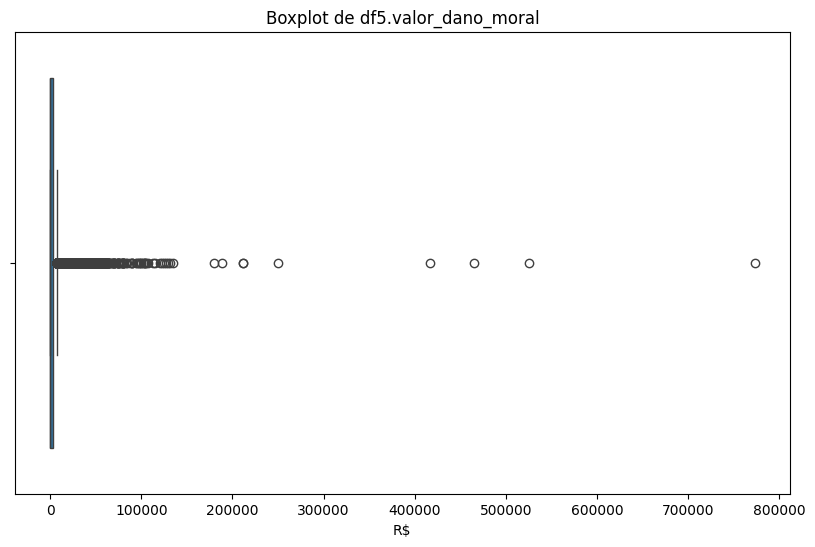

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x=df5.valor_dano_moral)
plt.title('Boxplot de df5.valor_dano_moral')
plt.xlabel('R$')
plt.show()


In [ ]:
# Criação da tabela para gráfico do artigo
df5.groupby(['operacao','num_proc_ano'])['obj_problemas_operacionais'].size().reset_index(name='count')

,operacao,num_proc_ano,count
0,Doméstico,2019,53104
1,Doméstico,2020,45188
2,Doméstico,2021,50920
3,Doméstico,2022,90228
4,Doméstico,2023,125888
5,Internacional,2019,27911
6,Internacional,2020,17521
7,Internacional,2021,8639
8,Internacional,2022,19548
9,Internacional,2023,27608


Calcular médias por classificação de objeto (problemas operacionais, contrato, bagagem, outros)

In [ ]:
print(df5.groupby('operacao').UF.value_counts(normalize=True))

operacao       UF
Doméstico      SP    0.157792
               RO    0.121967
               RJ    0.112006
               BA    0.109707
               MG    0.086829
               MT    0.073819
               PR    0.071544
               PE    0.049156
               AM    0.041686
               GO    0.035283
               SC    0.033953
               ES    0.026259
               CE    0.026174
               DF    0.025325
               MS    0.021687
               TO    0.006813
Internacional  SP    0.288105
               RJ    0.158446
               MG    0.121361
               BA    0.083910
               PR    0.072036
               PE    0.066464
               SC    0.046065
               DF    0.034684
               GO    0.028965
               ES    0.028807
               CE    0.018444
               MT    0.014868
               RO    0.013168
               AM    0.012931
               MS    0.009177
               TO    0.002568
Outros         MG    0

In [ ]:
df5.groupby('operacao').num_proc_ano.value_counts(normalize=True)

operacao       num_proc_ano
Doméstico      2023            0.344589
               2022            0.246978
               2019            0.145360
               2021            0.139382
               2020            0.123692
Internacional  2019            0.275727
               2023            0.272734
               2022            0.193111
               2020            0.173086
               2021            0.085343
Outros         2019            0.265444
               2021            0.222082
               2020            0.197293
               2022            0.191582
               2023            0.123599
Name: proportion, dtype: float64

In [ ]:
df5.groupby('operacao').jurisdicao.value_counts(normalize=True)

operacao       jurisdicao            
Doméstico      Juizado Especial Cível    0.730727
               Vara Cível                0.264494
               Outros                    0.004779
Internacional  Juizado Especial Cível    0.751302
               Vara Cível                0.218301
               Outros                    0.030397
Outros         Juizado Especial Cível    0.776164
               Vara Cível                0.195888
               Outros                    0.027949
Name: proportion, dtype: float64

In [ ]:
df5[['valor_pedido_inicial','valor_dano_moral','valor_dano_material',
     'valor_total_condenacao','valor_pago']]

,valor_pedido_inicial,valor_dano_moral,valor_dano_material,valor_total_condenacao,valor_pago
0,11422.94,0.0,0.0,0.0,0.00
1,20000.00,0.0,0.0,0.0,0.00
2,20000.00,0.0,0.0,0.0,0.00
3,15090.00,0.0,0.0,0.0,3675.79
4,10000.00,0.0,0.0,0.0,0.00
...,...,...,...,...,...
555541,20524.23,0.0,0.0,0.0,0.00
555542,20004.40,0.0,0.0,0.0,6000.00
555543,19960.00,5000.0,0.0,5000.0,5000.00
555544,20961.63,0.0,0.0,0.0,6000.00


In [ ]:
df5.groupby('num_proc_ano').valor_dano_moral.mean()

,valor_dano_moral
num_proc_ano,
2019,2332.889735
2020,1975.807004
2021,1811.362311
2022,1882.006499
2023,1498.219489


In [ ]:
df5.instancia.value_counts(normalize=True)

,proportion
instancia,
1ª Instância,0.581121
Não informado,0.358039
2ª Instância,0.060801
3ª Instância,0.000040


In [ ]:
df5.obj_problemas_operacionais.value_counts(normalize=True)

,proportion
obj_problemas_operacionais,
True,0.667261
False,0.332739


In [ ]:
df5.causa_nao_informado.value_counts(normalize=True)

,proportion
causa_nao_informado,
False,0.740546
True,0.259454


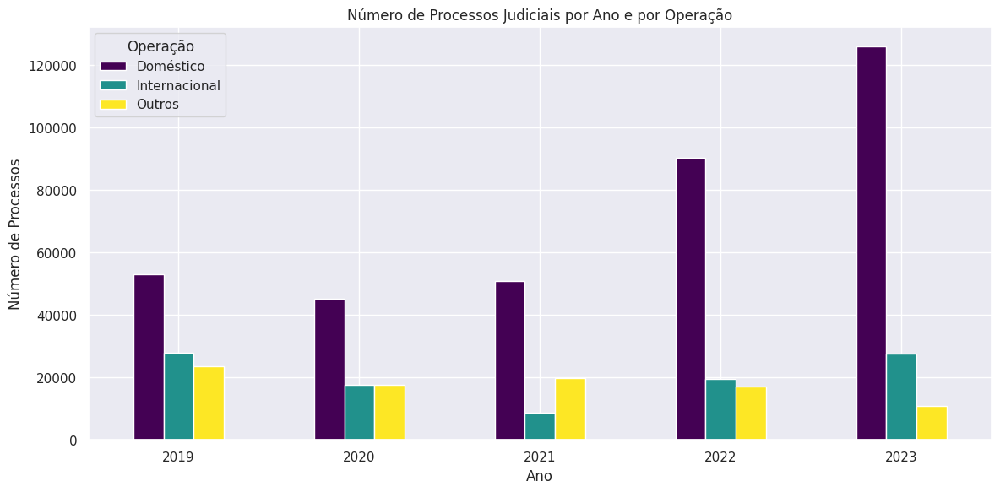

In [ ]:
# prompt: Please make a bar chart of sum of processes by year (num_proc_ano), showing in the same figure with different colours the total number groupedby 'operacao'. The title is "Número de Processos Judiciais por Ano e por Operação". xlabel = 'Ano' e ylabel = 'Número de Processos'

import matplotlib.pyplot as plt

# Assuming 'dados_aereas_AED' DataFrame is already loaded as in your provided code

# Group data by year and operation, then sum the number of processes
process_counts = dados_aereas_AED.groupby(['num_proc_ano', 'operacao'])['num_proc_ano'].count().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Número de Processos Judiciais por Ano e por Operação')
plt.xlabel('Ano')
plt.ylabel('Número de Processos')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

## Análise Exploratória de Dados (AED3 - @allan)

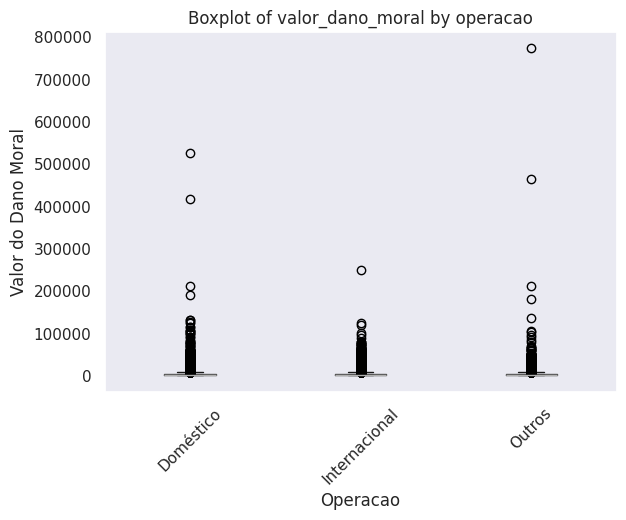

In [ ]:
data = df5.copy()

data.boxplot(column='valor_dano_moral', by='operacao', grid=False)

# Label the plot
plt.title('Boxplot of valor_dano_moral by operacao')
plt.suptitle('')  # Suppress the automatic title generated by pandas
plt.xlabel('Operacao')
plt.ylabel('Valor do Dano Moral')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

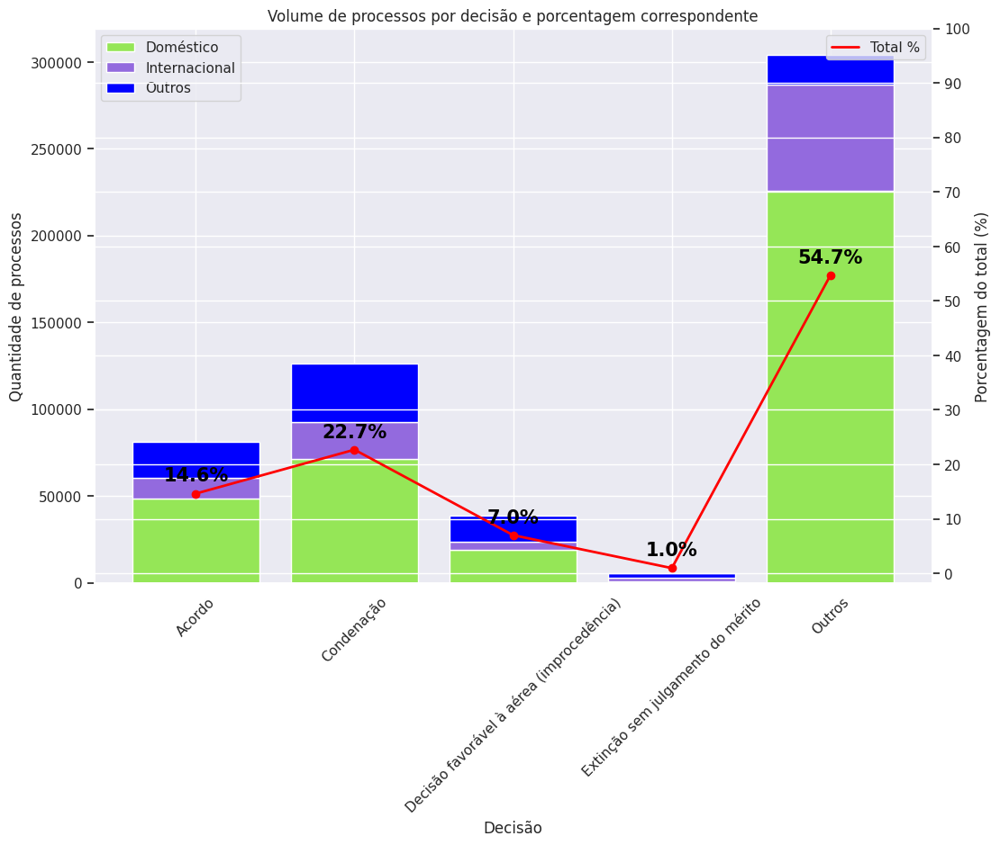

In [ ]:
data_all = df5.copy()

sub_bancos = {operacao: sub_df for operacao, sub_df in data_all.groupby('operacao')}

# Definindo cores para cada categoria
colors = {'Doméstico': '#95e657', 'Internacional': '#936ade', 'Não informado': '#FFA500', 'Outros': 'blue', 'data_all': 'red'}

# Organizar as situações processuais de forma consistente e calcular contagens
all_situations = data_all['situacao_processual_sentenca'].unique()
all_situations.sort()  # Ordena alfabeticamente

# Calcular contagem de processos por situação processual em data_all
total_counts = data_all['situacao_processual_sentenca'].value_counts().reindex(all_situations).fillna(0)

# Criar o gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Plotar os gráficos de barras para cada categoria em 'sub_bancos'
bottoms = [0] * len(all_situations)  # Inicia o 'bottom' para a primeira barra

for name, df in sub_bancos.items():
    # Calcula a contagem de processos por situação processual para cada sub-banco
    case_counts = df['situacao_processual_sentenca'].value_counts().reindex(all_situations).fillna(0)
    # Adiciona o gráfico de barras para a categoria
    ax.bar(all_situations, case_counts, bottom=bottoms, color=colors[name], label=name)
    # Atualiza 'bottoms' para empilhar as barras
    bottoms = [sum(x) for x in zip(bottoms, case_counts.values)]

# Criar um segundo eixo y para a linha de porcentagem total
ax2 = ax.twinx()

# Calcular e plotar a linha de porcentagem baseada em data_all
percentage = (total_counts / total_counts.sum()) * 100  # Calcula a porcentagem do total
ax2.plot(all_situations, percentage, label='Total %', color=colors['data_all'], linewidth=2)
ax2.scatter(all_situations, percentage, color=colors['data_all'])  # Adiciona pontos à linha de porcentagem

# Anota cada ponto na linha de porcentagem com rótulos em negrito
for i, (state, perc) in enumerate(zip(all_situations, percentage)):
    ax2.annotate(f"{perc:.1f}%", (state, perc), textcoords="offset points", xytext=(0,10), ha='center', fontsize=15, fontweight='bold', color='black')

# Personalização do gráfico
ax.set_xlabel('Decisão', fontsize=12)
ax.set_ylabel('Quantidade de processos', fontsize=12)
ax2.set_ylabel('Porcentagem do total (%)', fontsize=12)
ax.set_title('Volume de processos por decisão e porcentagem correspondente')
ax.tick_params(axis='x', rotation=45)
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Formatação de grid e ticks do eixo y
ax.grid(True)
ax2.set_yticks(range(0, 101, 10))  # Ticks de porcentagem no eixo y secundário

plt.show()


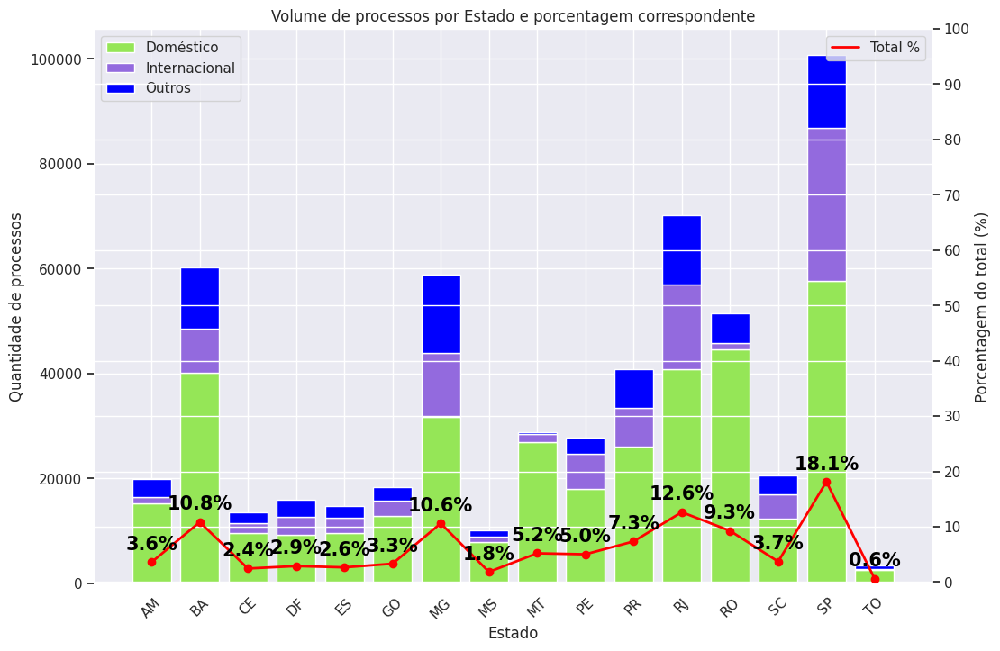

In [ ]:
data_all = df5.copy()

sub_bancos = {operacao: sub_df for operacao, sub_df in data_all.groupby('operacao')}

# Organizar os estados (UF) de forma consistente
all_states = data_all['UF'].unique()
all_states.sort()  # Ordena alfabeticamente

# Calcular contagem de processos por estado em data_all
total_counts = data_all['UF'].value_counts().reindex(all_states).fillna(0)

# Criar o gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Plotar os gráficos de barras para cada categoria em 'sub_bancos'
bottoms = [0] * len(all_states)  # Inicia o 'bottom' para a primeira barra

for name, df in sub_bancos.items():
    # Calcula a contagem de processos por estado para cada sub-banco
    case_counts = df['UF'].value_counts().reindex(all_states).fillna(0)
    # Adiciona o gráfico de barras para a categoria
    ax.bar(all_states, case_counts, bottom=bottoms, color=colors[name], label=name)
    # Atualiza 'bottoms' para empilhar as barras
    bottoms = [sum(x) for x in zip(bottoms, case_counts.values)]

# Criar um segundo eixo y para a linha de porcentagem total
ax2 = ax.twinx()

# Calcular e plotar a linha de porcentagem baseada em data_all
percentage = (total_counts / total_counts.sum()) * 100  # Calcula a porcentagem do total
ax2.plot(all_states, percentage, label='Total %', color=colors['data_all'], linewidth=2)
ax2.scatter(all_states, percentage, color=colors['data_all'])  # Adiciona pontos à linha de porcentagem

# Anota cada ponto na linha de porcentagem com rótulos em negrito
for i, (state, perc) in enumerate(zip(all_states, percentage)):
    ax2.annotate(f"{perc:.1f}%", (state, perc), textcoords="offset points", xytext=(0,10), ha='center', fontsize=15, fontweight='bold', color='black')

# Personalização do gráfico
ax.set_xlabel('Estado', fontsize=12)
ax.set_ylabel('Quantidade de processos', fontsize=12)
ax2.set_ylabel('Porcentagem do total (%)', fontsize=12)
ax.set_title('Volume de processos por Estado e porcentagem correspondente')
ax.tick_params(axis='x', rotation=45)
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Formatação de grid e ticks do eixo y
ax.grid(True)
ax2.set_yticks(range(0, 101, 10))  # Ticks de porcentagem no eixo y secundário

plt.show()


In [ ]:
# Função para formatar números com ponto como separador de milhar e vírgula como separador decimal
def format_number(num, zeros=True):
    if zeros:
        return f"{num:,.2f}".replace(",", "X").replace(".", ",").replace("X", ".")
    else:
        return f"{num:,.0f}".replace(",", "X").replace(".", ",").replace("X", ".")

# Função para quebrar linhas de texto com mais de 2 espaços
def break_line_if_needed(text):
    if text.count(' ') > 2:
        return text.replace(' ', '\n', 2)
    return text

# Função para plotar o heatmap, considerando o dano moral da condenação
def plot_heatmap(data, col_jurisdiction, col_situation,
                 annot_kws={"size": 14},
                 cbar_kws={'label': 'Percentage of Total Processes by Jurisdiction'},
                 xlabel=None, ylabel=None, title=None, sort_x=True, sort_y=True,
                 xticks={"rotation":45, "fontsize":12},
                 yticks={"rotation":0, "fontsize":12}, save_name = "",
                 title_pos=None):

    # Extrair categorias únicas para indexação consistente
    all_jurisdicao = data[col_jurisdiction].dropna().unique()
    all_situacoes = data[col_situation].dropna().unique()

    if sort_x:
        all_jurisdicao = np.sort(all_jurisdicao)
    if sort_y:
        all_situacoes = np.sort(all_situacoes)

    # Tabela pivot para contagem de casos por decisão e jurisdição
    pivot_jurisdiction = pd.crosstab(data[col_situation], data[col_jurisdiction]).reindex(columns=all_jurisdicao, index=all_situacoes, fill_value=0)

    # Calcular porcentagens
    pivot_percentage = pivot_jurisdiction.div(pivot_jurisdiction.sum(axis=1), axis=0) * 100

    # Valores máximos de pagamento por jurisdição e situação
    pivot_max_payment = data.pivot_table(index=col_situation, columns=col_jurisdiction,
                        values='valor_dano_moral', aggfunc='max').reindex(index=all_situacoes, columns=all_jurisdicao, fill_value=0)
    pivot_max_payment = pivot_max_payment.fillna(0)

    # Formatar colunas numéricas
    numeric_cols = pivot_max_payment.select_dtypes(include=[np.number]).columns
    pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)

    # Anotações
    # Anotações com quantidade, porcentagem e valor máximo pago
    annotations = ( pivot_percentage.round(1).astype(str)+
                   "% (" +
                    pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +
                   ")\n" +
                   "R$" + pivot_max_payment.astype(str))

    # Plotar o heatmap
    ax = sns.heatmap(pivot_percentage, annot=annotations, fmt='',
                     cmap='coolwarm', annot_kws=annot_kws, cbar_kws=cbar_kws,
                     linewidths=2, square=False)

    # Títulos e rótulos
    ax.set_title(**title)
    ax.set_ylabel(**ylabel)
    ax.set_xlabel(**xlabel)

    # Quebrar linha para rótulos do eixo x
    xtick_labels = [break_line_if_needed(label.get_text()) for label in ax.get_xticklabels()]
    ax.set_xticklabels(xtick_labels, **xticks)

    # Definir rótulos do eixo y
    ytick_labels = [break_line_if_needed(label.get_text()) for label in ax.get_yticklabels()]
    ax.set_yticklabels(ytick_labels, **yticks)

    # Definir a posição do título
    if title_pos is not None:
        ax = plt.gca()
        ax.title.set_position(title_pos)

    # Configurar a barra de cores
    cbar = ax.collections[0].colorbar
    cbar.set_label(cbar_kws.get('label'), size=16)
    cbar.ax.tick_params(labelsize=16)
    plt.savefig(save_name, format="png", dpi=300, bbox_inches="tight")

    plt.show()


In [ ]:
import os

def filename(name):
    return os.path.join(os.getcwd(), name)

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


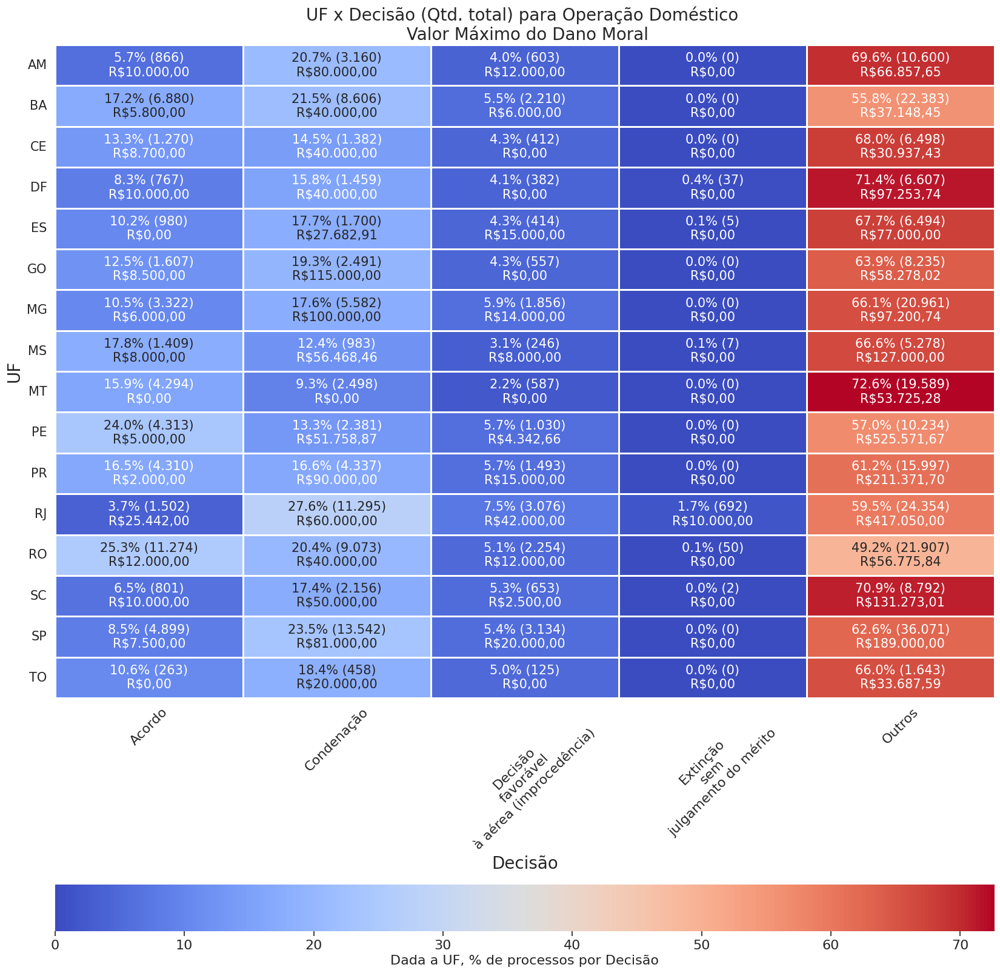

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


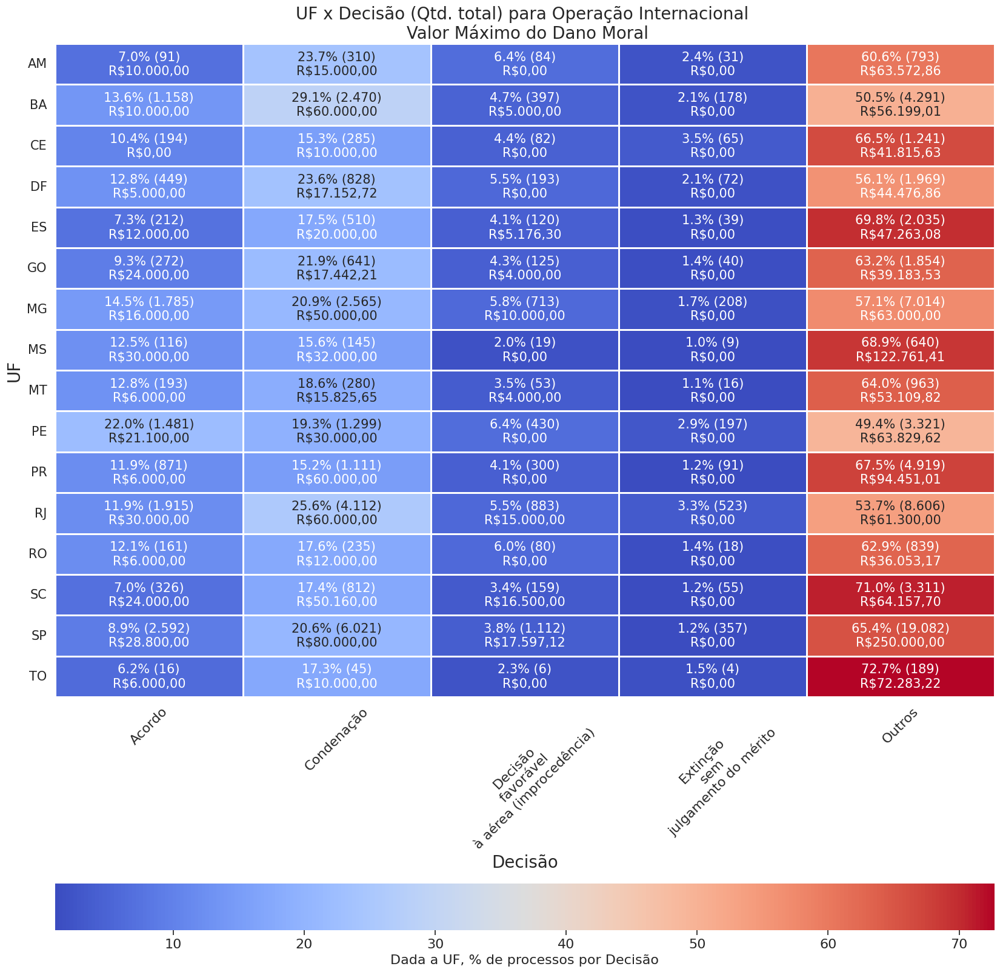

In [ ]:
# Decisão por UF

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  plt.figure(figsize=(20, 20))

  plot_heatmap(data, 'situacao_processual_sentenca', 'UF',
             xlabel={'xlabel': 'Decisão', 'fontsize': 20},
             ylabel={'ylabel': 'UF', 'fontsize': 20},
             title={'label': f'UF x Decisão (Qtd. total) para Operação {ops} \n Valor Máximo do Dano Moral', 'fontsize': 20}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a UF, % de processos por Decisão', 'orientation': 'horizontal', 'location': "bottom", 'anchor': (0, 0.5), "shrink": 1},
             annot_kws={"size": 15},
             xticks={"rotation": 45, "fontsize": 16},
             yticks={"rotation": 0, "fontsize": 15},
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p1_{ops}.png")
             )

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


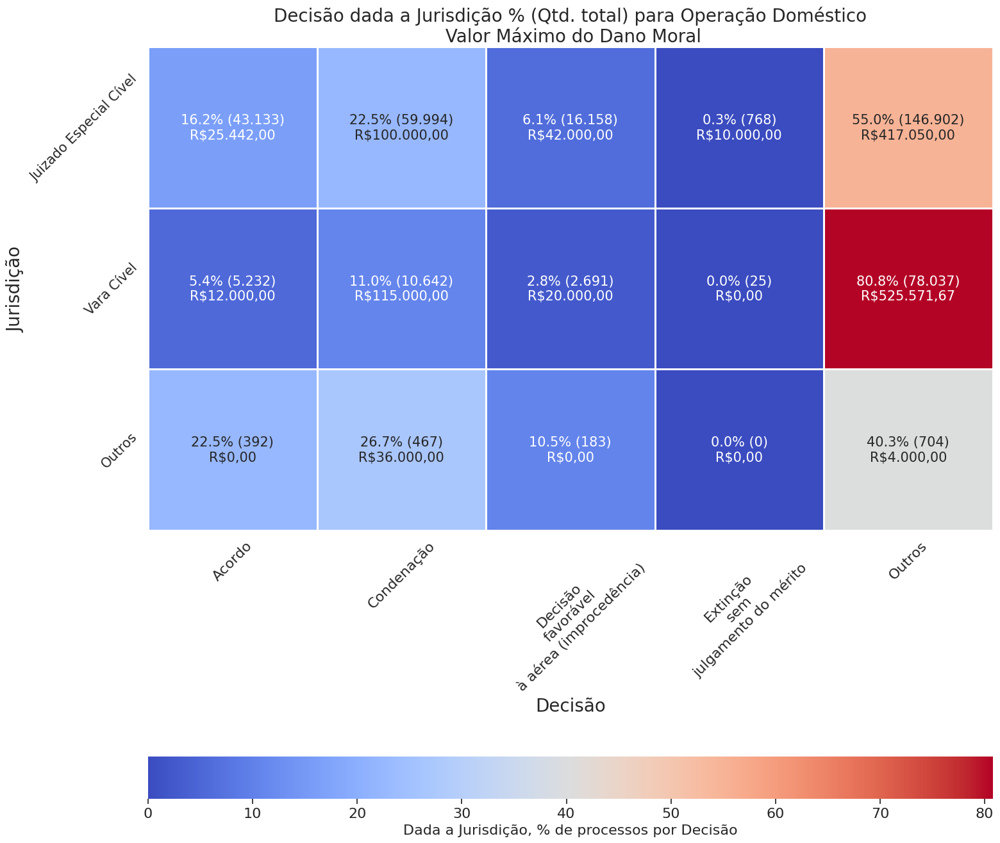

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


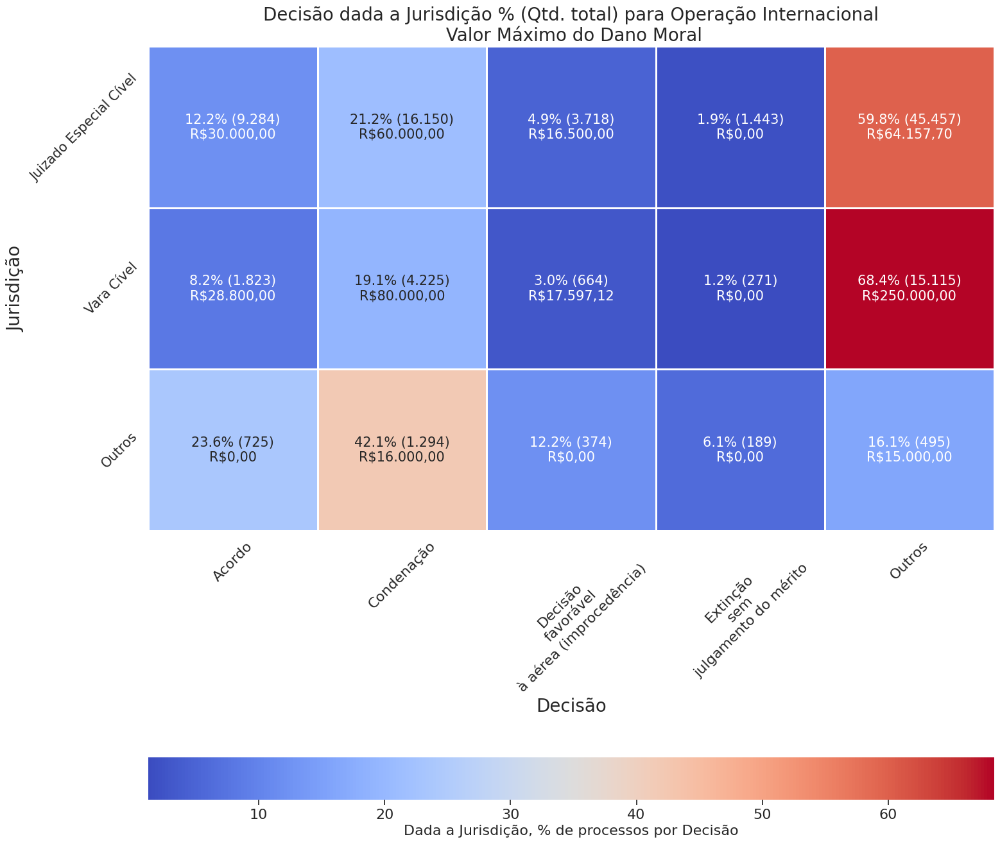

In [ ]:
# Decisão por Jurisdição

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  plt.figure(figsize=(17, 14))
  plot_heatmap(data,
             'situacao_processual_sentenca', 'jurisdicao',
             xlabel={'xlabel':'Decisão', 'fontsize':20},
             ylabel={'ylabel':'Jurisdição','fontsize':20},
             title={'label':f'Decisão dada a Jurisdição % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':20}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a Jurisdição, % de processos por Decisão',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  -1), "shrink":1
                       },
             annot_kws={"size": 15},
             xticks={"rotation":45, "fontsize":16},
             yticks={"rotation":45,"fontsize":15},
             sort_x=True,
             sort_y=False,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p2_{ops}.png")
             )

<ipython-input-125-6396a494f7e7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-125-6396a494f7e7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number

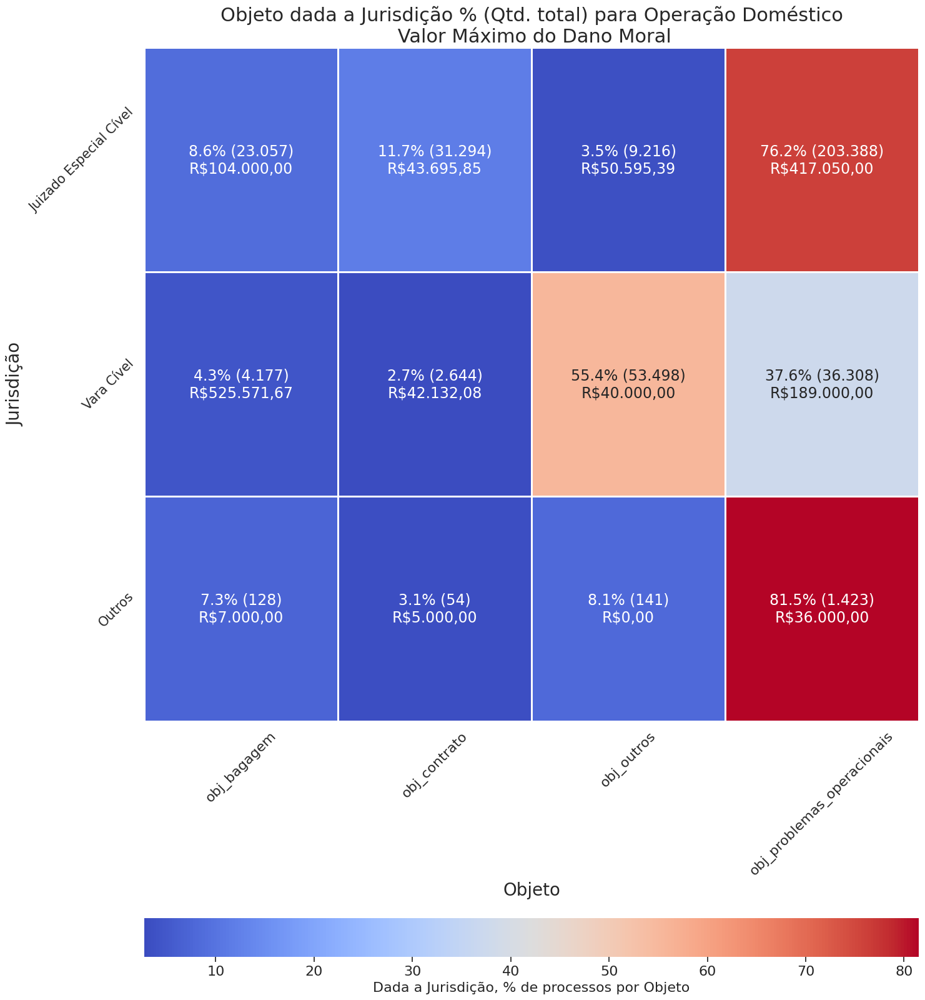

<ipython-input-125-6396a494f7e7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-125-6396a494f7e7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number

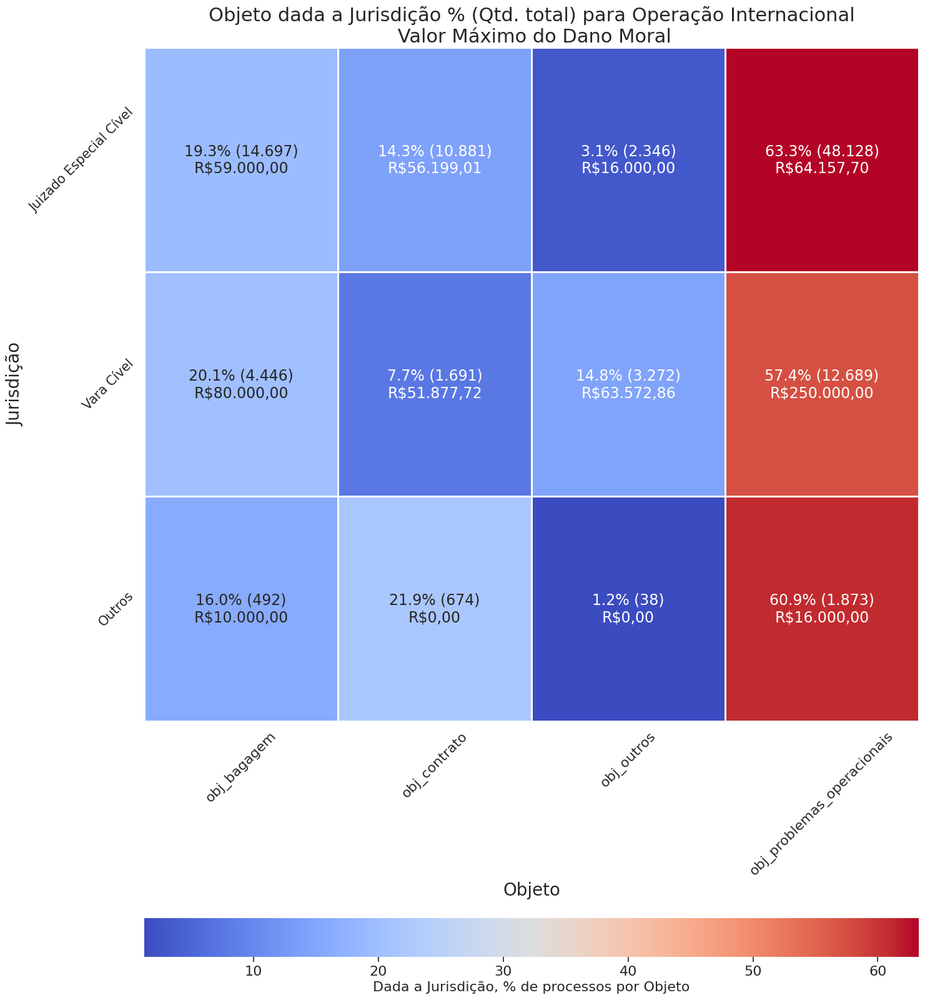

In [ ]:
# Objeto por Jurisdição
data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

problem_categories = ['obj_problemas_operacionais', 'obj_bagagem', 'obj_contrato', 'obj_outros']

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  data['total_problems'] = data[problem_categories].sum(axis=1)
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)

  plt.figure(figsize=(16, 20))
  plot_heatmap(data, 'dominant_problem', 'jurisdicao',
             xlabel={'xlabel':'Objeto', 'fontsize':20},
             ylabel={'ylabel':'Jurisdição','fontsize':20},
             title={'label':f'Objeto dada a Jurisdição % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a Jurisdição, % de processos por Objeto',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  0.5), "shrink":1
                       },
             annot_kws={"size": 17},
             xticks={"rotation":45, "fontsize":16},
             yticks={"rotation":45,"fontsize":15},
             sort_x=True,
             sort_y=False,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p3_{ops}.png")

             )


<ipython-input-126-6a5a8c6d783b>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-126-6a5a8c6d783b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number

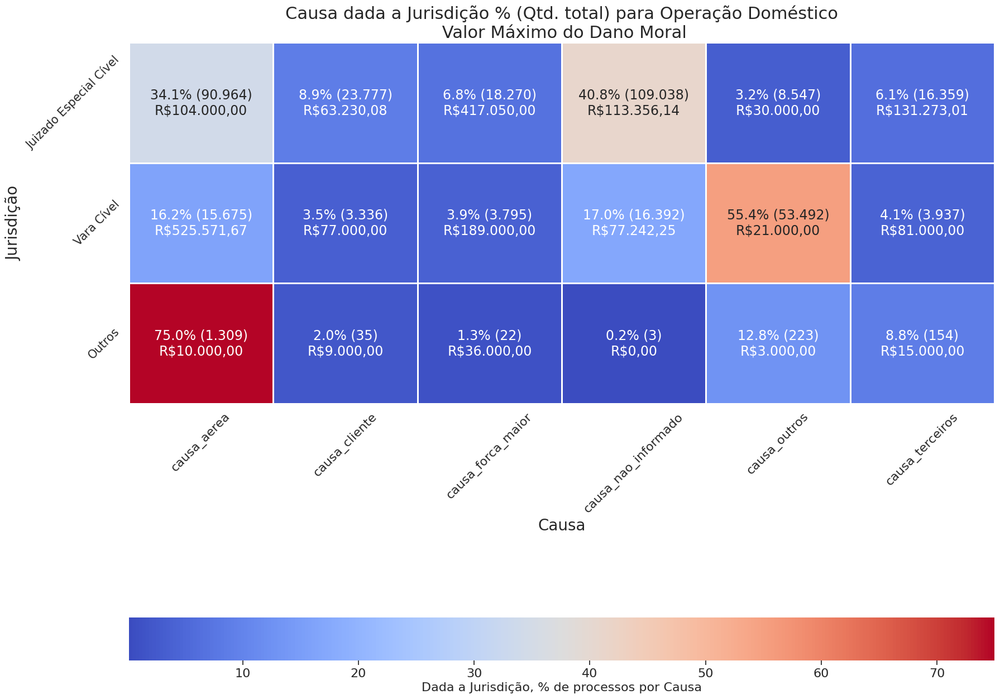

<ipython-input-126-6a5a8c6d783b>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-126-6a5a8c6d783b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number

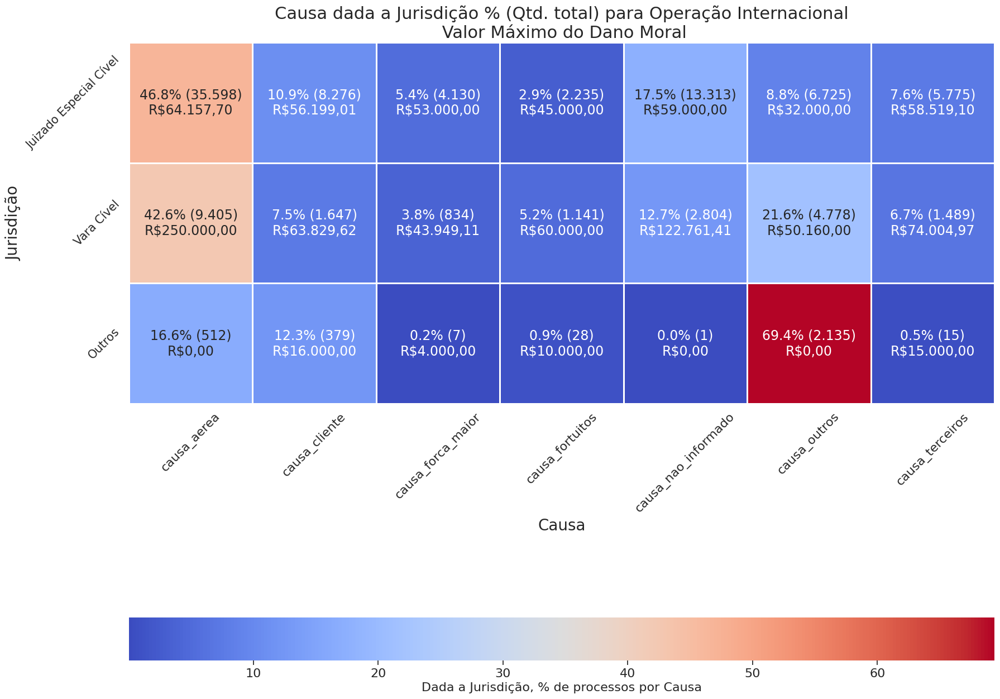

In [ ]:
# Causa por Jurisdição
data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

problem_categories= ['causa_aerea','causa_cliente','causa_terceiros','causa_fortuitos','causa_forca_maior','causa_nao_informado','causa_outros']

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  data['total_problems'] = data[problem_categories].sum(axis=1)
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)

  plt.figure(figsize=(20, 12))
  plot_heatmap(data, 'dominant_problem', 'jurisdicao',
             xlabel={'xlabel':'Causa', 'fontsize':20},
             ylabel={'ylabel':'Jurisdição','fontsize':20},
             title={'label':f'Causa dada a Jurisdição % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a Jurisdição, % de processos por Causa',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  -3), "shrink":1
                       },
             annot_kws={"size": 17},
             xticks={"rotation":45, "fontsize":16},
             yticks={"rotation":45,"fontsize":15},
             sort_x=True,
             sort_y=False,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p4_{ops}.png")

             )


<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


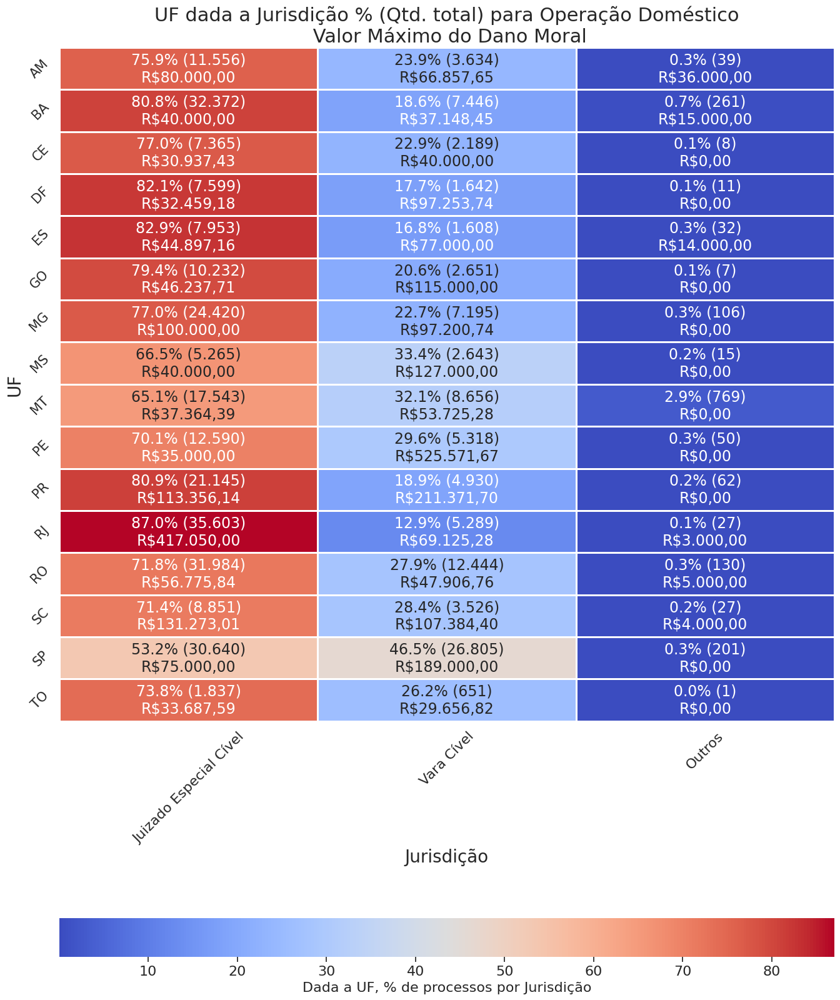

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


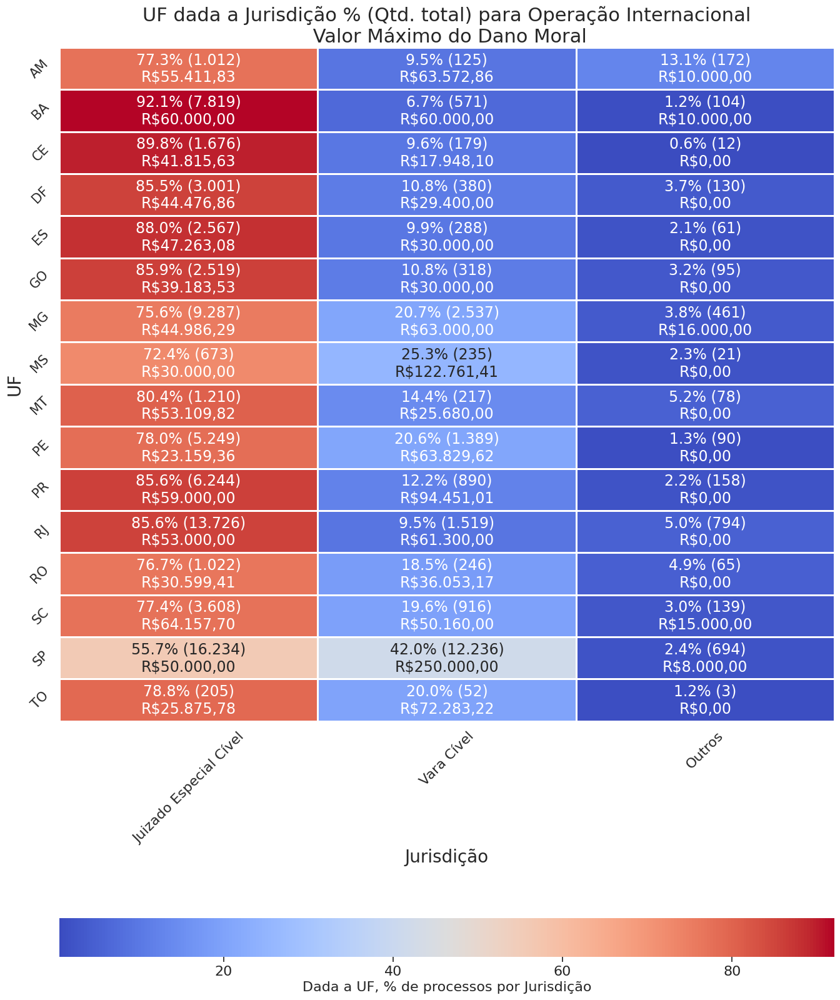

In [ ]:
# Jurisdição por UF

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  plt.figure(figsize=(16, 20))
  plot_heatmap(data, 'jurisdicao', 'UF',
             ylabel={'ylabel':'UF', 'fontsize':20},
             xlabel={'xlabel':'Jurisdição','fontsize':20},
             title={'label':f'UF dada a Jurisdição % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a UF, % de processos por Jurisdição',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  0.5), "shrink":1
                       },
             annot_kws={"size": 17},
             xticks={"rotation":45, "fontsize":16},
             yticks={"rotation":45,"fontsize":15},
             sort_x=False,
             sort_y=True,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p5_{ops}.png")
             )


<ipython-input-12-a73c1973aa65>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-12-a73c1973aa65>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


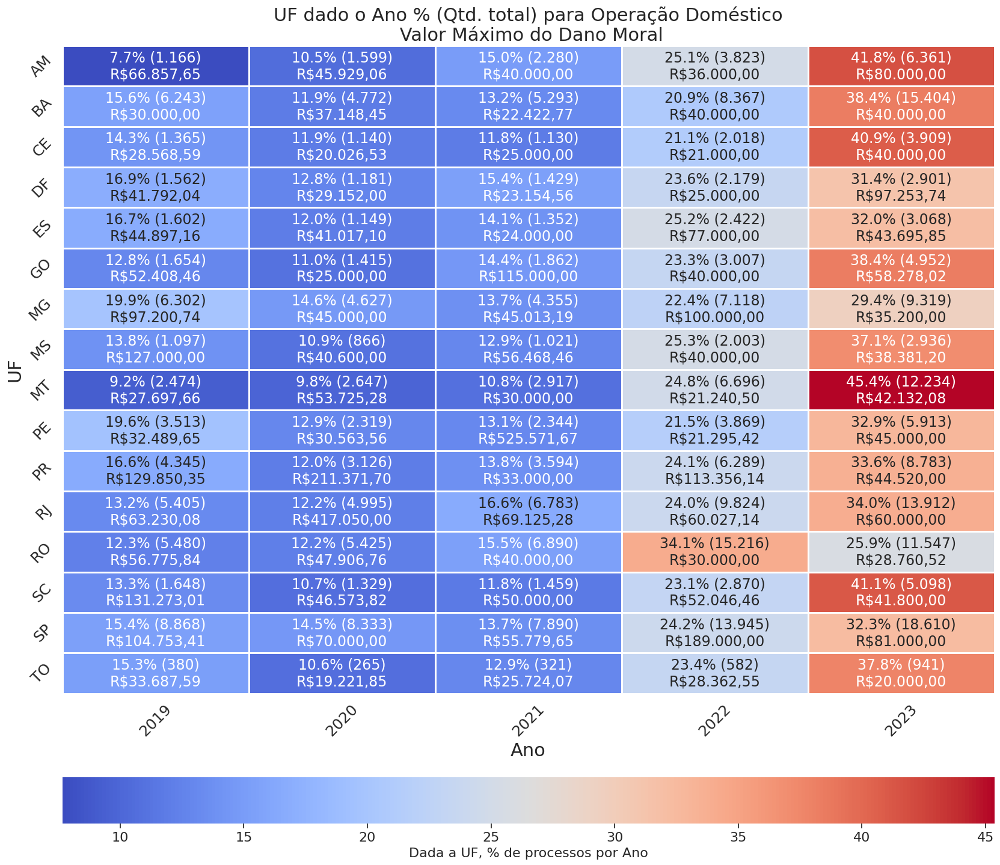

<ipython-input-12-a73c1973aa65>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-12-a73c1973aa65>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


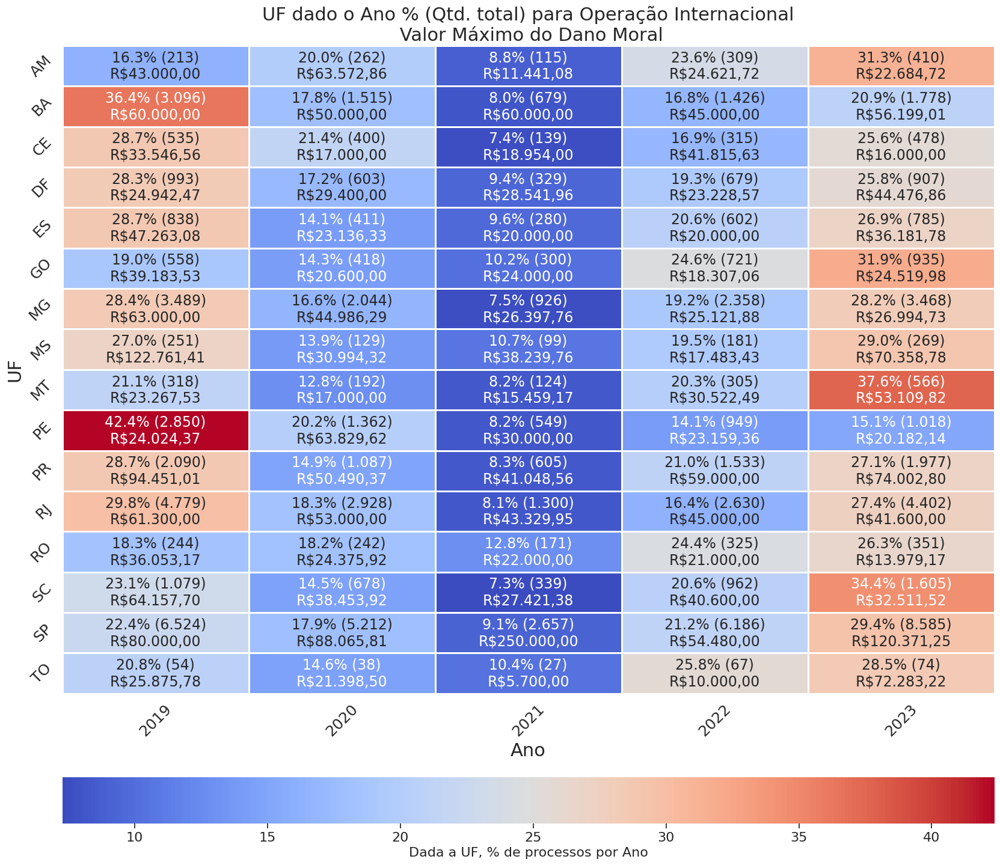

In [ ]:
# Ano por UF

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  plt.figure(figsize=(20, 20))
  plot_heatmap(data, 'num_proc_ano', 'UF',
             xlabel={'xlabel':'Ano', 'fontsize':22},
             ylabel={'ylabel':'UF','fontsize':22},
             title={'label':f'UF dado o Ano % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a UF, % de processos por Ano',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  1.6), "shrink":1
                       },
             annot_kws={"size": 17},
             xticks={"rotation":45, "fontsize":18},
             yticks={"rotation":45,"fontsize":18},
             sort_x=True,
             sort_y=True,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p6_{ops}.png")
             )


<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


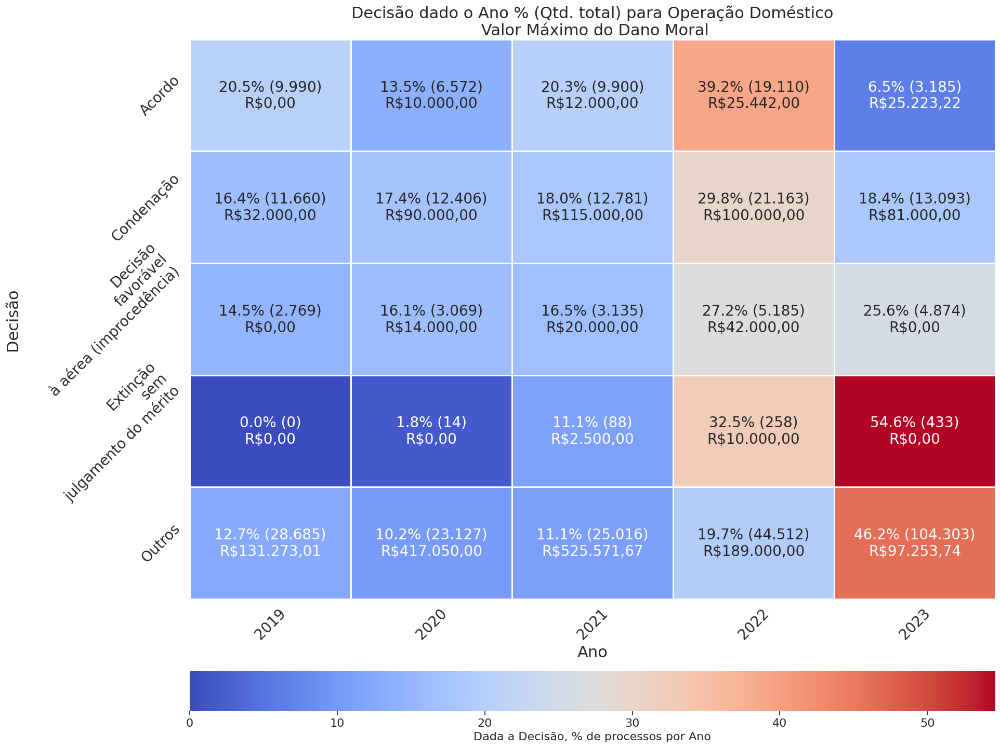

<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_number)
<ipython-input-121-b6f92e87e6c0>:51: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_jurisdiction.astype(int).applymap(lambda x: format_number(x, False)).astype(str) +


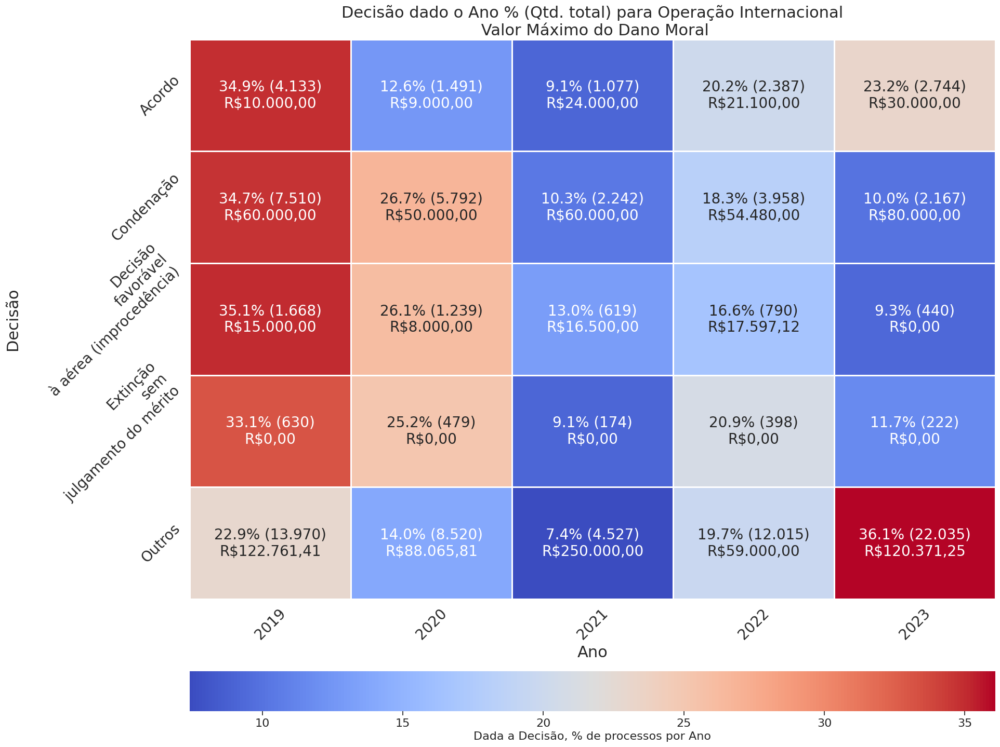

In [ ]:
# Ano por Decisão

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  plt.figure(figsize=(20, 20))
  plot_heatmap(data, 'num_proc_ano', 'situacao_processual_sentenca',
             ylabel={'ylabel':'Decisão', 'fontsize':22},
             xlabel={'xlabel':'Ano','fontsize':22},
             title={'label':f'Decisão dado o Ano % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a Decisão, % de processos por Ano',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  1.6), "shrink":1
                       },
             annot_kws={"size": 20},
             xticks={"rotation":45, "fontsize":20},
             yticks={"rotation":45,"fontsize":20},
             sort_x=True,
             sort_y=True,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p7_{ops}.png")
             )


<ipython-input-131-154907a0f648>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-131-154907a0f648>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_numbe

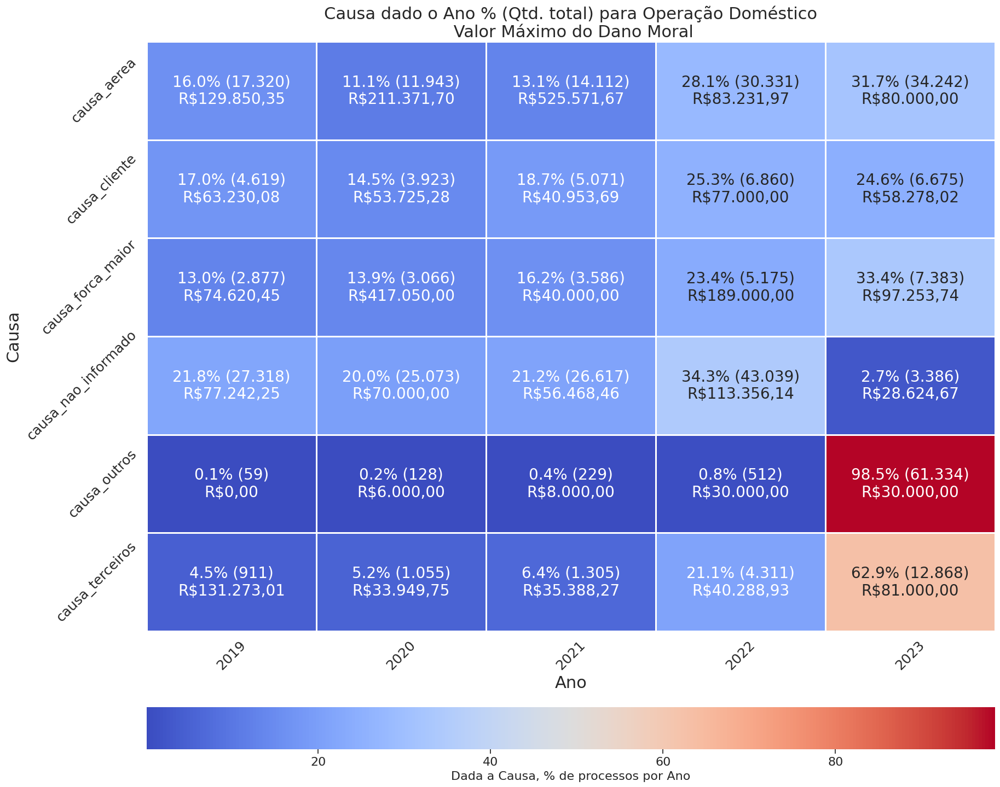

<ipython-input-131-154907a0f648>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-131-154907a0f648>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_numbe

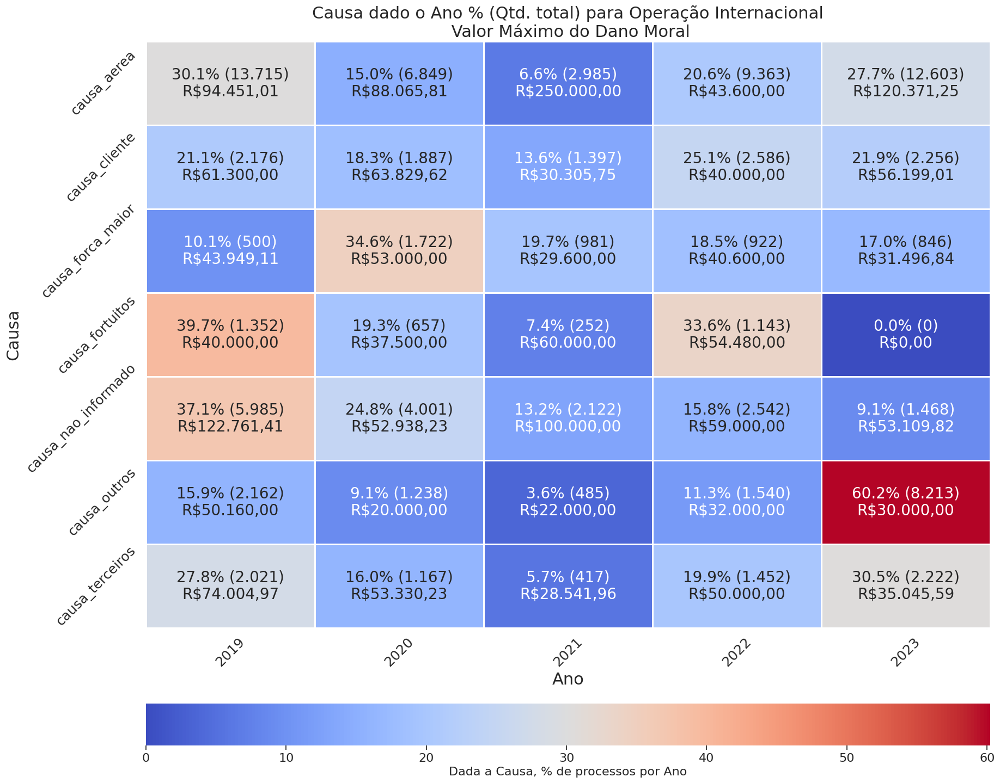

In [ ]:
# Ano por Causa

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

problem_categories= ['causa_aerea','causa_cliente','causa_terceiros','causa_fortuitos','causa_forca_maior','causa_nao_informado','causa_outros']

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  data['total_problems'] = data[problem_categories].sum(axis=1)
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)

  plt.figure(figsize=(20, 20))
  plot_heatmap(data, 'num_proc_ano', 'dominant_problem',
             ylabel={'ylabel':'Causa', 'fontsize':22},
             xlabel={'xlabel':'Ano','fontsize':22},
             title={'label':f'Causa dado o Ano % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada a Causa, % de processos por Ano',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  1.6), "shrink":1
                       },
             annot_kws={"size": 20},
             xticks={"rotation":45, "fontsize":18},
             yticks={"rotation":45,"fontsize":18},
             sort_x=True,
             sort_y=True,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p8_{ops}.png")
             )


<ipython-input-133-e1aa1ebbbfef>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-133-e1aa1ebbbfef>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_numbe

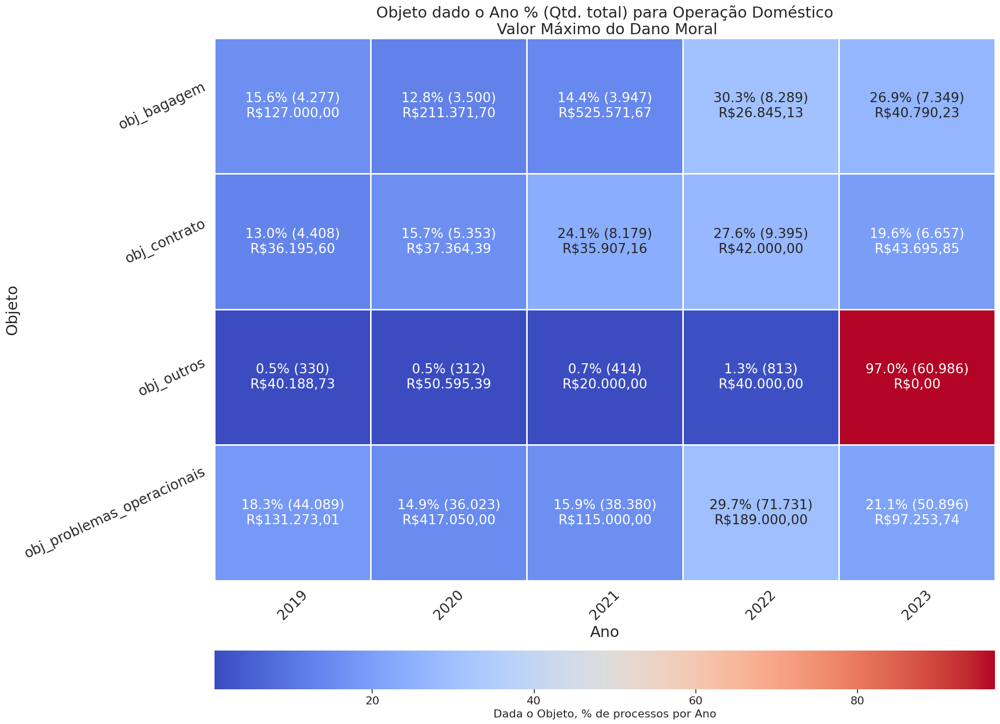

<ipython-input-133-e1aa1ebbbfef>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['total_problems'] = data[problem_categories].sum(axis=1)
<ipython-input-133-e1aa1ebbbfef>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)
<ipython-input-121-b6f92e87e6c0>:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pivot_max_payment[numeric_cols] = pivot_max_payment[numeric_cols].round(2).applymap(format_numbe

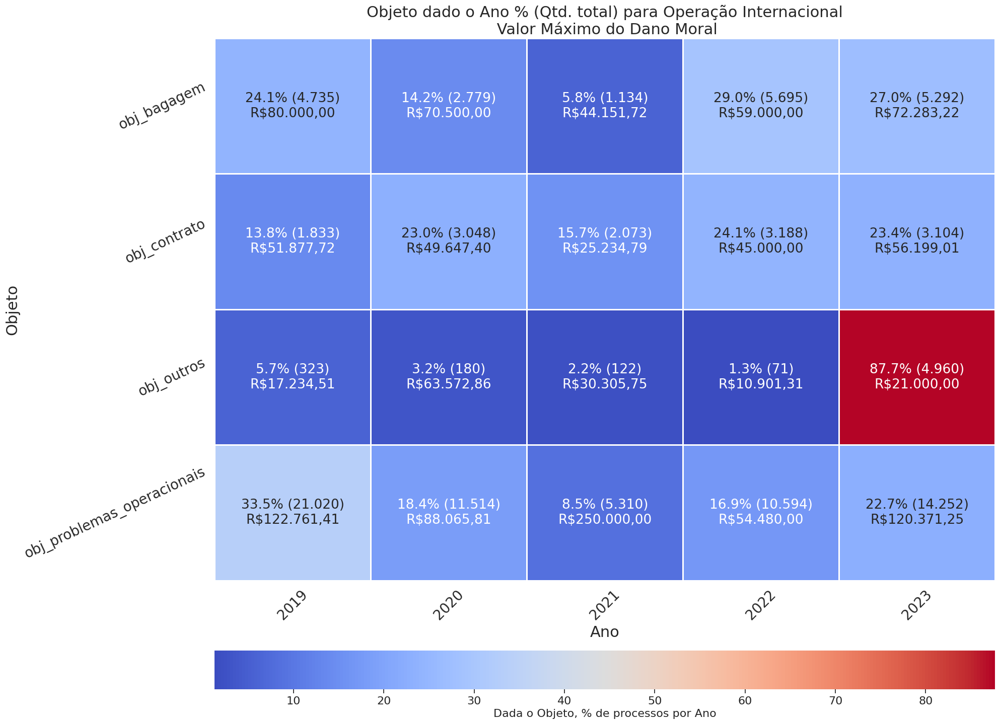

In [ ]:
# Ano por Objeto

data = df5[df5.operacao.isin(['Doméstico','Internacional'])]

problem_categories = ['obj_problemas_operacionais', 'obj_bagagem', 'obj_contrato', 'obj_outros']

for ops in data.operacao.unique():
  data = df5[df5.operacao == ops]

  data['total_problems'] = data[problem_categories].sum(axis=1)
  data['dominant_problem'] = data[problem_categories].idxmax(axis=1)

  plt.figure(figsize=(20, 20))
  plot_heatmap(data, 'num_proc_ano', 'dominant_problem',
             ylabel={'ylabel':'Objeto', 'fontsize':22},
             xlabel={'xlabel':'Ano','fontsize':22},
             title={'label':f'Objeto dado o Ano % (Qtd. total) para Operação {ops}\n Valor Máximo do Dano Moral',
                    'fontsize':22}, #'verticalalignment': 'top'},
             cbar_kws={'label': 'Dada o Objeto, % de processos por Ano',
                       'orientation': 'horizontal','location':"bottom", 'anchor':(0,  1.6), "shrink":1
                       },
             annot_kws={"size": 19},
             xticks={"rotation":45, "fontsize":20},
             yticks={"rotation":25,"fontsize":20},
             sort_x=True,
             sort_y=True,
             title_pos=[0.5, 1.5],
             save_name=filename(f"./Images/p9_{ops}.png")
             )


## Análise Exploratória do Dano Moral - Somente Condenações

In [ ]:
dados_aereas_DM = pd.read_csv('dados_aereas_ML.csv',low_memory=False)

In [ ]:
dados_aereas_DM.shape

(126041, 25)

In [ ]:
dados_aereas_DM.columns

Index(['empresa_re', 'num_proc_ano', 'data_distribuicao', 'UF', 'operacao',
       'jurisdicao', 'instancia', 'situacao_processual_sentenca', 'n_autores',
       'valor_pedido_inicial', 'valor_dano_moral', 'valor_dano_material',
       'valor_total_condenacao', 'valor_pago', 'obj_problemas_operacionais',
       'obj_bagagem', 'obj_contrato', 'obj_outros', 'causa_nao_informado',
       'causa_forca_maior', 'causa_fortuitos', 'causa_terceiros',
       'causa_cliente', 'causa_aerea', 'causa_outros'],
      dtype='object')

In [ ]:
df6 = dados_aereas_DM.copy()

In [ ]:
df6['dano_moral_por_autor'] = np.where(df6['n_autores'] != 0,
                                        df6['valor_dano_moral'] / df6['n_autores'],
                                        df6['valor_dano_moral'])

In [ ]:
df6 = df6.drop(columns=['data_distribuicao','n_autores', 'valor_pedido_inicial',
                        'valor_dano_material','valor_total_condenacao', 'valor_pago'])

In [ ]:
df6.shape

(126041, 20)

In [ ]:
df6[df6.dano_moral_por_autor == 0].shape

(65599, 20)

In [ ]:
df6.describe()

,num_proc_ano,valor_dano_moral,dano_moral_por_autor
count,126041.000000,126041.000000,126041.000000
mean,2020.874890,2453.694935,2100.483598
std,1.376234,4100.932184,3133.246740
min,2019.000000,0.000000,0.000000
25%,2020.000000,0.000000,0.000000
50%,2021.000000,0.000000,0.000000
75%,2022.000000,4000.000000,3500.000000
max,2023.000000,465000.000000,115000.000000


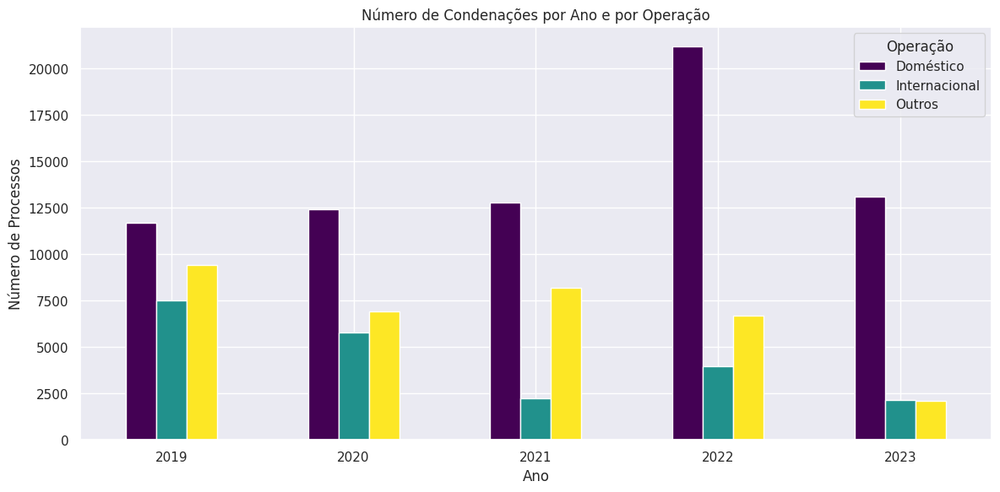

In [ ]:
# Group data by year and operation, then sum the number of processes
process_counts = df6.groupby(['num_proc_ano', 'operacao'])['num_proc_ano'].count().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Número de Condenações por Ano e por Operação')
plt.xlabel('Ano')
plt.ylabel('Número de Processos')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

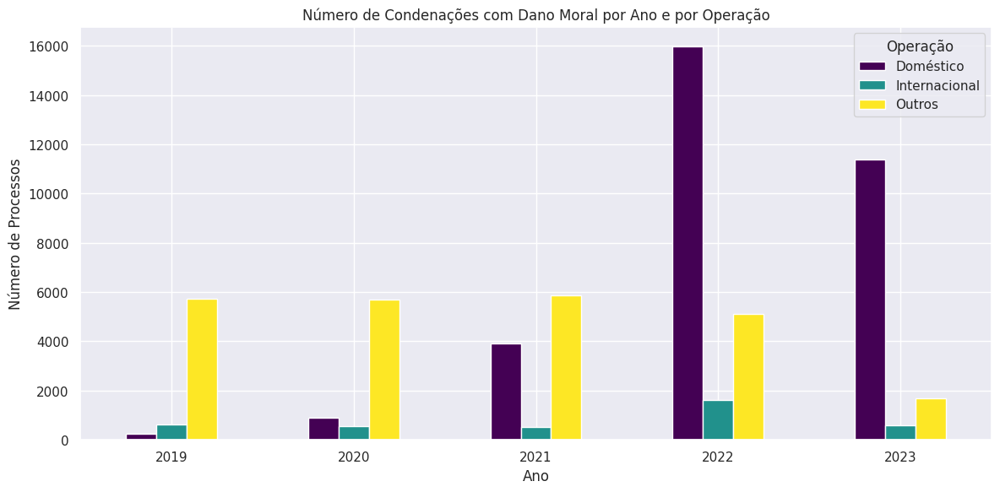

In [ ]:
# Group data by year and operation, then sum the number of processes
process_counts = df6[df6.dano_moral_por_autor > 0].groupby(['num_proc_ano', 'operacao'])['num_proc_ano'].count().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Número de Condenações com Dano Moral por Ano e por Operação')
plt.xlabel('Ano')
plt.ylabel('Número de Processos')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

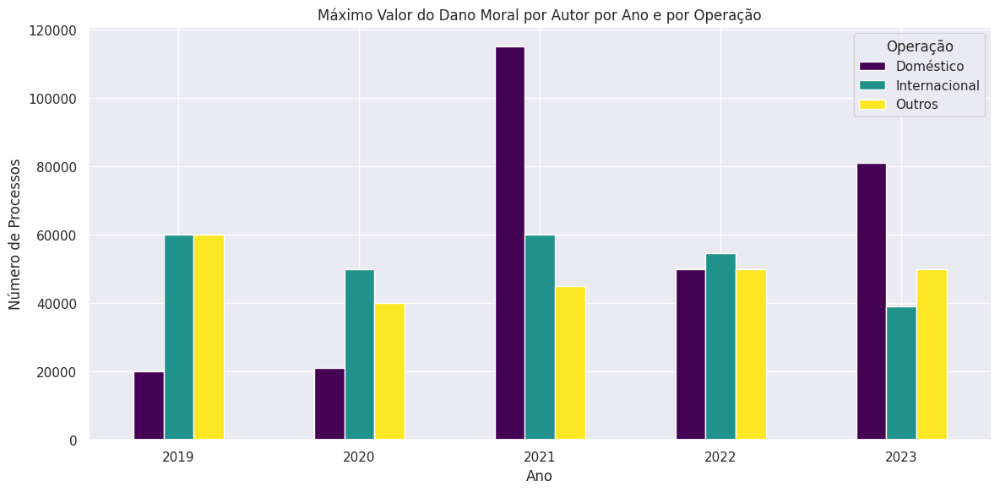

In [ ]:
# Group data by year and operation, then sum the number of processes
process_counts = df6.groupby(['num_proc_ano', 'operacao'])['dano_moral_por_autor'].max().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Máximo Valor do Dano Moral por Autor por Ano e por Operação')
plt.xlabel('Ano')
plt.ylabel('Número de Processos')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

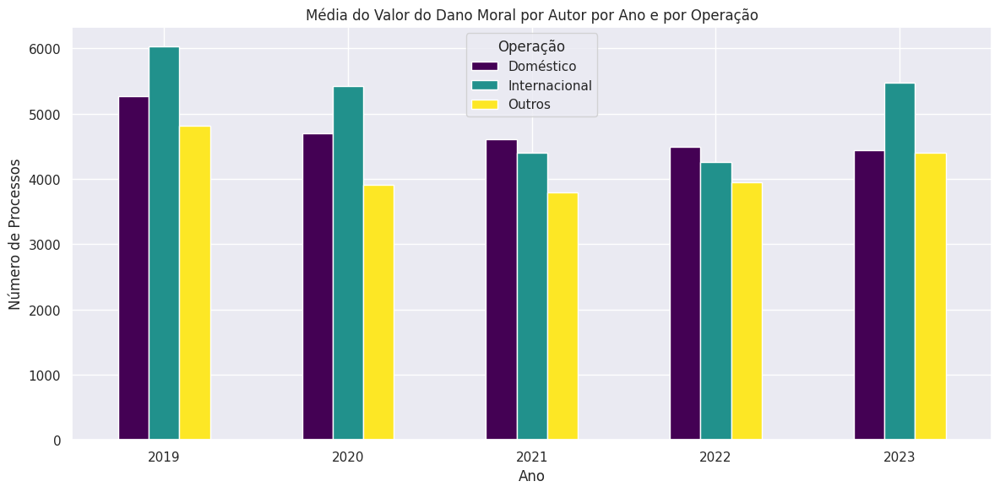

In [ ]:
# Group data by year and operation, then sum the number of processes
process_counts = df6[df6.dano_moral_por_autor > 0].groupby(['num_proc_ano', 'operacao'])['dano_moral_por_autor'].mean().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Média do Valor do Dano Moral por Autor por Ano e por Operação')
plt.xlabel('Ano')
plt.ylabel('Número de Processos')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

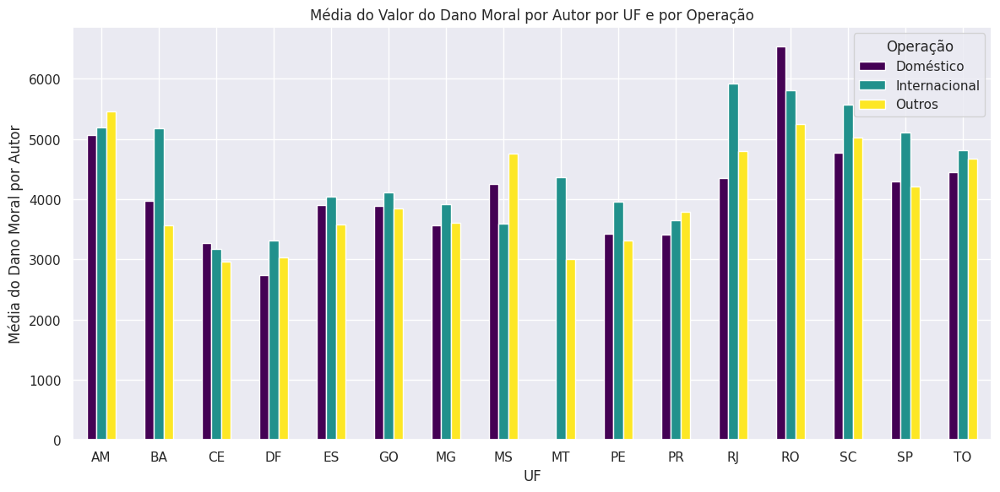

In [ ]:
# Group data by year and operation, then sum the number of processes
process_counts = df6[df6.dano_moral_por_autor > 0].groupby(['UF', 'operacao'])['dano_moral_por_autor'].mean().unstack()

# Create the bar chart
ax = process_counts.plot(kind='bar', figsize=(12, 6), colormap='viridis') # Using a colormap for better visualization

# Customize the chart
plt.title('Média do Valor do Dano Moral por Autor por UF e por Operação')
plt.xlabel('UF')
plt.ylabel('Média do Dano Moral por Autor')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend(title='Operação')
plt.tight_layout() # Adjust layout to prevent labels from overlapping

plt.show()

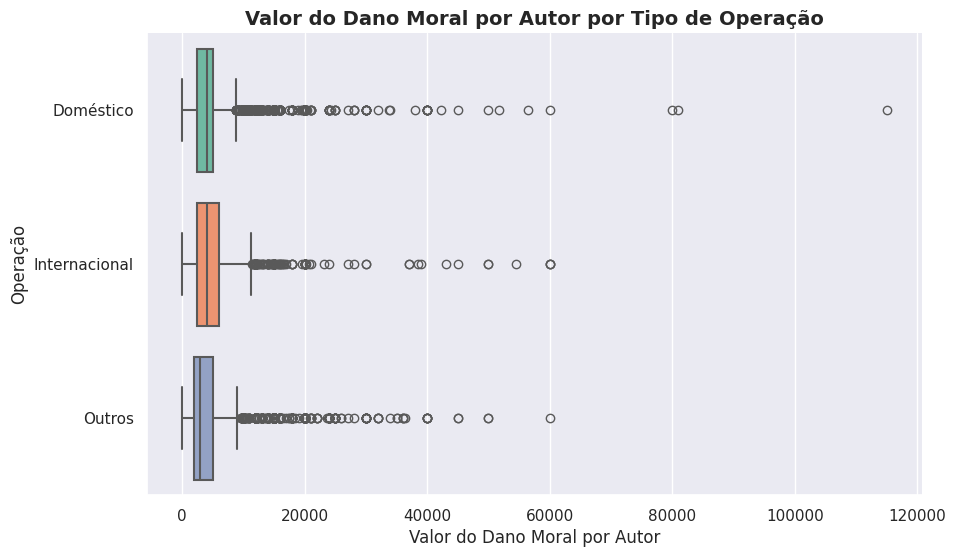

In [ ]:
# Filter the data
data = df6[df6.dano_moral_por_autor > 0].copy()

# Set the color palette
sns.set_palette("pastel")

# Create the horizontal boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(y='operacao', x='dano_moral_por_autor', data=data,
            hue='operacao',  # Assign y variable to hue to avoid deprecation warning
            palette='Set2',
            saturation=0.8,
            linewidth=1.5)

# Customize plot details
plt.title('Valor do Dano Moral por Autor por Tipo de Operação', fontsize=14, fontweight='bold')
plt.xlabel('Valor do Dano Moral por Autor', fontsize=12)
plt.ylabel('Operação', fontsize=12)
plt.legend([], [], frameon=False)  # Remove the legend

# Remove the top and right spines for a cleaner look
sns.despine()

# Display the plot
plt.show()


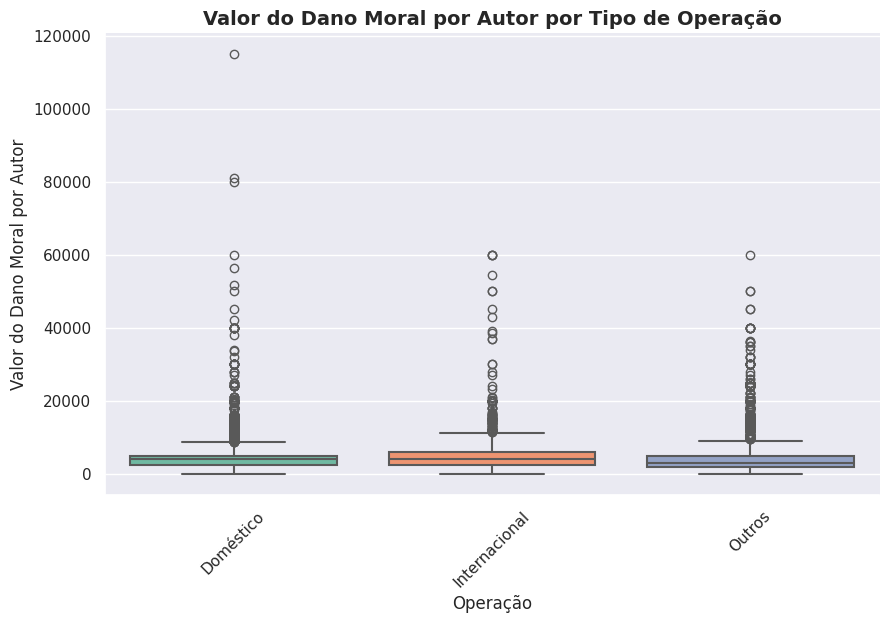

In [ ]:
# Filter the data
data = df6[df6.dano_moral_por_autor > 0].copy()

# Set the color palette
sns.set_palette("pastel")

# Create the boxplot with 'x' variable assigned to 'hue'
plt.figure(figsize=(10, 6))
sns.boxplot(x='operacao', y='dano_moral_por_autor', data=data,
            hue='operacao',  # Assign x variable to hue
            palette='Set2',  # Set color palette
            saturation=0.8,
            linewidth=1.5)

# Customize plot details
plt.title('Valor do Dano Moral por Autor por Tipo de Operação', fontsize=14, fontweight='bold')
plt.xlabel('Operação', fontsize=12)
plt.ylabel('Valor do Dano Moral por Autor', fontsize=12)
plt.xticks(rotation=45)
plt.legend([], [], frameon=False)  # Remove the legend

# Remove the top and right spines for a cleaner look
sns.despine()

# Display the plot
plt.show()



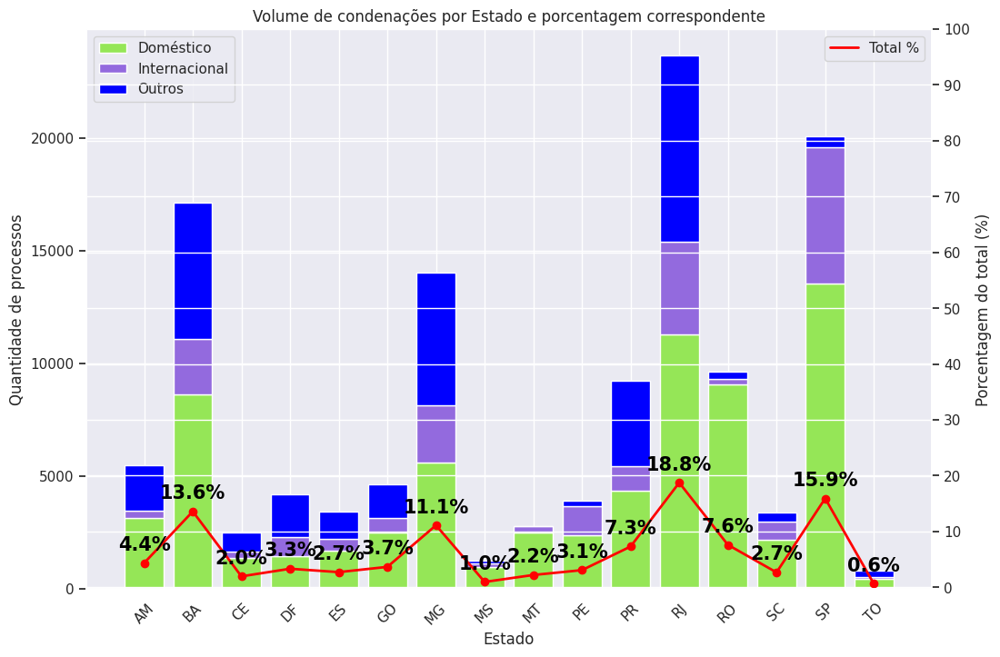

In [ ]:
data_all = df6.copy()

sub_bancos = {operacao: sub_df for operacao, sub_df in data_all.groupby('operacao')}

# Organizar os estados (UF) de forma consistente
all_states = data_all['UF'].unique()
all_states.sort()  # Ordena alfabeticamente

# Calcular contagem de processos por estado em data_all
total_counts = data_all['UF'].value_counts().reindex(all_states).fillna(0)

# Criar o gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Plotar os gráficos de barras para cada categoria em 'sub_bancos'
bottoms = [0] * len(all_states)  # Inicia o 'bottom' para a primeira barra

for name, df in sub_bancos.items():
    # Calcula a contagem de processos por estado para cada sub-banco
    case_counts = df['UF'].value_counts().reindex(all_states).fillna(0)
    # Adiciona o gráfico de barras para a categoria
    ax.bar(all_states, case_counts, bottom=bottoms, color=colors[name], label=name)
    # Atualiza 'bottoms' para empilhar as barras
    bottoms = [sum(x) for x in zip(bottoms, case_counts.values)]

# Criar um segundo eixo y para a linha de porcentagem total
ax2 = ax.twinx()

# Calcular e plotar a linha de porcentagem baseada em data_all
percentage = (total_counts / total_counts.sum()) * 100  # Calcula a porcentagem do total
ax2.plot(all_states, percentage, label='Total %', color=colors['data_all'], linewidth=2)
ax2.scatter(all_states, percentage, color=colors['data_all'])  # Adiciona pontos à linha de porcentagem

# Anota cada ponto na linha de porcentagem com rótulos em negrito
for i, (state, perc) in enumerate(zip(all_states, percentage)):
    ax2.annotate(f"{perc:.1f}%", (state, perc), textcoords="offset points", xytext=(0,10), ha='center', fontsize=15, fontweight='bold', color='black')

# Personalização do gráfico
ax.set_xlabel('Estado', fontsize=12)
ax.set_ylabel('Quantidade de processos', fontsize=12)
ax2.set_ylabel('Porcentagem do total (%)', fontsize=12)
ax.set_title('Volume de condenações por Estado e porcentagem correspondente')
ax.tick_params(axis='x', rotation=45)
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Formatação de grid e ticks do eixo y
ax.grid(True)
ax2.set_yticks(range(0, 101, 10))  # Ticks de porcentagem no eixo y secundário

plt.show()


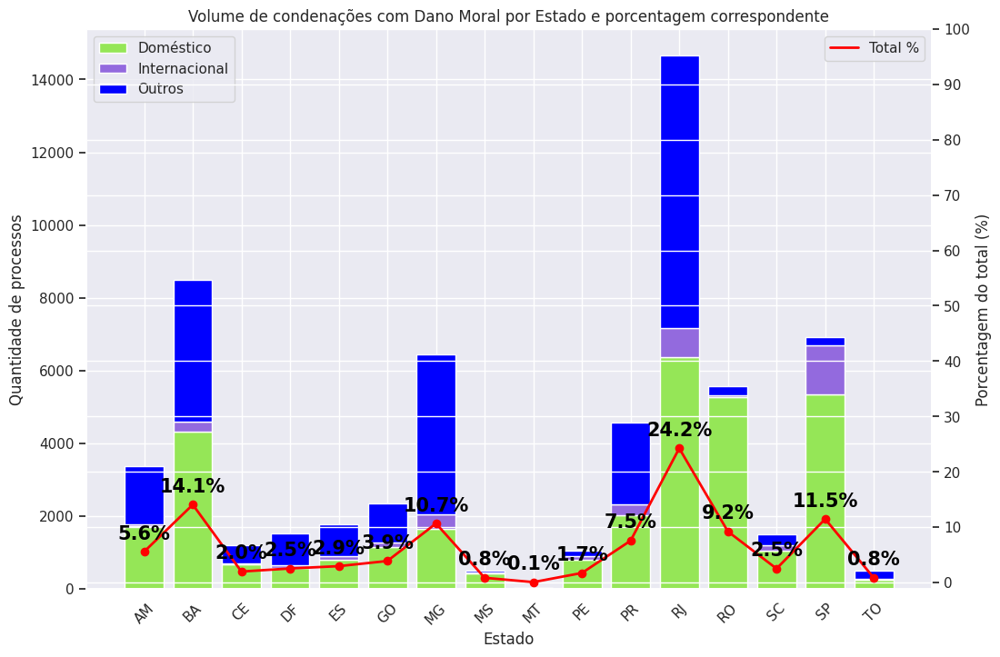

In [ ]:
data_all = df6[df6.dano_moral_por_autor > 0].copy()

sub_bancos = {operacao: sub_df for operacao, sub_df in data_all.groupby('operacao')}

# Organizar os estados (UF) de forma consistente
all_states = data_all['UF'].unique()
all_states.sort()  # Ordena alfabeticamente

# Calcular contagem de processos por estado em data_all
total_counts = data_all['UF'].value_counts().reindex(all_states).fillna(0)

# Criar o gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Plotar os gráficos de barras para cada categoria em 'sub_bancos'
bottoms = [0] * len(all_states)  # Inicia o 'bottom' para a primeira barra

for name, df in sub_bancos.items():
    # Calcula a contagem de processos por estado para cada sub-banco
    case_counts = df['UF'].value_counts().reindex(all_states).fillna(0)
    # Adiciona o gráfico de barras para a categoria
    ax.bar(all_states, case_counts, bottom=bottoms, color=colors[name], label=name)
    # Atualiza 'bottoms' para empilhar as barras
    bottoms = [sum(x) for x in zip(bottoms, case_counts.values)]

# Criar um segundo eixo y para a linha de porcentagem total
ax2 = ax.twinx()

# Calcular e plotar a linha de porcentagem baseada em data_all
percentage = (total_counts / total_counts.sum()) * 100  # Calcula a porcentagem do total
ax2.plot(all_states, percentage, label='Total %', color=colors['data_all'], linewidth=2)
ax2.scatter(all_states, percentage, color=colors['data_all'])  # Adiciona pontos à linha de porcentagem

# Anota cada ponto na linha de porcentagem com rótulos em negrito
for i, (state, perc) in enumerate(zip(all_states, percentage)):
    ax2.annotate(f"{perc:.1f}%", (state, perc), textcoords="offset points", xytext=(0,10), ha='center', fontsize=15, fontweight='bold', color='black')

# Personalização do gráfico
ax.set_xlabel('Estado', fontsize=12)
ax.set_ylabel('Quantidade de processos', fontsize=12)
ax2.set_ylabel('Porcentagem do total (%)', fontsize=12)
ax.set_title('Volume de condenações com Dano Moral por Estado e porcentagem correspondente')
ax.tick_params(axis='x', rotation=45)
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# Formatação de grid e ticks do eixo y
ax.grid(True)
ax2.set_yticks(range(0, 101, 10))  # Ticks de porcentagem no eixo y secundário

plt.show()
